<table class="table table-bordered">
    <tr>
        <th style="text-align:center;"><h1>Data Wrangling</h1><h2>Assignment 2 </h2><h3>Diploma in Data Science</h3></th>
    </tr>
</table>

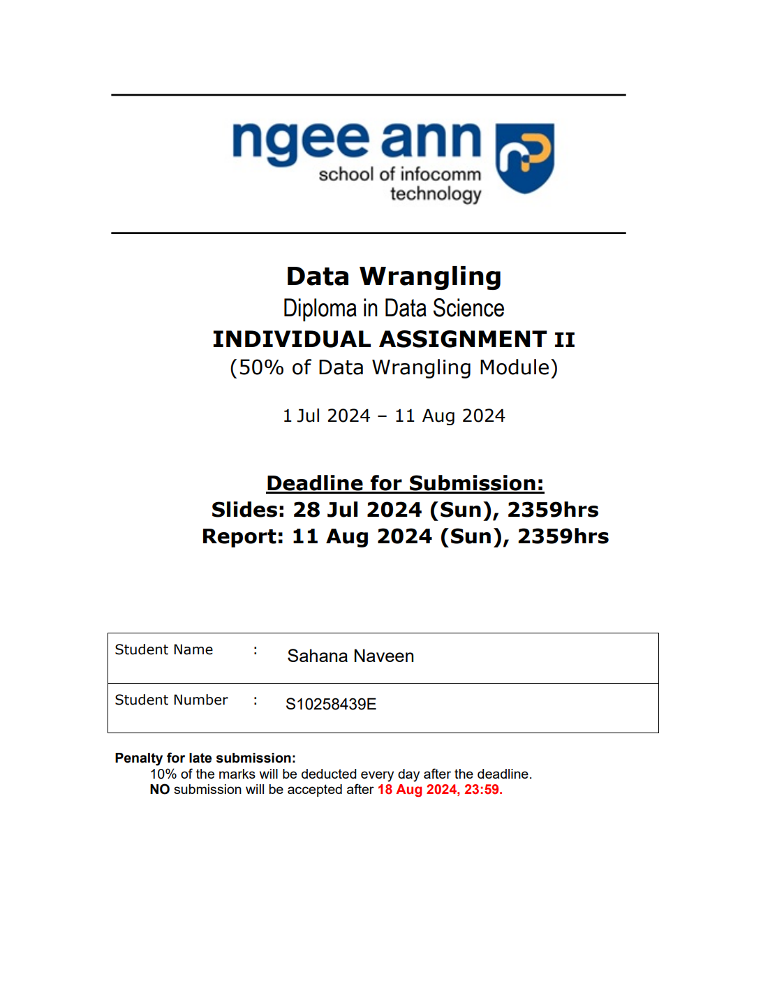

# Table of Contents<a id="part1"></a>

#### 1. [Introduction](#part1)
#### 2. [Project Objectives](#part2)
- [2.1 Target Audience](#part2.1)
- [2.2 Problem Statement](#part2.2)
- [2.3 Prediction Problem](#part2.3)
#### 3. [Problem Formulation](#part3)
- [3.1 Load Data ](#part3.1)
- [3.2 Understand the Data](#part3.2)
#### 4. [Data Wrangling on Multiple Tables](#part4)
- [4.1 Extract and Create Features from Different Tables](#part4.1)
- [4.2 Concatenate, Merge, or Join the Tables](#part4.2)
- [4.3 Explore the Data](#part4.3) 
#### 5. [Data Cleansing and Transformation](#part5)
- [5.1 Train Test Split](#part5.1)
- [5.2 Categorical Data](#part5.2)
- [5.3 Numerical Data](#part5.3)
- [5.4 Missing Value Imputation](#part5.4)
- [5.5 Categorical Data Encoding](#part5.5)
- [5.6 Outliers](#part5.6)
- [5.7 Transformation](#part5.7)
- [5.8 Variable Discretization / Binning](#part5.8)
- [5.9 Feature Engineer](#part5.9)
- [5.10  PCA](#part5.10)
#### 6. [Machine Learning Model](#part6)
- [6.1 Naive Baseline Model](#part6.1)
- [6.2 Logistic Regression Model (lbfgs)](#part6.2)
- [6.3 Logistic Regression Model (liblinear)](#part6.3)
- [6.4 Decision Tree Classifier](#part6.4)
#### 7. [Report](#part7)
- [7.1 Introduction with Value Based Problem Statement](#part7.1)
- [7.2 Problem Formulation](#part7.2)
- [7.3 Data Wrangling on multiple tables](#part7.3)
- [7.4 Data Cleansing and Transformation](#part7.4)
- [7.5 Machine Learning Model](#part7.5)
- [7.6 Summary and Further Improvements](#part7.6)
- [7.7 Reflection](#part7.7)

#### 8. [References](#part8)

# Introduction<a id="part1"></a>

This notebook provides a comprehensive overview of the Hall of Fame Prediction Model, detailing the entire data wrangling process and the rationale behind each step, clearly annotated in the comments. The notebook fulfils the assignment's aim to extract and explore data from a real-world database to formulate a prediction problem, create a consolidated tabular dataset from multiple sources and prepare the data for modelling. Additionally, it includes building and evaluating a simple machine learning model, with the final evaluation highlighting the achieved accuracy. The report thoroughly documents the process, analysis, comparisons and findings.

# Project Objectives<a id="part2"></a>

## Target Audience<a id="part2.1"></a>


Chief Executive Officer of Strike & Shoot - Advertising and Management Company              

## Problem Statement<a id="part2.2"></a>

How might we get new stars to sign with our company to work in sports endorsement through baseball?



##  Prediction Problem <a name="part2.3"></a>



Develop a predictive model to determine the likelihood of a baseball player being inducted into the Baseball Hall of Fame based on their career statistics and achievement, enabling strategic scouting of baseball advertisement ambassadors.

# Problem Formulation <a id="part3"></a>


##  Load the Data <a name="part3.1"></a>



In [1]:
# import the pacakges
import numpy as np
import pandas as pd
import feature_engine

# to split the datasets
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from feature_engine.encoding import OneHotEncoder
from sklearn.linear_model import LinearRegression
# for encoding using feature-engine
from category_encoders import HashingEncoder
from feature_engine.encoding import OneHotEncoder
from feature_engine.encoding import OrdinalEncoder
from feature_engine.encoding import MeanEncoder
from feature_engine.transformation import LogTransformer


# feature engine
import feature_engine.imputation as mdi
from feature_engine.encoding import OneHotEncoder, MeanEncoder, OrdinalEncoder
from feature_engine.discretisation import EqualFrequencyDiscretiser
from feature_engine.imputation import MeanMedianImputer
from feature_engine.transformation import BoxCoxTransformer
from feature_engine.transformation import PowerTransformer
from feature_engine.transformation import PowerTransformer
from feature_engine.transformation import ReciprocalTransformer
import feature_engine.imputation as mdi
from sklearn.pipeline import Pipeline
from feature_engine.imputation import MeanMedianImputer, CategoricalImputer
from feature_engine.outliers import Winsorizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from feature_engine.discretisation import EqualWidthDiscretiser
from feature_engine.transformation import YeoJohnsonTransformer
from sklearn.preprocessing import StandardScaler
from datetime import datetime

# Visual
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap




In [2]:
all_star_data = pd.read_csv('./DW Dataset ASG2/Datasets/CSV/all_star.csv')
all_star_data.columns

Index(['player_id', 'year', 'game_num', 'game_id', 'team_id', 'league_id',
       'gp', 'starting_pos'],
      dtype='object')

In [3]:
# Select only the relevant columns from the 'all_star_data' DataFrame
# Keep columns: 'player_id', 'year', 'game_id', 'team_id', 'league_id', and 'gp'
all_star_data = all_star_data[['player_id', 'year', 'game_id','team_id', 'league_id','gp']]
all_star_data.head()

,player_id,year,game_id,team_id,league_id,gp
0,gomezle01,1933,ALS193307060,NYA,AL,1.0
1,ferreri01,1933,ALS193307060,BOS,AL,1.0
2,gehrilo01,1933,ALS193307060,NYA,AL,1.0
3,gehrich01,1933,ALS193307060,DET,AL,1.0
4,dykesji01,1933,ALS193307060,CHA,AL,1.0


In [4]:
appearances_data = pd.read_csv('./DW Dataset ASG2/Datasets/CSV/appearances.csv')
appearances_data.columns

Index(['year', 'team_id', 'league_id', 'player_id', 'g_all', 'gs', 'g_batting',
       'g_defense', 'g_p', 'g_c', 'g_1b', 'g_2b', 'g_3b', 'g_ss', 'g_lf',
       'g_cf', 'g_rf', 'g_of', 'g_dh', 'g_ph', 'g_pr'],
      dtype='object')

In [5]:
# Select only the relevant columns from the 'appearances_data' DataFrame
# Keep columns: 'year', 'team_id', 'league_id', 'player_id', and various game appearance statistics
appearances_data = appearances_data[['year', 'team_id', 'league_id', 'player_id', 'g_all', 'gs', 'g_batting',
      'g_defense', 'g_p', 'g_c', 'g_1b', 'g_2b', 'g_3b', 'g_ss', 'g_lf',
      'g_cf', 'g_rf', 'g_of', 'g_dh', 'g_ph', 'g_pr']]
appearances_data.head()

,year,team_id,league_id,player_id,g_all,gs,g_batting,g_defense,g_p,g_c,...,g_2b,g_3b,g_ss,g_lf,g_cf,g_rf,g_of,g_dh,g_ph,g_pr
0,1871,BS1,NaN,barnero01,31.0,NaN,31,31.0,0,0,...,16,0,15,0,0,0,0,NaN,NaN,NaN
1,1871,BS1,NaN,barrofr01,18.0,NaN,18,18.0,0,0,...,1,0,0,13,0,4,17,NaN,NaN,NaN
2,1871,BS1,NaN,birdsda01,29.0,NaN,29,29.0,0,7,...,0,0,0,0,0,27,27,NaN,NaN,NaN
3,1871,BS1,NaN,conefr01,19.0,NaN,19,19.0,0,0,...,0,0,0,18,0,1,18,NaN,NaN,NaN
4,1871,BS1,NaN,gouldch01,31.0,NaN,31,31.0,0,0,...,0,0,0,0,0,1,1,NaN,NaN,NaN


In [6]:
batting_data = pd.read_csv('./DW Dataset ASG2/Datasets/CSV/batting.csv')
batting_data.columns

Index(['player_id', 'year', 'stint', 'team_id', 'league_id', 'g', 'ab', 'r',
       'h', 'double', 'triple', 'hr', 'rbi', 'sb', 'cs', 'bb', 'so', 'ibb',
       'hbp', 'sh', 'sf', 'g_idp'],
      dtype='object')

In [7]:
# Select only the relevant columns from the 'battling_data' DataFrame
batting_data = batting_data[['player_id', 'year','team_id', 'league_id', 'g', 'ab', 'r',
       'h', 'double', 'triple', 'hr', 'rbi', 'sb', 'cs', 'bb', 'so', 'ibb',
       'hbp', 'sh', 'sf', 'g_idp']]


In [8]:
# Drop rows from the 'batting_data' DataFrame where key column values 'league_id' or 'team_id' are missing
# This ensures that only records with complete information in these critical columns are retained
batting_data = batting_data.dropna(subset=['league_id', 'team_id'])

batting_data.head()

,player_id,year,team_id,league_id,g,ab,r,h,double,triple,...,rbi,sb,cs,bb,so,ibb,hbp,sh,sf,g_idp
737,addybo01,1876,CHN,NL,32,142.0,36.0,40.0,4.0,1.0,...,16.0,NaN,NaN,5.0,0.0,NaN,NaN,NaN,NaN,NaN
738,allisar01,1876,LS1,NL,31,130.0,9.0,27.0,2.0,1.0,...,10.0,NaN,NaN,2.0,6.0,NaN,NaN,NaN,NaN,NaN
739,allisdo01,1876,HAR,NL,44,163.0,19.0,43.0,4.0,0.0,...,15.0,NaN,NaN,3.0,9.0,NaN,NaN,NaN,NaN,NaN
740,andrufr01,1876,CHN,NL,8,36.0,6.0,11.0,3.0,0.0,...,2.0,NaN,NaN,0.0,5.0,NaN,NaN,NaN,NaN,NaN
741,ansonca01,1876,CHN,NL,66,309.0,63.0,110.0,9.0,7.0,...,59.0,NaN,NaN,12.0,8.0,NaN,NaN,NaN,NaN,NaN


In [9]:
fielding_data = pd.read_csv('./DW Dataset ASG2/Datasets/CSV/fielding.csv')
fielding_data.columns

Index(['player_id', 'year', 'stint', 'team_id', 'league_id', 'pos', 'g', 'gs',
       'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'zr'],
      dtype='object')

In [10]:
# Subset with relevant data features only
fielding_data = fielding_data[['player_id','team_id', 'league_id','year', 'pos', 'g', 'gs',
       'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'zr']]


In [11]:
# Drop rows from the 'fieldinging_data' DataFrame where key column values 'league_id' or 'team_id' are missing
# This ensures that only records with complete information in these critical columns are retained
fielding_data = fielding_data.dropna(subset=['league_id', 'team_id'])
fielding_data.head()

,player_id,team_id,league_id,year,pos,g,gs,inn_outs,po,a,e,dp,pb,wp,sb,cs,zr
1503,addybo01,CHN,NL,1876,OF,32,NaN,NaN,46.0,6.0,13.0,0.0,NaN,NaN,NaN,NaN,NaN
1504,allisar01,LS1,NL,1876,1B,8,NaN,NaN,90.0,1.0,4.0,2.0,NaN,NaN,NaN,NaN,NaN
1505,allisar01,LS1,NL,1876,OF,23,NaN,NaN,34.0,11.0,12.0,1.0,NaN,NaN,NaN,NaN,NaN
1506,allisdo01,HAR,NL,1876,C,40,NaN,NaN,201.0,43.0,33.0,2.0,12.0,NaN,NaN,NaN,NaN
1507,allisdo01,HAR,NL,1876,OF,6,NaN,NaN,5.0,0.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN


In [12]:
hall_of_fame_data = pd.read_csv('./DW Dataset ASG2/Datasets/CSV/hall_of_fame.csv')
hall_of_fame_data.columns

Index(['player_id', 'yearid', 'votedby', 'ballots', 'needed', 'votes',
       'inducted', 'category', 'needed_note'],
      dtype='object')

In [13]:
hall_of_fame_data['year'] = hall_of_fame_data['yearid'] #unify year coloumn name

In [14]:
hall_of_fame_data = hall_of_fame_data[hall_of_fame_data['votedby'] == 'BBWAA'] #filter only BBWAA as more data available (less missing value)


In [15]:
hall_of_fame_data= hall_of_fame_data[hall_of_fame_data['category'] == 'Player']#prediction model is only for players

In [16]:
# Subset of relevant data features only
hall_of_fame_data = hall_of_fame_data[['player_id', 'year', 'ballots', 'needed', 'votes','inducted', 'category']]
hall_of_fame_data.head()

,player_id,year,ballots,needed,votes,inducted,category
0,cobbty01,1936,226.0,170.0,222.0,Y,Player
1,ruthba01,1936,226.0,170.0,215.0,Y,Player
2,wagneho01,1936,226.0,170.0,215.0,Y,Player
3,mathech01,1936,226.0,170.0,205.0,Y,Player
4,johnswa01,1936,226.0,170.0,189.0,Y,Player


In [17]:
hall_of_fame_data['inducted'].unique()

array(['Y', 'N'], dtype=object)

In [18]:
pitching_data = pd.read_csv('./DW Dataset ASG2/Datasets/CSV/pitching.csv')
pitching_data.columns

Index(['player_id', 'year', 'stint', 'team_id', 'league_id', 'w', 'l', 'g',
       'gs', 'cg', 'sho', 'sv', 'ipouts', 'h', 'er', 'hr', 'bb', 'so', 'baopp',
       'era', 'ibb', 'wp', 'hbp', 'bk', 'bfp', 'gf', 'r', 'sh', 'sf', 'g_idp'],
      dtype='object')

In [19]:
pitching_data = pitching_data[['player_id','team_id', 'league_id','year',  'w', 'l', 'g',
       'gs', 'cg', 'sho', 'sv', 'ipouts', 'h', 'er', 'hr', 'bb', 'so', 'baopp',
       'era', 'ibb', 'wp', 'hbp', 'bk', 'bfp', 'gf', 'r', 'sh', 'sf', 'g_idp']]

In [20]:
pitching_data = pitching_data.dropna(subset=['league_id', 'team_id'])
pitching_data.head()

,player_id,team_id,league_id,year,w,l,g,gs,cg,sho,...,ibb,wp,hbp,bk,bfp,gf,r,sh,sf,g_idp
131,barnero01,CHN,NL,1876,0,0,1,0,0,0,...,NaN,0.0,NaN,0,13.0,0.0,8,NaN,NaN,NaN
132,blongjo01,SL3,NL,1876,0,0,1,0,0,0,...,NaN,0.0,NaN,0,14.0,1.0,0,NaN,NaN,NaN
133,bondto01,HAR,NL,1876,31,13,45,45,45,6,...,NaN,8.0,NaN,0,1623.0,0.0,164,NaN,NaN,NaN
134,bootham01,CN1,NL,1876,0,1,3,1,0,0,...,NaN,0.0,NaN,0,51.0,1.0,18,NaN,NaN,NaN
135,boothed01,NY3,NL,1876,0,0,1,0,0,0,...,NaN,0.0,NaN,0,34.0,1.0,10,NaN,NaN,NaN


In [21]:
player_data = pd.read_csv('./DW Dataset ASG2/Datasets/CSV/player.csv')
player_data.columns

Index(['player_id', 'birth_year', 'birth_month', 'birth_day', 'birth_country',
       'birth_state', 'birth_city', 'death_year', 'death_month', 'death_day',
       'death_country', 'death_state', 'death_city', 'name_first', 'name_last',
       'name_given', 'weight', 'height', 'bats', 'throws', 'debut',
       'final_game', 'retro_id', 'bbref_id'],
      dtype='object')

In [22]:
player_data = player_data[['player_id', 'birth_year', 'birth_month', 'birth_day', 'birth_country','birth_state', 'death_year', 'name_given', 'weight', 'height', 'bats', 'throws', 'debut','final_game']]
player_data.head()

,player_id,birth_year,birth_month,birth_day,birth_country,birth_state,death_year,name_given,weight,height,bats,throws,debut,final_game
0,aardsda01,1981.0,12.0,27.0,USA,CO,NaN,David Allan,220.0,75.0,R,R,2004-04-06,2015-08-23
1,aaronha01,1934.0,2.0,5.0,USA,AL,NaN,Henry Louis,180.0,72.0,R,R,1954-04-13,1976-10-03
2,aaronto01,1939.0,8.0,5.0,USA,AL,1984.0,Tommie Lee,190.0,75.0,R,R,1962-04-10,1971-09-26
3,aasedo01,1954.0,9.0,8.0,USA,CA,NaN,Donald William,190.0,75.0,R,R,1977-07-26,1990-10-03
4,abadan01,1972.0,8.0,25.0,USA,FL,NaN,Fausto Andres,184.0,73.0,L,L,2001-09-10,2006-04-13


### DateTime Data <a name="part5.4"></a>


In [23]:
# Convert the 'debut' column to datetime format
player_data['debut'] = pd.to_datetime(player_data['debut'])
player_data['final_game'] = pd.to_datetime(player_data['final_game'])

In [24]:
# Extract the year from the 'debut' column (which is in datetime format) and create a new column 'debut_year'
player_data['debut_year'] = player_data['debut'].dt.year

# Display the unique values in the 'debut_year' column to see all distinct debut years
player_data['debut_year'].unique()


array([2004., 1954., 1962., 1977., 2001., 2010., 1875., 1897., 1892.,
       1893., 1890., 1903., 1973., 1997., 1989., 1993., 1991., 1910.,
       1990., 1950., 1871., 2006., 1952., 1942., 1955., 1946., 1947.,
       1905., 1987., 1949., 1923., 1985., 1996., 2014., 2011., 2007.,
       1906., 2005., 2008., 1995., 1983., 1956., 1963., 1972., 1970.,
       1920., 1913., 1994.,   nan, 1958., 1931., 1941., 1925., 1939.,
       1914., 2013., 1969., 1879., 1975., 1948., 1902., 2012., 1967.,
       1982., 1922., 1912., 1928., 1895., 2003., 2002., 1998., 1981.,
       1980., 1880., 1979., 1911., 1884., 1986., 1964., 1929., 1988.,
       1978., 2015., 1976., 2000., 1943., 1917., 1971., 1937., 1992.,
       1919., 1961., 2009., 1999., 1926., 1872., 1966., 1932., 1883.,
       1933., 1974., 1960., 1936., 1916., 1959., 1898., 1968., 1885.,
       1965., 1984., 1915., 1957., 1889., 1909., 1907., 1894., 1876.,
       1944., 1953., 1904., 1927., 1930., 1938., 1908., 1934., 1882.,
       1945., 1899.,

In [25]:
# Extract the month from the 'debut' column (which is in datetime format) and create a new column 'debut_month'
player_data['debut_month'] = player_data['debut'].dt.month

# Display the unique values in the 'debut_month' column to see all distinct debut months
player_data['debut_month'].unique()


array([ 4.,  7.,  9.,  6.,  8., 10.,  3.,  5., nan])

In [26]:
# Extract the year from the 'final_game' column (which is in datetime format) and create a new column 'final_game_year'
player_data['final_game_year'] = player_data['final_game'].dt.year

# Display the unique values in the 'final_game_year' column to see all distinct final game years
player_data['final_game_year'].unique()


array([2015., 1976., 1971., 1990., 2006., 1875., 1910., 1896., 1897.,
       1890., 1905., 1984., 2001., 1999., 1996., 2004., 1957., 1871.,
       2008., 1952., 2005., 1944., 1972., 1947., 1949., 1911., 1992.,
       1956., 1923., 1985., 2014., 1942., 2011., 2009., 2012., 2003.,
       1959., 1964., 1975., 1922., 1918., 1997.,   nan, 1970., 1931.,
       1946., 1926., 1919., 1925., 1932., 1977., 1915., 2013., 1969.,
       1879., 1982., 1950., 1902., 1998., 1978., 1934., 1927., 1966.,
       1953., 1989., 1877., 1945., 1903., 1929., 1895., 1968., 2002.,
       1973., 1955., 1993., 2000., 1880., 1995., 1981., 1924., 1912.,
       1884., 1991., 1974., 1988., 1958., 1891., 1914., 2010., 1928.,
       1933., 1937., 1930., 1917., 2007., 1900., 1967., 1938., 1872.,
       1983., 1888., 1920., 1893., 1954., 1876., 1883., 1913., 1939.,
       1979., 1909., 1980., 1936., 1961., 1962., 1986., 1898., 1960.,
       1963., 1907., 1908., 1994., 1941., 1948., 1885., 1916., 1904.,
       1906., 1987.,

In [27]:
# Extract the month from the 'final_game' column (which is in datetime format) and create a new column 'final_game_month'
player_data['final_game_month'] = player_data['final_game'].dt.month

# Display the unique values in the 'final_game_month' column to see all distinct final game months
player_data['final_game_month'].unique()


array([ 8., 10.,  9.,  4.,  6.,  5.,  7., nan, 11.])


## Understand the Data <a name="part3.2"></a>


In [28]:
# Extract player_id from player_data
player_ids = player_data['player_id']

# Check if player_id exists in other data frames and print the results
def check_player_id_existence(df, df_name):
    exists = df['player_id'].isin(player_ids)
    count_exists = exists.sum()
    total_count = len(df)
    print(f"{count_exists} out of {total_count} player_ids in {df_name} exist in player_data")

check_player_id_existence(hall_of_fame_data, 'hall_of_fame_data')
check_player_id_existence(batting_data, 'batting_data')
check_player_id_existence(pitching_data, 'pitching_data')
check_player_id_existence(fielding_data, 'fielding_data')
check_player_id_existence(appearances_data, 'appearances_data')
check_player_id_existence(all_star_data, 'all_star_data')


3630 out of 3631 player_ids in hall_of_fame_data exist in player_data
100595 out of 100595 player_ids in batting_data exist in player_data
44008 out of 44008 player_ids in pitching_data exist in player_data
169023 out of 169023 player_ids in fielding_data exist in player_data
100944 out of 100951 player_ids in appearances_data exist in player_data
5068 out of 5069 player_ids in all_star_data exist in player_data


In [29]:

# Set of player IDs in player_data
player_ids = set(player_data['player_id'])

# Function to check and drop rows with missing player IDs in each table
def drop_missing_player_ids(df, player_ids, table_name):
    if 'player_id' in df.columns:
        # Identify rows with missing player IDs
        missing = df[~df['player_id'].isin(player_ids)]
        if not missing.empty:
            print(f"Dropping rows with missing player IDs in {table_name}:")
            print(missing[['player_id']].drop_duplicates())
            
        # Drop rows with missing player IDs
        df = df[df['player_id'].isin(player_ids)]
    return df

# Drop rows with missing player IDs
all_star_data = drop_missing_player_ids(all_star_data, player_ids, 'all_star')
appearances_data = drop_missing_player_ids(appearances_data, player_ids, 'appearances')
batting_data = drop_missing_player_ids(batting_data, player_ids, 'batting')
fielding_data = drop_missing_player_ids(fielding_data, player_ids, 'fielding_outfield')
#fielding_outfield_data = drop_missing_player_ids(fielding_outfield_data, player_ids, 'fielding')
hall_of_fame_data = drop_missing_player_ids(hall_of_fame_data, player_ids, 'hall_of_fame')
#manager_data = drop_missing_player_ids(manager_data, player_ids, 'manager')
pitching_data = drop_missing_player_ids(pitching_data, player_ids, 'pitching')

# Verify the changes
for table_name, df in {
    'all_star': all_star_data,
    'appearances': appearances_data,
    'batting': batting_data,
    'fielding': fielding_data,
    'hall_of_fame': hall_of_fame_data,
    'pitching': pitching_data,
}.items():
    print(f"{table_name} after dropping rows with missing player IDs:")
    print(df.head())

# Example output handling
if not any(df['player_id'].isna().any() for df in {
    'all_star': all_star_data,
    'appearances': appearances_data,
    'batting': batting_data,
    'fielding': fielding_data,
    'hall_of_fame': hall_of_fame_data,
    'pitching': pitching_data,
}.values()):
    print("All player IDs in all tables are found in player_data.")
else:
    print("Some player IDs are still missing in some tables.")


Dropping rows with missing player IDs in all_star:
       player_id
4965  carperma01
Dropping rows with missing player IDs in appearances:
       player_id
98162  harriwi10
98279  castiru02
98471  pricebr10
98522   rosajo01
98568  smithch09
98701  arrueba01
98761  furcara02
Dropping rows with missing player IDs in hall_of_fame:
      player_id
4041  nomohid01
all_star after dropping rows with missing player IDs:
   player_id  year       game_id team_id league_id   gp
0  gomezle01  1933  ALS193307060     NYA        AL  1.0
1  ferreri01  1933  ALS193307060     BOS        AL  1.0
2  gehrilo01  1933  ALS193307060     NYA        AL  1.0
3  gehrich01  1933  ALS193307060     DET        AL  1.0
4  dykesji01  1933  ALS193307060     CHA        AL  1.0
appearances after dropping rows with missing player IDs:
   year team_id league_id  player_id  g_all  gs  g_batting  g_defense  g_p  \
0  1871     BS1       NaN  barnero01   31.0 NaN         31       31.0    0   
1  1871     BS1       NaN  barrofr0


# Data Wrangling on Multiple Tables <a name="part4"></a>



##  Extract and Create Features from Different Tables <a name="part4.1"></a>


In [30]:
# Group by player, team, and league and calculate total hits, at-bats, home runs, and RBIs for batting average
career_batting = batting_data.groupby(['player_id', 'team_id', 'league_id']).agg({
    'h': 'sum',
    'ab': 'sum',
    'bb': 'sum',
    'hbp': 'sum',
    'sh': 'sum',
    'sf': 'sum',
    'double': 'sum',
    'triple': 'sum',
    'hr': 'sum',
    'so': 'sum'
}).reset_index()

# Calculate batting average, OBP, and SLG
career_batting['batting_average'] = career_batting['h'] / career_batting['ab']
career_batting['obp'] = (career_batting['h'] + career_batting['bb'] + career_batting['hbp']) / (career_batting['ab'] + career_batting['bb'] + career_batting['sh'] + career_batting['sf'] + career_batting['hbp'])
career_batting['slg'] = (career_batting['h'] - career_batting['double'] - career_batting['triple'] - career_batting['hr'] + 2 * career_batting['double'] + 3 * career_batting['triple'] + 4 * career_batting['hr']) / career_batting['ab']

# Print batting career statistics
print("Batting Career Statistics:")
print(career_batting)

# Group by player, team, and league and calculate total wins, earned runs, innings pitched, and strikeouts for pitching statistics
career_pitching = pitching_data.groupby(['player_id', 'team_id', 'league_id']).agg({
    'w': 'sum',
    'er': 'sum',
    'ipouts': 'sum',
    'so': 'sum',
    'bb': 'sum',
    'h': 'sum'
}).reset_index()

# Calculate ERA and WHIP
career_pitching['era'] = (career_pitching['er'] / (career_pitching['ipouts'] / 3)) * 9
career_pitching['whip'] = 3 * (career_pitching['h'] + career_pitching['bb']) / career_pitching['ipouts']

# Print pitching career statistics
print("\nPitching Career Statistics:")
print(career_pitching)

# Group by player, team, and league and calculate total games, putouts, assists, errors, etc. for fielding statistics
career_fielding = fielding_data.groupby(['player_id', 'team_id', 'league_id', 'pos']).agg({
 'g': 'sum',
 'gs': 'sum',
 'inn_outs': 'sum',
 'po': 'sum',
 'a': 'sum',
 'e': 'sum',
 'dp': 'sum',
 'pb': 'sum',
 'wp': 'sum',
 'sb': 'sum',
 'cs': 'sum'
}).reset_index()

# Print fielding career statistics
print("\nFielding Career Statistics:")
print(career_fielding)

# Group by player, team, and league and calculate total games played for appearances
career_appearances = appearances_data.groupby(['player_id', 'team_id', 'league_id']).agg({
    'g_all': 'sum'
}).reset_index()

# Print appearances career statistics
print("\nAppearances Career Statistics:")
print(career_appearances)

# Count all-star appearances
career_all_star = all_star_data.groupby('player_id').size().reset_index(name='all_star_appearances')

# Print all-star appearances career statistics
print("\nAll-Star Appearances Career Statistics:")
print(career_all_star)

# Count the number of seasons played
player_data['seasons_played'] = player_data['player_id'].apply(lambda pid: len(set(appearances_data.loc[appearances_data['player_id'] == pid, 'year'])))
player_data['last_season'] = player_data['final_game'].apply(lambda date: date.year)

# Calculate age at debut and final game
player_data['age_at_debut'] = player_data['debut_year'] - player_data['birth_year']
player_data['age_at_final_game'] = player_data['final_game_year'] - player_data['birth_year']

# Calculate career duration in years
player_data['career_duration'] = player_data['final_game_year'] - player_data['debut_year']



Batting Career Statistics:
       player_id team_id league_id      h      ab     bb  hbp    sh   sf  \
0      aardsda01     ATL        NL    0.0     1.0    0.0  0.0   0.0  0.0   
1      aardsda01     BOS        AL    0.0     1.0    0.0  0.0   0.0  0.0   
2      aardsda01     CHA        AL    0.0     0.0    0.0  0.0   0.0  0.0   
3      aardsda01     CHN        NL    0.0     2.0    0.0  0.0   1.0  0.0   
4      aardsda01     NYA        AL    0.0     0.0    0.0  0.0   0.0  0.0   
...          ...     ...       ...    ...     ...    ...  ...   ...  ...   
43204  zuverge01     DET        AL    8.0    68.0    1.0  0.0   9.0  0.0   
43205  zwilldu01     CHA        AL   16.0    87.0   11.0  1.0   1.0  0.0   
43206  zwilldu01     CHF        FL  342.0  1140.0  113.0  3.0  28.0  0.0   
43207  zwilldu01     CHN        NL    6.0    53.0    4.0  0.0   2.0  0.0   
43208   zychto01     SEA        AL    0.0     0.0    0.0  0.0   0.0  0.0   

       double  triple    hr     so  batting_average       ob


##  Concatenate, Merge, or Join the Tables <a name="part4.2"></a>


In [31]:
# Merge all career statistics into a single DataFrame
career_stats = pd.merge(career_batting, career_pitching, on=['player_id', 'team_id', 'league_id'], how='outer')
career_stats = pd.merge(career_stats, career_fielding, on=['player_id', 'team_id', 'league_id'], how='outer')
career_stats = pd.merge(career_stats, career_appearances, on=['player_id', 'team_id', 'league_id'], how='outer')
career_stats = pd.merge(career_stats, career_all_star, on='player_id', how='outer')
career_stats = pd.merge(career_stats, player_data[['age_at_debut', 'age_at_final_game','career_duration', 'player_id', 'seasons_played',
                        'last_season', 'debut_year', 'debut_month', 'final_game_year', 'final_game_month']], on='player_id', how='outer')

# Print all career statistics
print("\nAll Career Statistics:")
print(career_stats)

# Merge career_stats with hall_of_fame_data
HoF_df = career_stats.merge(hall_of_fame_data, on='player_id', how='left')

# Print the final DataFrame with Hall of Fame data
print("\nFinal DataFrame with Hall of Fame Data:")
print(HoF_df)


All Career Statistics:
       player_id team_id league_id    h_x      ab   bb_x  hbp    sh   sf  \
0      aardsda01     ATL        NL    0.0     1.0    0.0  0.0   0.0  0.0   
1      aardsda01     BOS        AL    0.0     1.0    0.0  0.0   0.0  0.0   
2      aardsda01     CHA        AL    0.0     0.0    0.0  0.0   0.0  0.0   
3      aardsda01     CHN        NL    0.0     2.0    0.0  0.0   1.0  0.0   
4      aardsda01     NYA        AL    0.0     0.0    0.0  0.0   0.0  0.0   
...          ...     ...       ...    ...     ...    ...  ...   ...  ...   
83050  zwilldu01     CHA        AL   16.0    87.0   11.0  1.0   1.0  0.0   
83051  zwilldu01     CHF        FL  342.0  1140.0  113.0  3.0  28.0  0.0   
83052  zwilldu01     CHF        FL  342.0  1140.0  113.0  3.0  28.0  0.0   
83053  zwilldu01     CHN        NL    6.0    53.0    4.0  0.0   2.0  0.0   
83054   zychto01     SEA        AL    0.0     0.0    0.0  0.0   0.0  0.0   

       double  ...  all_star_appearances  age_at_debut  age_at_

In [32]:
# Filter the DataFrame to include only records from the year 1980 onwards
# This selection helps focus on more recent data and ensures fewer missing values in the dataset
HoF_df = HoF_df[HoF_df['year'] >= 1980]

In [33]:
HoF_df.columns

Index(['player_id', 'team_id', 'league_id', 'h_x', 'ab', 'bb_x', 'hbp', 'sh',
       'sf', 'double', 'triple', 'hr', 'so_x', 'batting_average', 'obp', 'slg',
       'w', 'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pos', 'g',
       'gs', 'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'g_all',
       'all_star_appearances', 'age_at_debut', 'age_at_final_game',
       'career_duration', 'seasons_played', 'last_season', 'debut_year',
       'debut_month', 'final_game_year', 'final_game_month', 'year', 'ballots',
       'needed', 'votes', 'inducted', 'category'],
      dtype='object')

In [34]:
HoF_df.shape

(12627, 53)

In [35]:
HoF_df['inducted'].unique()

array(['Y', 'N'], dtype=object)

In [36]:
# Map the 'inducted' column values
HoF_df['inducted'] = HoF_df['inducted'].map({'Y':1, 'N': 0})


In [37]:
HoF_df['inducted'].isnull().mean()

0.0

In [38]:
HoF_df.isnull().mean().sort_values()

player_id               0.000000
votes                   0.000000
needed                  0.000000
ballots                 0.000000
year                    0.000000
final_game_month        0.000000
final_game_year         0.000000
debut_month             0.000000
debut_year              0.000000
last_season             0.000000
seasons_played          0.000000
career_duration         0.000000
age_at_final_game       0.000000
age_at_debut            0.000000
g_all                   0.000000
inducted                0.000000
category                0.000000
team_id                 0.000000
league_id               0.000000
h_x                     0.000000
ab                      0.000000
bb_x                    0.000000
hbp                     0.000000
sh                      0.000000
sf                      0.000000
double                  0.000000
triple                  0.000000
hr                      0.000000
so_x                    0.000000
sb                      0.002217
cs        

In [39]:
# Calculate the mean of NaN values for each column
nan_means = HoF_df.isnull().mean()

# Identify columns to drop (those with NaN mean of 0.98 or higher)
columns_to_drop = nan_means[nan_means == 0.99].index

# Drop the identified columns from the DataFrame
HoF_df = HoF_df.drop(columns=columns_to_drop)

# Verify the columns have been dropped
print(f"Columns dropped: {list(columns_to_drop)}")
print(f"Remaining columns: {HoF_df.columns}")


Columns dropped: []
Remaining columns: Index(['player_id', 'team_id', 'league_id', 'h_x', 'ab', 'bb_x', 'hbp', 'sh',
       'sf', 'double', 'triple', 'hr', 'so_x', 'batting_average', 'obp', 'slg',
       'w', 'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pos', 'g',
       'gs', 'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'g_all',
       'all_star_appearances', 'age_at_debut', 'age_at_final_game',
       'career_duration', 'seasons_played', 'last_season', 'debut_year',
       'debut_month', 'final_game_year', 'final_game_month', 'year', 'ballots',
       'needed', 'votes', 'inducted', 'category'],
      dtype='object')


In [40]:
HoF_df.columns

Index(['player_id', 'team_id', 'league_id', 'h_x', 'ab', 'bb_x', 'hbp', 'sh',
       'sf', 'double', 'triple', 'hr', 'so_x', 'batting_average', 'obp', 'slg',
       'w', 'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pos', 'g',
       'gs', 'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'g_all',
       'all_star_appearances', 'age_at_debut', 'age_at_final_game',
       'career_duration', 'seasons_played', 'last_season', 'debut_year',
       'debut_month', 'final_game_year', 'final_game_month', 'year', 'ballots',
       'needed', 'votes', 'inducted', 'category'],
      dtype='object')

In [41]:
# Calculate the percentage of NaN values in each row
HoF_df['NaN_percentage'] = HoF_df.isnull().mean(axis=1) * 100
HoF_df = HoF_df[HoF_df['NaN_percentage']<=80]


In [42]:
HoF_df= HoF_df.drop(columns=['NaN_percentage'])


In [43]:
# # Step 3: Drop the 'player_id' column to avoid bias
# HoF_df = HoF_df.drop(columns=['player_id','name_given', 'debut', 'final_game', 'category','team_id_batting',
#        ])

In [44]:
# Step 3: Drop the 'player_id' column to avoid bias
HoF_df = HoF_df.drop(columns=['player_id','category'
       ])

In [45]:
# find numerical variables
num_cols = [c for c in HoF_df.columns if HoF_df[c].dtypes !='O']
HoF_df[num_cols].isnull().mean().sort_values()

h_x                     0.000000
needed                  0.000000
ballots                 0.000000
year                    0.000000
final_game_month        0.000000
final_game_year         0.000000
debut_month             0.000000
debut_year              0.000000
last_season             0.000000
seasons_played          0.000000
career_duration         0.000000
age_at_final_game       0.000000
age_at_debut            0.000000
g_all                   0.000000
votes                   0.000000
inducted                0.000000
ab                      0.000000
bb_x                    0.000000
hbp                     0.000000
sh                      0.000000
sf                      0.000000
double                  0.000000
triple                  0.000000
hr                      0.000000
so_x                    0.000000
cs                      0.002217
sb                      0.002217
wp                      0.002217
inn_outs                0.002217
dp                      0.002217
g         

In [46]:
# Ensure there are no infinite values in X
HoF_df.replace([np.inf, -np.inf], np.nan, inplace=True)




##  Explore the Data <a name="part4.3"></a>



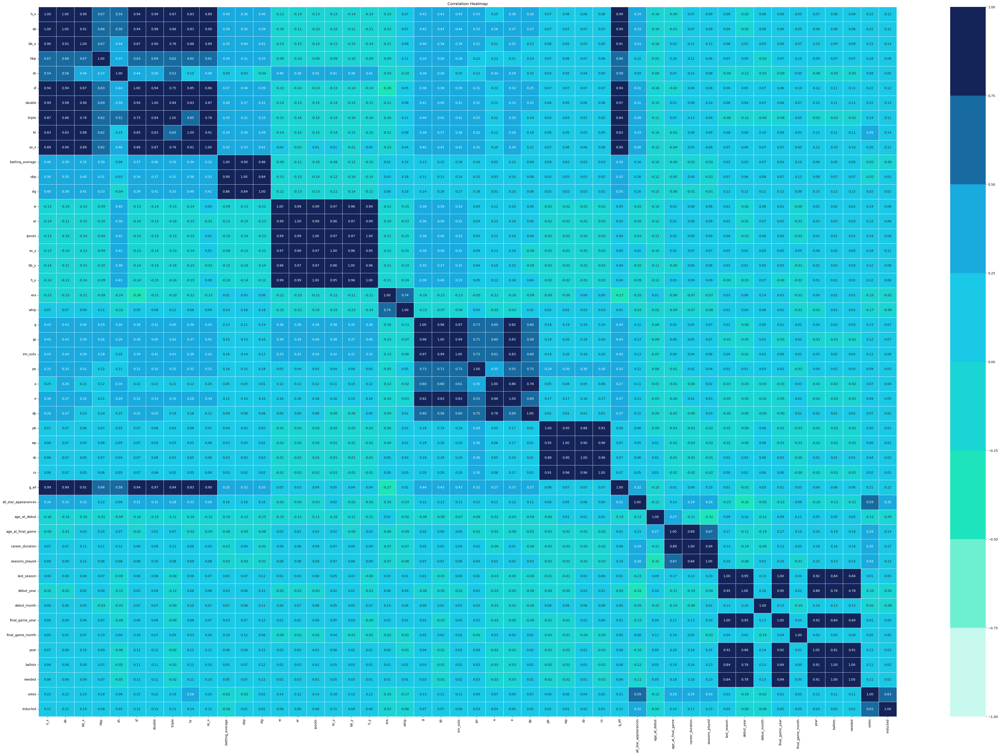

In [47]:
# Define your custom color scheme from lightest to darkest
custom_colors = ['#C7F9EE', '#6DF0D2', '#1DE4BD', '#1BD4D4', '#1AC9E6', '#19AADE', '#176BA0', '#142459']
cmap_custom = ListedColormap(custom_colors)

# Convert numeric columns to the correct data type if necessary
HoF_df[num_cols] = HoF_df[num_cols].apply(pd.to_numeric, errors='coerce')

# Calculate the correlation matrix
corr_matrix = HoF_df[num_cols].corr()

# Set up the matplotlib figure
plt.figure(figsize=(60, 40))

# Draw the heatmap
sns.heatmap(corr_matrix, cmap=cmap_custom, annot=True, fmt=".2f", linewidths=.5, vmin=-1, vmax=1)

plt.title("Correlation Heatmap")
plt.show()

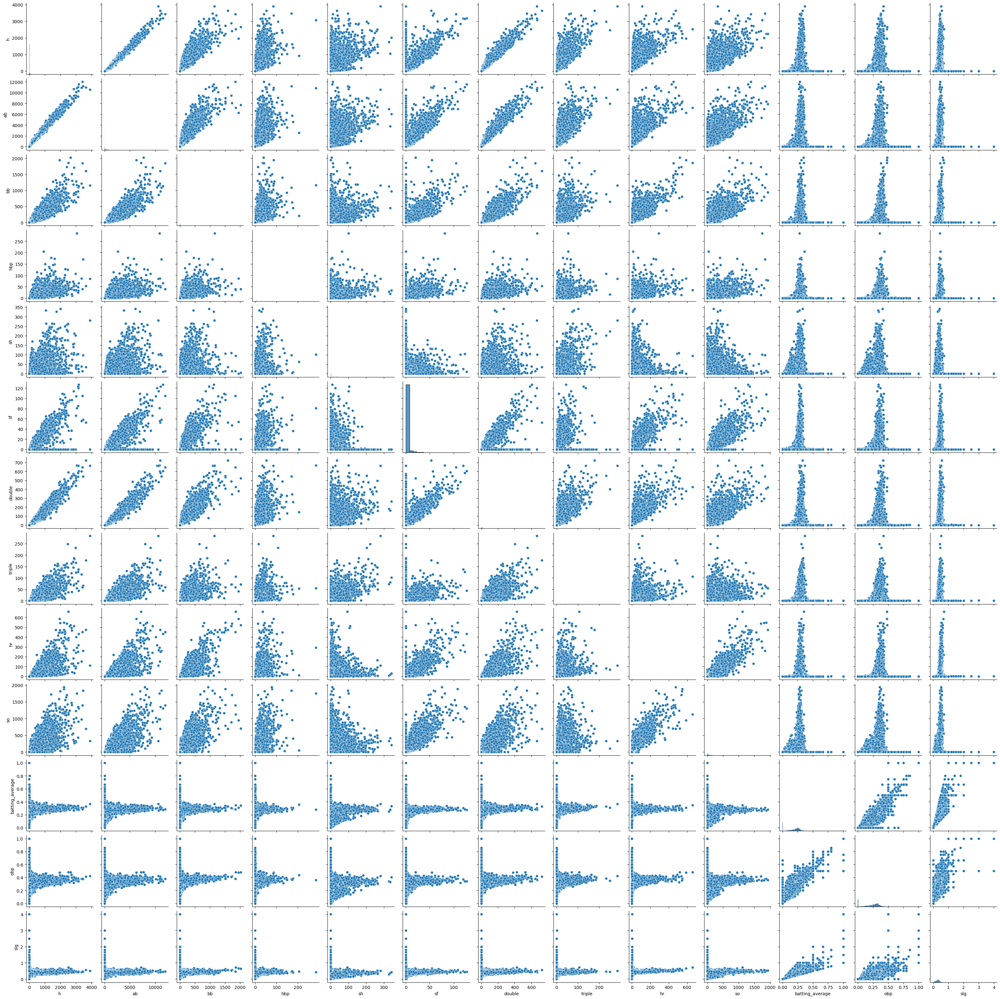

In [48]:
# Pairplot for batting career statistics
sns.pairplot(career_batting)
plt.show()




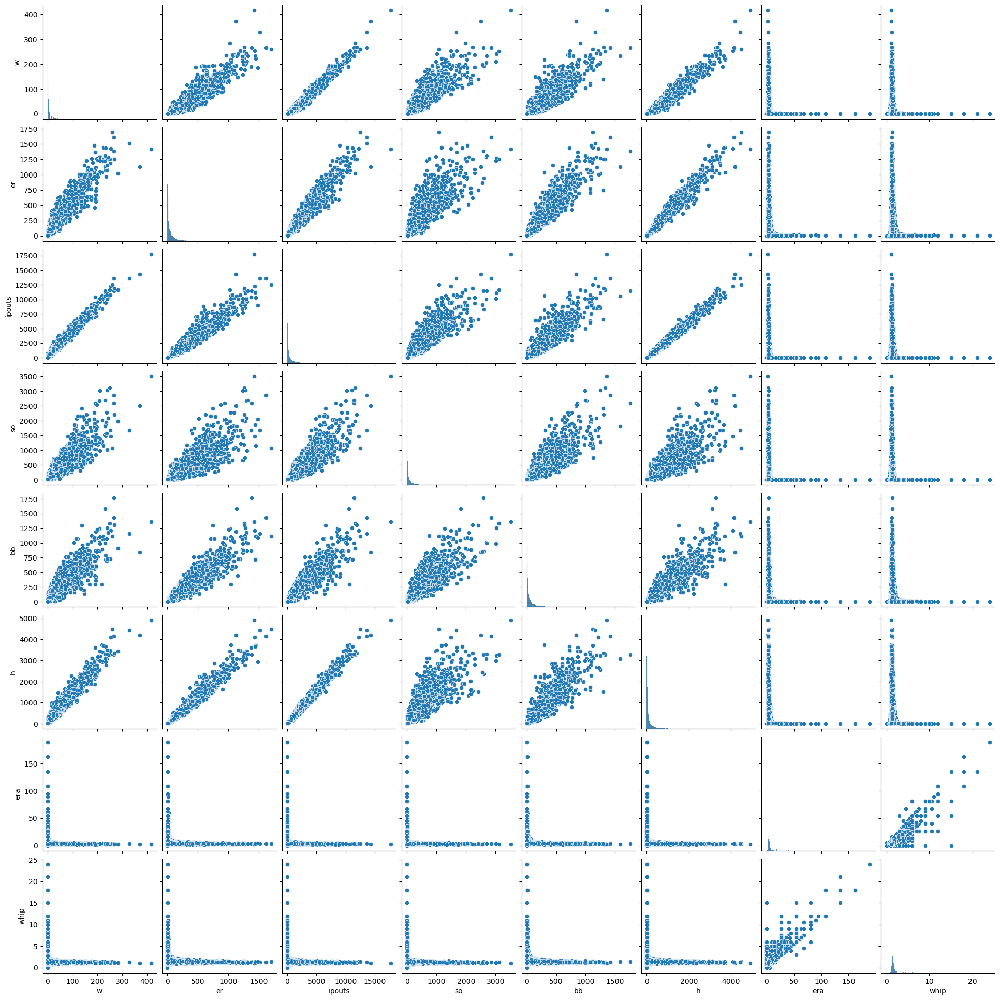

In [49]:
# Pairplot for pitching career statistics
sns.pairplot(career_pitching)
plt.show()

In [50]:
career_batting.columns

Index(['player_id', 'team_id', 'league_id', 'h', 'ab', 'bb', 'hbp', 'sh', 'sf',
       'double', 'triple', 'hr', 'so', 'batting_average', 'obp', 'slg'],
      dtype='object')

In [51]:
num_cols_EDA =[ 'h', 'ab', 'bb', 'hbp', 'sh', 'sf','double', 'triple', 'hr', 'so', 'batting_average', 'obp', 'slg']

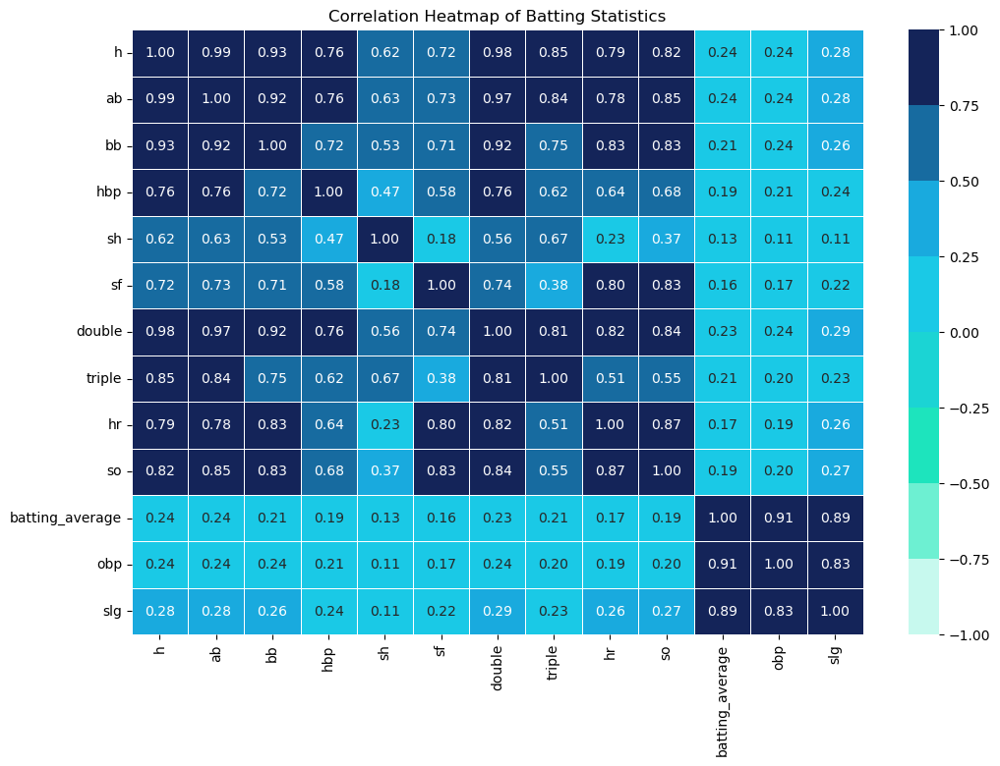

In [52]:
# Define your custom color scheme from lightest to darkest
custom_colors = ['#C7F9EE', '#6DF0D2', '#1DE4BD', '#1BD4D4', '#1AC9E6', '#19AADE', '#176BA0', '#142459']
cmap_custom = ListedColormap(custom_colors)

# Convert numeric columns to the correct data type if necessary
career_batting[num_cols_EDA] = career_batting[num_cols_EDA].apply(pd.to_numeric, errors='coerce')

# Calculate the correlation matrix
corr_matrix = career_batting[num_cols_EDA].corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Draw the heatmap
sns.heatmap(corr_matrix, cmap=cmap_custom, annot=True, fmt=".2f", linewidths=.5, vmin=-1, vmax=1)

plt.title("Correlation Heatmap of Batting Statistics")
plt.show()

In [53]:
career_pitching.columns

Index(['player_id', 'team_id', 'league_id', 'w', 'er', 'ipouts', 'so', 'bb',
       'h', 'era', 'whip'],
      dtype='object')

In [54]:
num_cols_EDA =[ 'w', 'er', 'ipouts', 'so', 'bb',
       'h', 'era', 'whip']

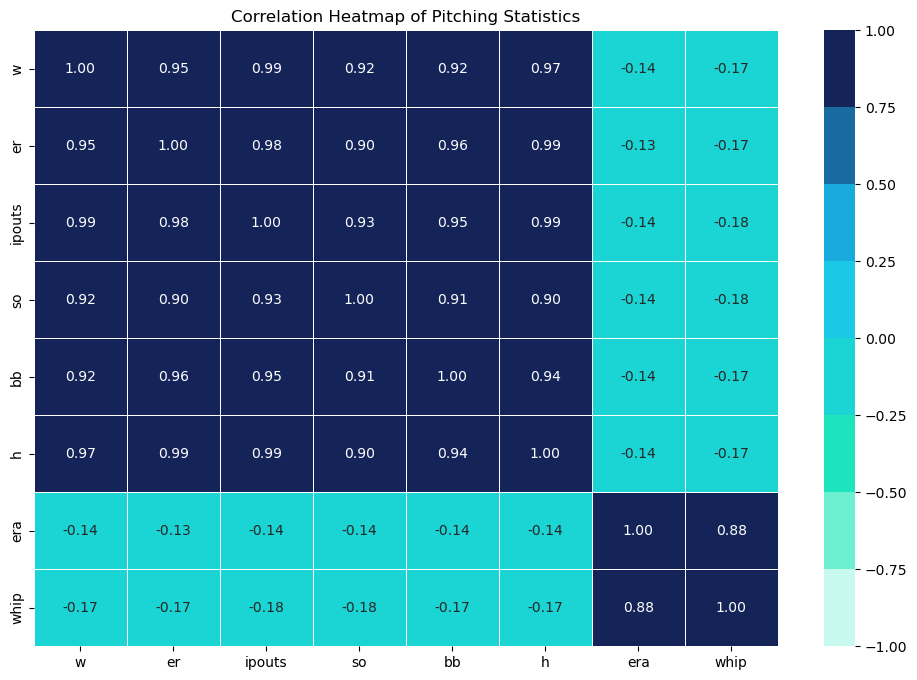

In [55]:
# Define your custom color scheme from lightest to darkest
custom_colors = ['#C7F9EE', '#6DF0D2', '#1DE4BD', '#1BD4D4', '#1AC9E6', '#19AADE', '#176BA0', '#142459']
cmap_custom = ListedColormap(custom_colors)

# Convert numeric columns to the correct data type if necessary
career_pitching[num_cols_EDA] = career_pitching[num_cols_EDA].apply(pd.to_numeric, errors='coerce')

# Calculate the correlation matrix
corr_matrix = career_pitching[num_cols_EDA].corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Draw the heatmap
sns.heatmap(corr_matrix, cmap=cmap_custom, annot=True, fmt=".2f", linewidths=.5, vmin=-1, vmax=1)

plt.title("Correlation Heatmap of Pitching Statistics")
plt.show()

In [56]:
career_fielding.columns

Index(['player_id', 'team_id', 'league_id', 'pos', 'g', 'gs', 'inn_outs', 'po',
       'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs'],
      dtype='object')

In [57]:
num_cols_EDA =[  'g', 'gs', 'inn_outs', 'po', 'a',
       'e', 'dp', 'pb', 'wp', 'sb', 'cs']

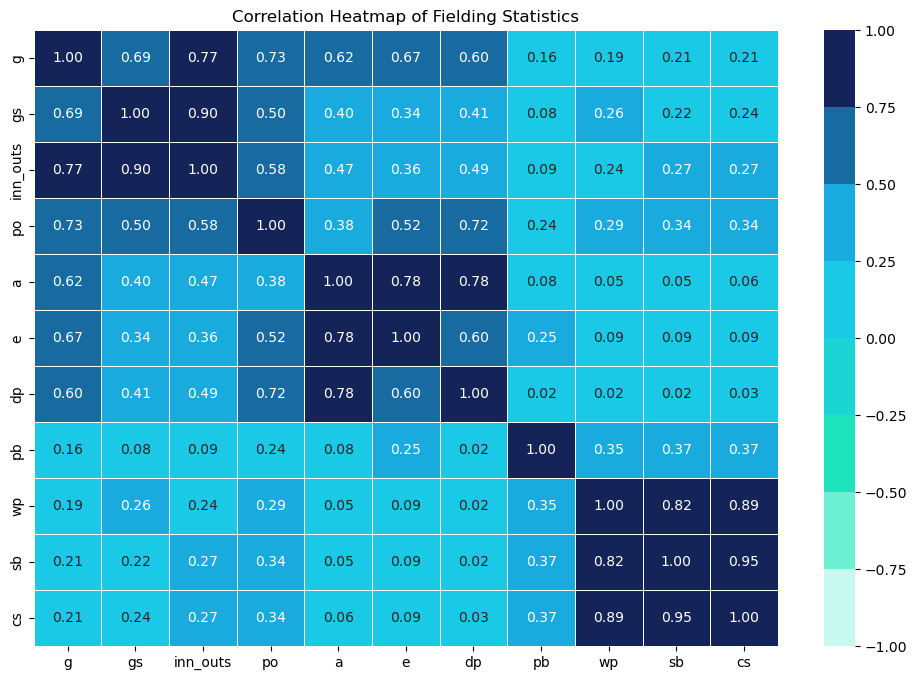

In [58]:
# Define your custom color scheme from lightest to darkest
custom_colors = ['#C7F9EE', '#6DF0D2', '#1DE4BD', '#1BD4D4', '#1AC9E6', '#19AADE', '#176BA0', '#142459']
cmap_custom = ListedColormap(custom_colors)

# Convert numeric columns to the correct data type if necessary
career_fielding[num_cols_EDA] = career_fielding[num_cols_EDA].apply(pd.to_numeric, errors='coerce')

# Calculate the correlation matrix
corr_matrix = career_fielding[num_cols_EDA].corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Draw the heatmap
sns.heatmap(corr_matrix, cmap=cmap_custom, annot=True, fmt=".2f", linewidths=.5, vmin=-1, vmax=1)

plt.title("Correlation Heatmap of Fielding Statistics")
plt.show()

In [59]:
HoF_df.columns

Index(['team_id', 'league_id', 'h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf',
       'double', 'triple', 'hr', 'so_x', 'batting_average', 'obp', 'slg', 'w',
       'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pos', 'g', 'gs',
       'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'g_all',
       'all_star_appearances', 'age_at_debut', 'age_at_final_game',
       'career_duration', 'seasons_played', 'last_season', 'debut_year',
       'debut_month', 'final_game_year', 'final_game_month', 'year', 'ballots',
       'needed', 'votes', 'inducted'],
      dtype='object')

In [60]:
factors_inducted = HoF_df[['g_all',
       'all_star_appearances', 'age_at_debut', 'age_at_final_game',
       'career_duration', 'seasons_played', 'last_season', 'debut_year',
       'debut_month', 'final_game_year', 'final_game_month', 'year', 'ballots',
       'needed', 'votes',  'inducted']]

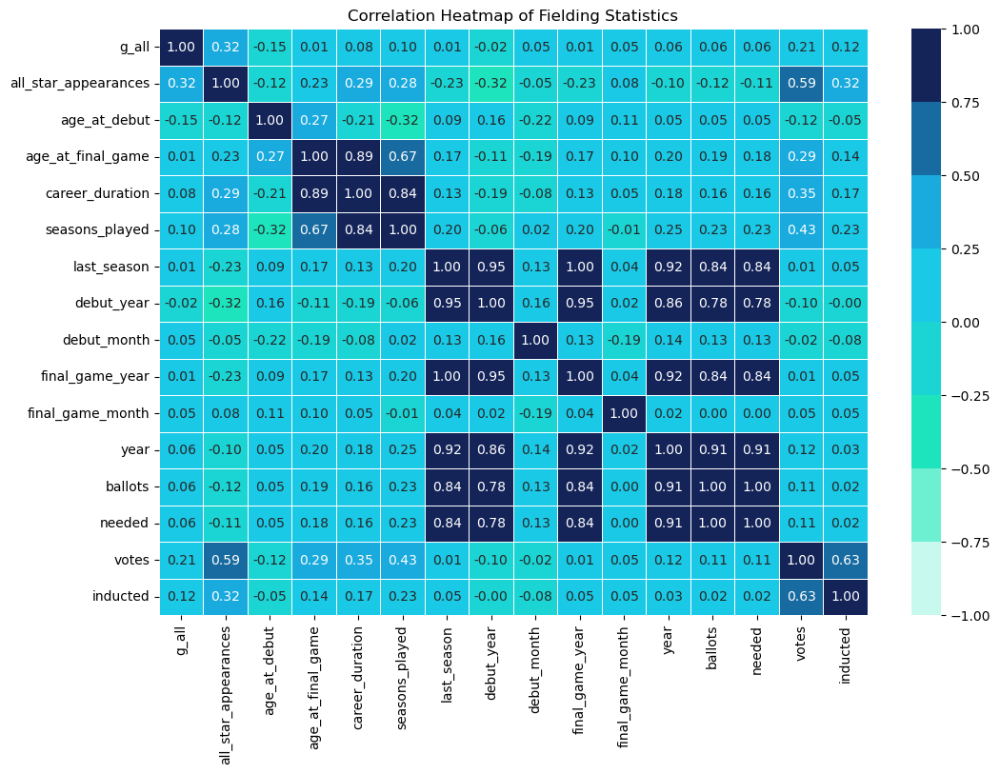

In [61]:
# Define your custom color scheme from lightest to darkest
custom_colors = ['#C7F9EE', '#6DF0D2', '#1DE4BD', '#1BD4D4', '#1AC9E6', '#19AADE', '#176BA0', '#142459']
cmap_custom = ListedColormap(custom_colors)

# Convert numeric columns to the correct data type if necessary
factors_inducted = factors_inducted.apply(pd.to_numeric, errors='coerce')

# Calculate the correlation matrix
corr_matrix = factors_inducted.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Draw the heatmap
sns.heatmap(corr_matrix, cmap=cmap_custom, annot=True, fmt=".2f", linewidths=.5, vmin=-1, vmax=1)

plt.title("Correlation Heatmap of Fielding Statistics")
plt.show()

C:\Users\sahan\AppData\Local\Temp\ipykernel_25220\674855837.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='league_id', data=career_stats, palette=custom_colors)
C:\Users\sahan\AppData\Local\Temp\ipykernel_25220\674855837.py:14: UserWarning: The palette list has more values (8) than needed (6), which may not be intended.
  sns.countplot(x='league_id', data=career_stats, palette=custom_colors)


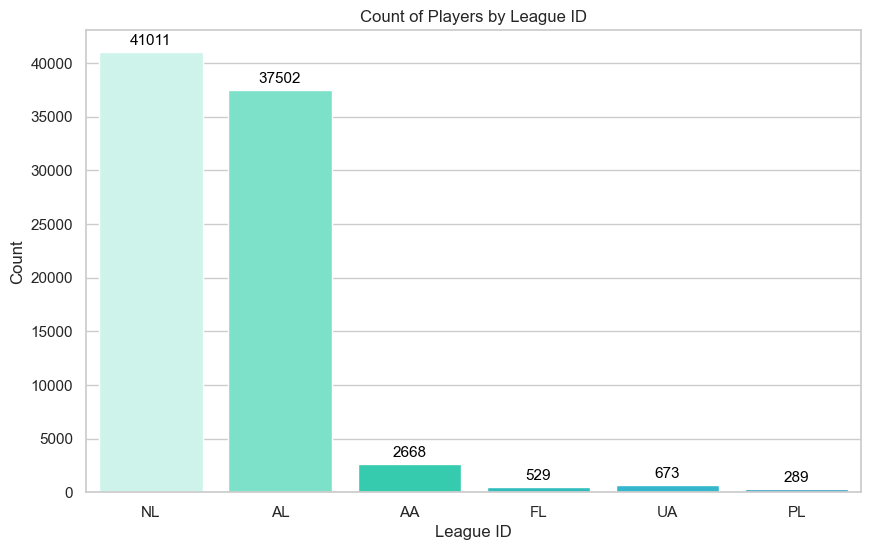

In [62]:
# Define custom color scheme
custom_colors = ['#C7F9EE', '#6DF0D2', '#1DE4BD', '#1BD4D4', '#1AC9E6', '#19AADE', '#176BA0', '#142459']
cmap_custom = ListedColormap(custom_colors)

# Combine necessary features for visualization
combined_stats = HoF_df[['h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf',
                         'double', 'triple', 'hr', 'so_x', 'batting_average', 'obp', 'slg', 'inducted']]

# Set plot style
sns.set(style="whitegrid")

# 1. Count Plot for League ID
plt.figure(figsize=(10, 6))
sns.countplot(x='league_id', data=career_stats, palette=custom_colors)
plt.title('Count of Players by League ID')
plt.xlabel('League ID')
plt.ylabel('Count')
for p in plt.gca().patches:
 plt.gca().annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
    ha='center', va='baseline', fontsize=11, color='black', xytext=(0, 5), textcoords='offset points')
plt.show()

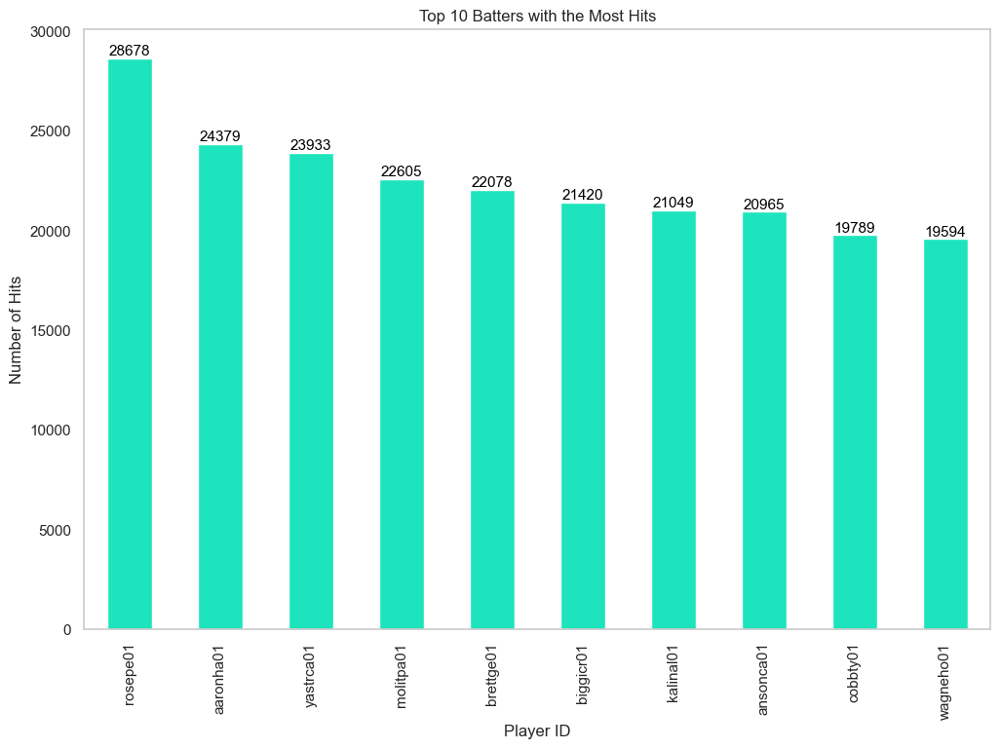

In [63]:

# Group by player_id, team_id, and league_id, and sum the hits
batting_hits = career_stats.groupby('player_id')['h_x'].sum()

# Sort the values to get the top 10 players with the most hits
top_10_batters = batting_hits.sort_values(ascending=False).head(10)

# Plot the data
plt.figure(figsize=(12, 8))
top_10_batters.plot(kind='bar', color=custom_colors[2], title='Top 10 Batters with the Most Hits')
plt.xlabel('Player ID')
plt.ylabel('Number of Hits')
plt.grid(False) 

# Annotate bars with the hit counts
for index, value in enumerate(top_10_batters):
    plt.text(index, value, int(value), ha='center', va='bottom', fontsize=11, color='black')

plt.show()


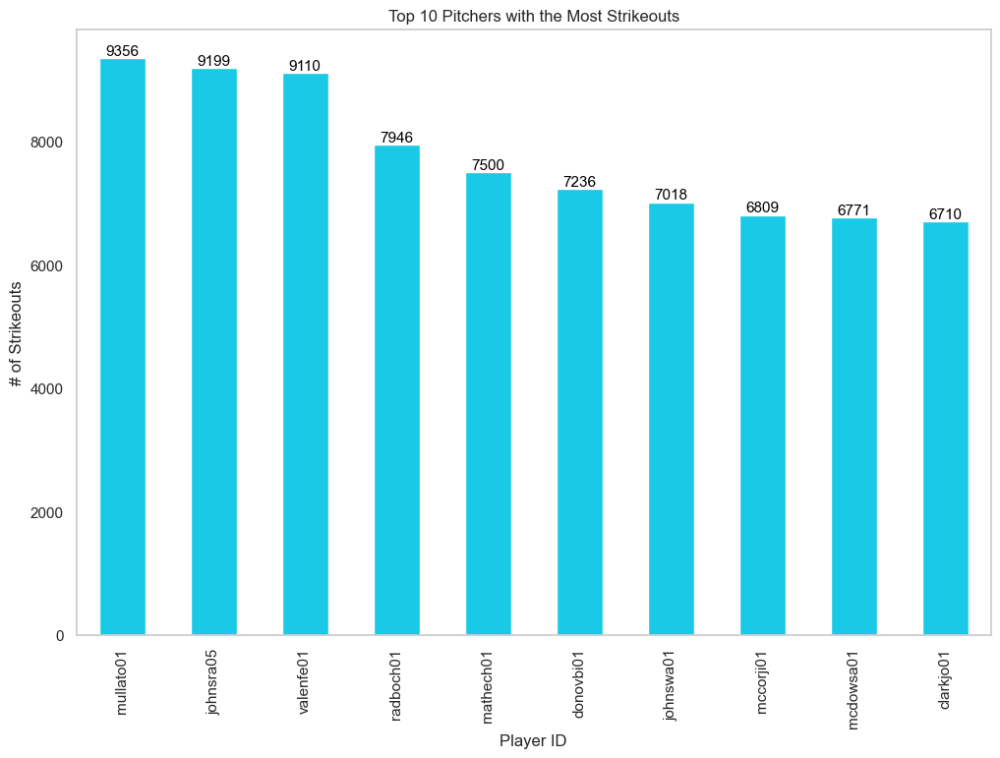

In [64]:
pitching_strikeouts = career_stats.groupby('player_id')['so_y'].sum()

# Sort the values to get the top 10 players with the most strikeouts
top_10_pitchers = pitching_strikeouts.sort_values(ascending=False).head(10)

# Plot the data
plt.figure(figsize=(12, 8))
top_10_pitchers.plot(kind='bar', color=custom_colors[4], title='Top 10 Pitchers with the Most Strikeouts')
plt.xlabel('Player ID')
plt.ylabel('# of Strikeouts')
plt.grid(False)  # Remove the grid

# Annotate bars with the strikeout counts
for index, value in enumerate(top_10_pitchers):
    plt.text(index, value, int(value), ha='center', va='bottom', fontsize=11, color='black')

plt.show()

C:\Users\sahan\AppData\Local\Temp\ipykernel_25220\273593943.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=fielding_putouts.index, y=fielding_putouts.values, palette=custom_colors)
C:\Users\sahan\AppData\Local\Temp\ipykernel_25220\273593943.py:6: UserWarning: 
The palette list has fewer values (8) than needed (10) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x=fielding_putouts.index, y=fielding_putouts.values, palette=custom_colors)


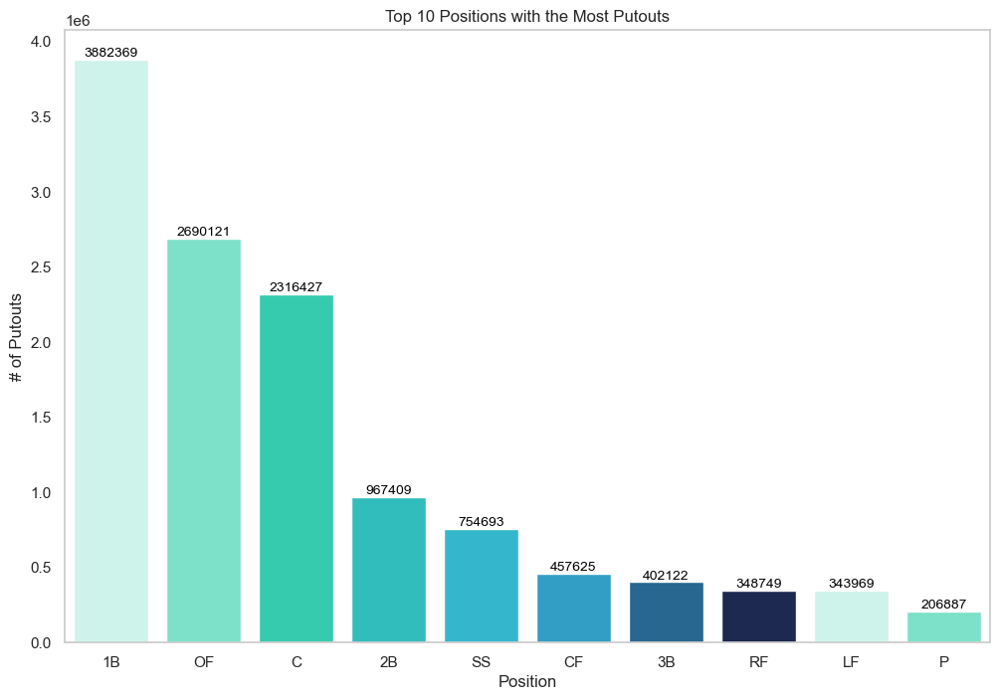

In [65]:
# Group by position and sum the putouts
fielding_putouts = career_fielding.groupby('pos')['po'].sum().sort_values(ascending=False).head(10)

# Plot the data
plt.figure(figsize=(12, 8))
sns.barplot(x=fielding_putouts.index, y=fielding_putouts.values, palette=custom_colors)
plt.title('Top 10 Positions with the Most Putouts')
plt.xlabel('Position')
plt.ylabel('# of Putouts')
plt.grid(False)  # Remove the grid

# Annotate bars with the putouts counts
for index, value in enumerate(fielding_putouts.values):
    plt.text(index, value, int(value), ha='center', va='bottom', fontsize=10, color='black')

plt.show()


C:\Users\sahan\AppData\Local\Temp\ipykernel_25220\2795518293.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=positions_played.index, y=positions_played.values, palette=custom_colors)
C:\Users\sahan\AppData\Local\Temp\ipykernel_25220\2795518293.py:6: UserWarning: 
The palette list has fewer values (8) than needed (10) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x=positions_played.index, y=positions_played.values, palette=custom_colors)


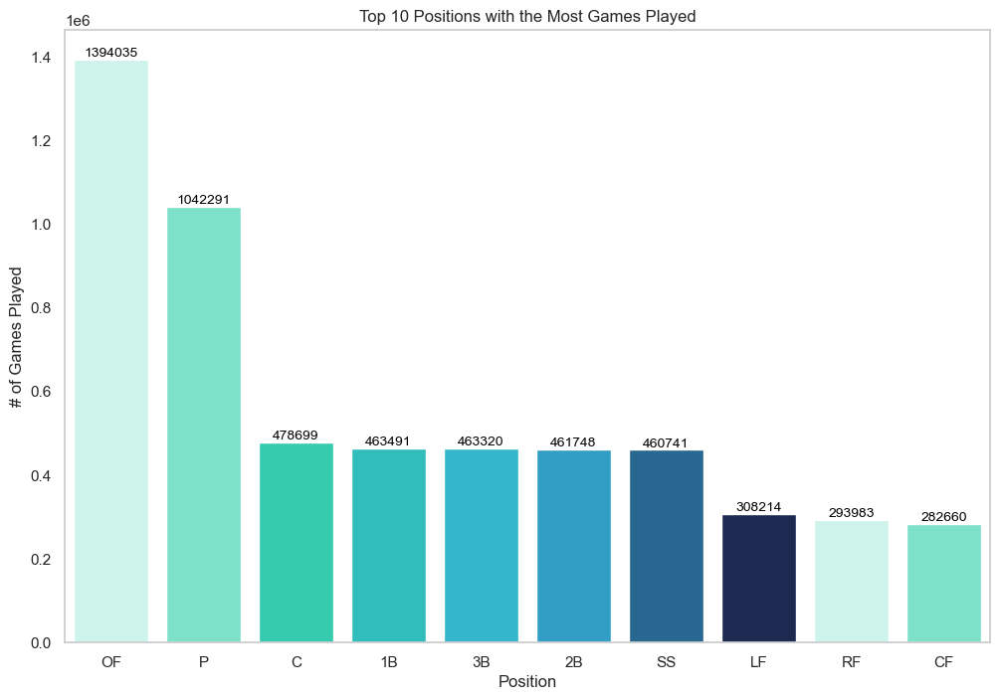

In [66]:

# Group by position and sum the games played
positions_played = fielding_data.groupby('pos')['g'].sum().sort_values(ascending=False).head(10)

# Plot the data
plt.figure(figsize=(12, 8))
sns.barplot(x=positions_played.index, y=positions_played.values, palette=custom_colors)
plt.title('Top 10 Positions with the Most Games Played')
plt.xlabel('Position')
plt.ylabel('# of Games Played')
plt.grid(False)  # Remove the grid

# Annotate bars with the games played counts
for index, value in enumerate(positions_played.values):
    plt.text(index, value, str(value), ha='center', va='bottom', fontsize=10, color='black')

plt.show()


In [67]:
import pandas as pd

# Assuming all_star_data is already loaded
# all_star_data = pd.read_csv('path_to_all_star_data.csv')

# Count the number of All-Star appearances for each player
all_star_counts = all_star_data.groupby('player_id').size().reset_index(name='all_star_appearances')

# Sort the players by the number of All-Star appearances in descending order and select the top 10
top_10_all_star_players = all_star_counts.sort_values(by='all_star_appearances', ascending=False).head(10)

# Extract the player IDs of the top 10 players with the most All-Star appearances
top_10_player_ids = top_10_all_star_players['player_id'].tolist()

print("Player IDs of the top 10 players with the most All-Star appearances:")
print(top_10_player_ids)


Player IDs of the top 10 players with the most All-Star appearances:
['aaronha01', 'musiast01', 'mayswi01', 'mantlmi01', 'ripkeca01', 'willite01', 'yastrca01', 'kalinal01', 'berrayo01', 'robinbr01']



Basic Information for the Top 10 Players with the Most All-Star Appearances:
       player_id  birth_year  birth_month  birth_day birth_country  \
1      aaronha01      1934.0          2.0        5.0           USA   
1211   berrayo01      1925.0          5.0       12.0           USA   
8698   kalinal01      1934.0         12.0       19.0           USA   
10480  mantlmi01      1931.0         10.0       20.0           USA   
10817   mayswi01      1931.0          5.0        6.0           USA   
12162  musiast01      1920.0         11.0       21.0           USA   
14302  ripkeca01      1960.0          8.0       24.0           USA   
14413  robinbr01      1937.0          5.0       18.0           USA   
18305  willite01      1918.0          8.0       30.0           USA   
18661  yastrca01      1939.0          8.0       22.0           USA   

      birth_state  death_year       name_given  weight  height  ...  \
1              AL         NaN      Henry Louis   180.0    72.0  ...   
1211     

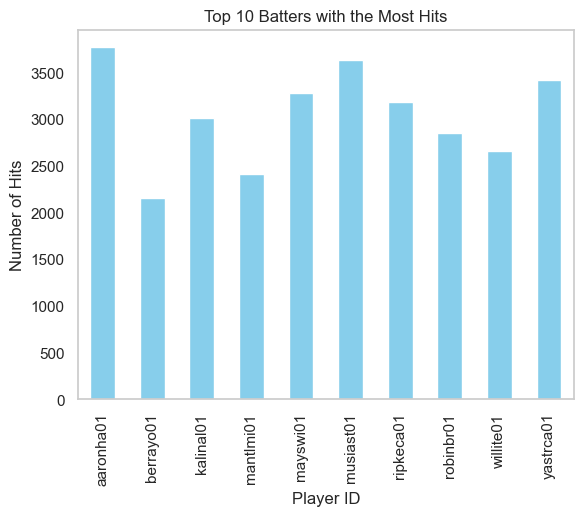

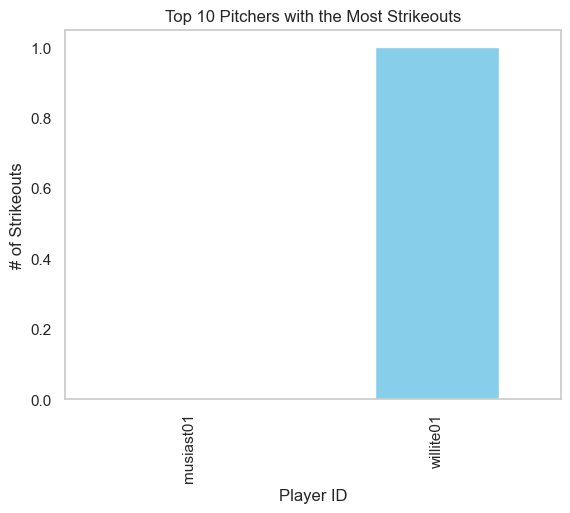

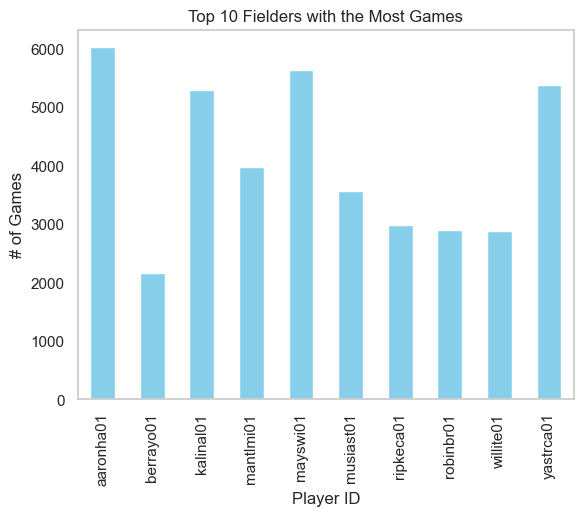

In [68]:
# Extract the basic information for the top 10 players with the most All-Star appearances
top_10_player_info = player_data[player_data['player_id'].isin(top_10_player_ids)]

print("\nBasic Information for the Top 10 Players with the Most All-Star Appearances:")
print(top_10_player_info)


### Step 2: Explore Batting Statistics

# Extract batting statistics for the top 10 players
top_10_batting_stats = batting_data[batting_data['player_id'].isin(top_10_player_ids)]

# Group by player and calculate total hits, at-bats, home runs, and RBIs for the top 10 players
top_10_career_batting = top_10_batting_stats.groupby('player_id').agg({
 'h': 'sum',
 'ab': 'sum',
 'bb': 'sum',
 'hbp': 'sum',
 'sh': 'sum',
 'sf': 'sum',
 'double': 'sum',
 'triple': 'sum',
 'hr': 'sum',
 'so': 'sum'
}).reset_index()

print("\nBatting Statistics for the Top 10 Players with the Most All-Star Appearances:")
print(top_10_career_batting)


### Step 3: Explore Pitching Statistics

# Extract pitching statistics for the top 10 players
top_10_pitching_stats = pitching_data[pitching_data['player_id'].isin(top_10_player_ids)]

# Group by player and calculate total wins, earned runs, innings pitched, and strikeouts for the top 10 players
top_10_career_pitching = top_10_pitching_stats.groupby('player_id').agg({
 'w': 'sum',
 'er': 'sum',
 'ipouts': 'sum',
 'so': 'sum',
 'bb': 'sum',
 'h': 'sum'
}).reset_index()

print("\nPitching Statistics for the Top 10 Players with the Most All-Star Appearances:")
print(top_10_career_pitching)


### Step 4: Explore Fielding Statistics

# Extract fielding statistics for the top 10 players
top_10_fielding_stats = fielding_data[fielding_data['player_id'].isin(top_10_player_ids)]

# Group by player and calculate total games, putouts, assists, errors, etc. for the top 10 players
top_10_career_fielding = top_10_fielding_stats.groupby('player_id').agg({
 'g': 'sum',
 'gs': 'sum',
 'inn_outs': 'sum',
 'po': 'sum',
 'a': 'sum',
 'e': 'sum',
 'dp': 'sum',
 'pb': 'sum',
 'wp': 'sum',
 'sb': 'sum',
 'cs': 'sum'
}).reset_index()

print("\nFielding Statistics for the Top 10 Players with the Most All-Star Appearances:")
print(top_10_career_fielding)


### Step 5: Visualize the Statistics
#### Batting Statistics Visualization

import matplotlib.pyplot as plt

# Plot the top 10 batters' total hits
top_10_career_batting.set_index('player_id')['h'].plot(kind='bar', title='Top 10 Batters with the Most Hits', ylabel='Number of Hits', color='skyblue')
plt.xlabel('Player ID')
plt.ylabel('Number of Hits')
plt.grid(False)
plt.show()


#### Pitching Statistics Visualization

# Plot the top 10 pitchers' total strikeouts
top_10_career_pitching.set_index('player_id')['so'].plot(kind='bar', title='Top 10 Pitchers with the Most Strikeouts', ylabel='# of Strikeouts', color='skyblue')
plt.xlabel('Player ID')
plt.ylabel('# of Strikeouts')
plt.grid(False)
plt.show()


#### Fielding Statistics Visualization

# Plot the top 10 fielders' total games
top_10_career_fielding.set_index('player_id')['g'].plot(kind='bar', title='Top 10 Fielders with the Most Games', ylabel='# of Games', color='skyblue')
plt.xlabel('Player ID')
plt.ylabel('# of Games')
plt.grid(False)

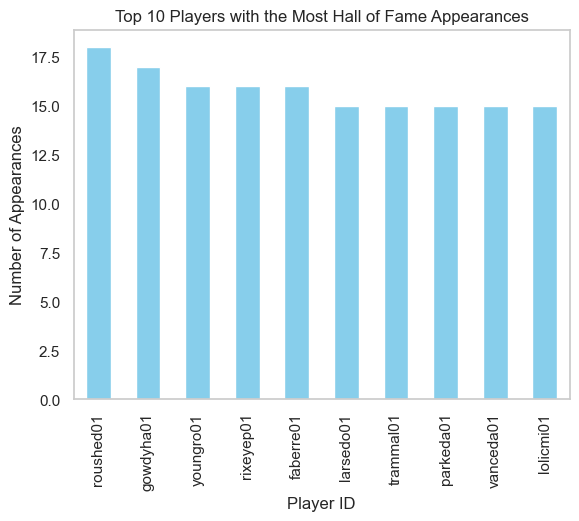

In [69]:
# Group by player_id and count the number of Hall of Fame appearances
hof_appearances = hall_of_fame_data.groupby('player_id').size().reset_index(name='hof_appearances')

# Sort the values to get the top 10 players with the most Hall of Fame appearances
top_10_hof_appearances = hof_appearances.sort_values(by='hof_appearances', ascending=False).head(10)

# Plot the data
top_10_hof_appearances.set_index('player_id')['hof_appearances'].plot(kind='bar', title='Top 10 Players with the Most Hall of Fame Appearances', ylabel='Number of Appearances', color='skyblue')
plt.xlabel('Player ID')
plt.ylabel('Number of Appearances')
plt.grid(False)
plt.show()

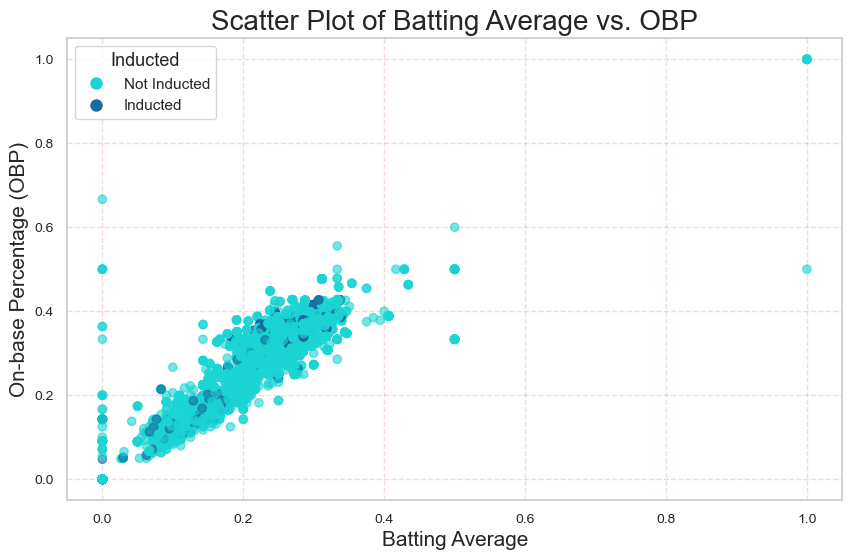

In [70]:
import matplotlib.pyplot as plt

# Assuming HoF_df contains the necessary columns and data

# Set size of the plot
plt.figure(figsize=(10, 6))

# Set style of the plot
plt.style.use('tableau-colorblind10')

# Set title for the plot (with fontsize change)
plt.title('Scatter Plot of Batting Average vs. OBP', fontsize=20)

# Set labels for x-axis and y-axis (with fontsize change)
plt.xlabel('Batting Average', fontsize=15)
plt.ylabel('On-base Percentage (OBP)', fontsize=15)

# Set font size of ticks on the x-axis and y-axis
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Turn grid on or off (0 = off, 1 = on)
plt.grid(c='r', alpha=0.2, linestyle='--')

# Create scatter plot, coloring by 'inducted' status
colors = HoF_df['inducted'].map({0: '#1BD4D4', 1: '#176BA0'})
plt.scatter(HoF_df['batting_average'], HoF_df['obp'], c=colors, alpha=0.6, label='Inducted')

# Add legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#1BD4D4', markersize=10, label='Not Inducted'),
           plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#176BA0', markersize=10, label='Inducted')]
plt.legend(title='Inducted', title_fontsize='13', fontsize='11', handles=handles)

# Display the plot
plt.show()


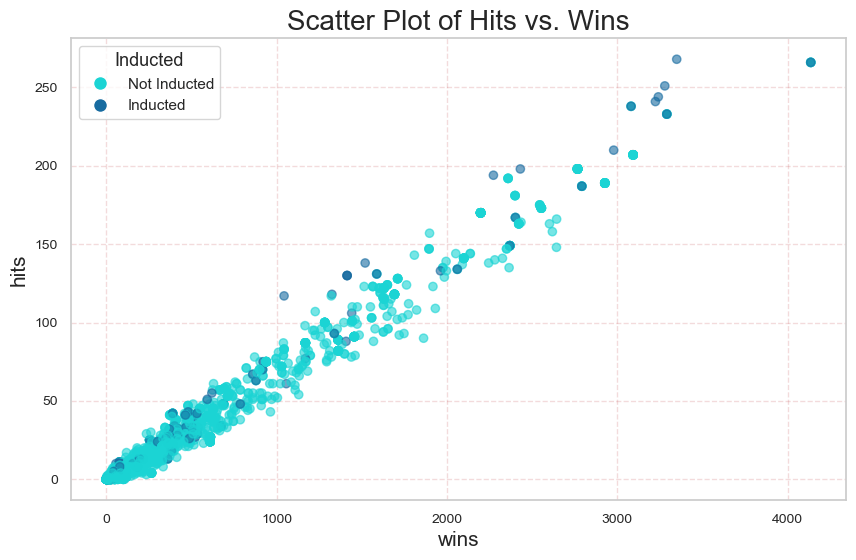

In [71]:
import matplotlib.pyplot as plt

# Assuming HoF_df contains the necessary columns and data

# Set size of the plot
plt.figure(figsize=(10, 6))

# Set style of the plot
plt.style.use('tableau-colorblind10')

# Set title for the plot (with fontsize change)
plt.title('Scatter Plot of Hits vs. Wins', fontsize=20)

# Set labels for x-axis and y-axis (with fontsize change)
plt.xlabel('wins', fontsize=15)
plt.ylabel('hits', fontsize=15)

# Set font size of ticks on the x-axis and y-axis
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Turn grid on or off (0 = off, 1 = on)
plt.grid(c='r', alpha=0.2, linestyle='--')

# Create scatter plot, coloring by 'inducted' status
colors = HoF_df['inducted'].map({0: '#1BD4D4', 1: '#176BA0'})
plt.scatter(HoF_df['h_y'], HoF_df['w'], c=colors, alpha=0.6, label='Inducted')

# Add legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#1BD4D4', markersize=10, label='Not Inducted'),
           plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#176BA0', markersize=10, label='Inducted')]
plt.legend(title='Inducted', title_fontsize='13', fontsize='11', handles=handles)

# Display the plot
plt.show()


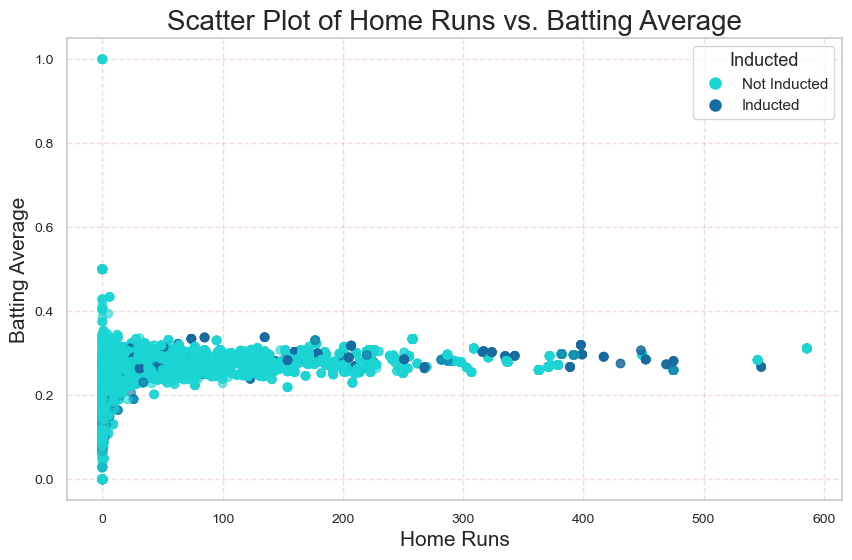

In [72]:
# Scatter plot of Home Runs vs. Batting Average
plt.figure(figsize=(10, 6))
plt.style.use('tableau-colorblind10')
plt.title('Scatter Plot of Home Runs vs. Batting Average', fontsize=20)
plt.xlabel('Home Runs', fontsize=15)
plt.ylabel('Batting Average', fontsize=15)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(c='r', alpha=0.2, linestyle='--')

colors = HoF_df['inducted'].map({0: '#1BD4D4', 1: '#176BA0'})
plt.scatter(HoF_df['hr'], HoF_df['batting_average'], c=colors, alpha=0.6)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#1BD4D4', markersize=10, label='Not Inducted'),
           plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#176BA0', markersize=10, label='Inducted')]
plt.legend(title='Inducted', title_fontsize='13', fontsize='11', handles=handles)

plt.show()


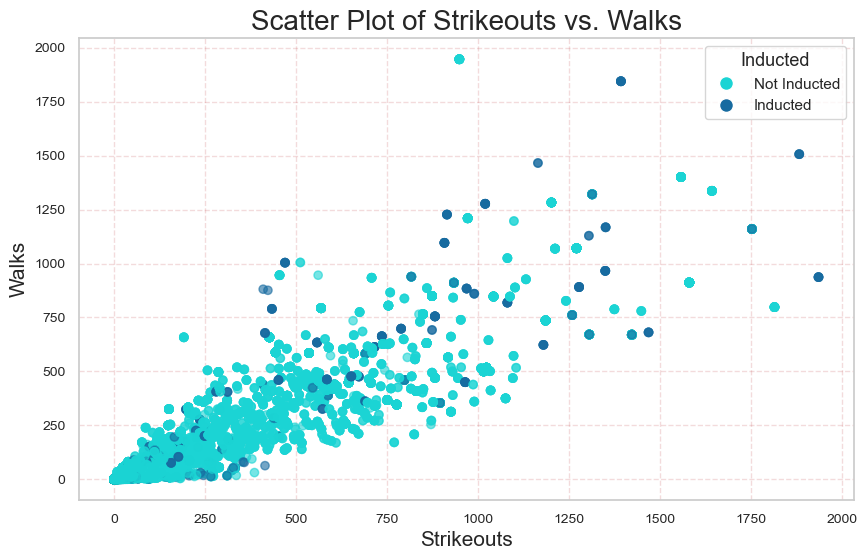

In [73]:
# Scatter plot of Strikeouts vs. Walks
plt.figure(figsize=(10, 6))
plt.style.use('tableau-colorblind10')
plt.title('Scatter Plot of Strikeouts vs. Walks', fontsize=20)
plt.xlabel('Strikeouts', fontsize=15)
plt.ylabel('Walks', fontsize=15)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(c='r', alpha=0.2, linestyle='--')

colors = HoF_df['inducted'].map({0: '#1BD4D4', 1: '#176BA0'})
plt.scatter(HoF_df['so_x'], HoF_df['bb_x'], c=colors, alpha=0.6)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#1BD4D4', markersize=10, label='Not Inducted'),
           plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#176BA0', markersize=10, label='Inducted')]
plt.legend(title='Inducted', title_fontsize='13', fontsize='11', handles=handles)

plt.show()


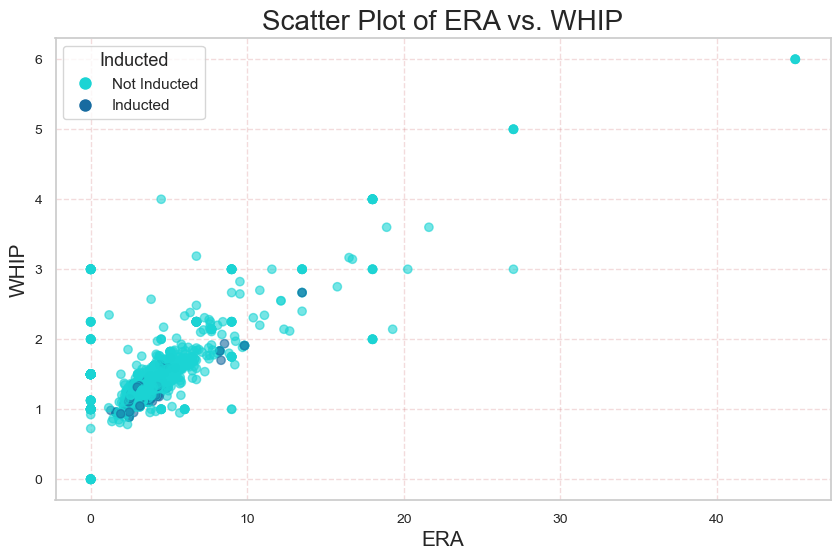

In [74]:
# Scatter plot of ERA vs. WHIP
plt.figure(figsize=(10, 6))
plt.style.use('tableau-colorblind10')
plt.title('Scatter Plot of ERA vs. WHIP', fontsize=20)
plt.xlabel('ERA', fontsize=15)
plt.ylabel('WHIP', fontsize=15)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(c='r', alpha=0.2, linestyle='--')

colors = HoF_df['inducted'].map({0: '#1BD4D4', 1: '#176BA0'})
plt.scatter(HoF_df['era'], HoF_df['whip'], c=colors, alpha=0.6)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#1BD4D4', markersize=10, label='Not Inducted'),
           plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#176BA0', markersize=10, label='Inducted')]
plt.legend(title='Inducted', title_fontsize='13', fontsize='11', handles=handles)

plt.show()


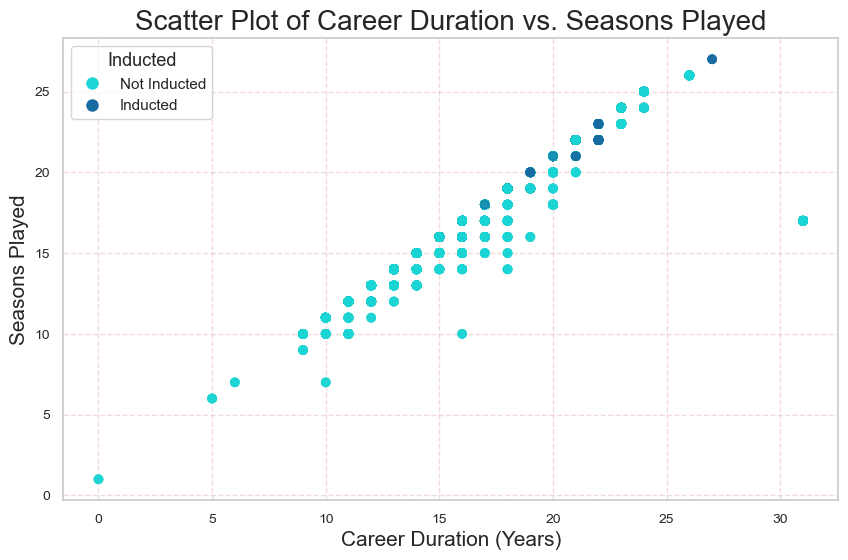

In [75]:
# Scatter plot of Career Duration vs. Seasons Played
plt.figure(figsize=(10, 6))
plt.style.use('tableau-colorblind10')
plt.title('Scatter Plot of Career Duration vs. Seasons Played', fontsize=20)
plt.xlabel('Career Duration (Years)', fontsize=15)
plt.ylabel('Seasons Played', fontsize=15)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(c='r', alpha=0.2, linestyle='--')

colors = HoF_df['inducted'].map({0: '#1BD4D4', 1: '#176BA0'})
plt.scatter(HoF_df['career_duration'], HoF_df['seasons_played'], c=colors, alpha=0.6)
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#1BD4D4', markersize=10, label='Not Inducted'),
           plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#176BA0', markersize=10, label='Inducted')]
plt.legend(title='Inducted', title_fontsize='13', fontsize='11', handles=handles)

plt.show()


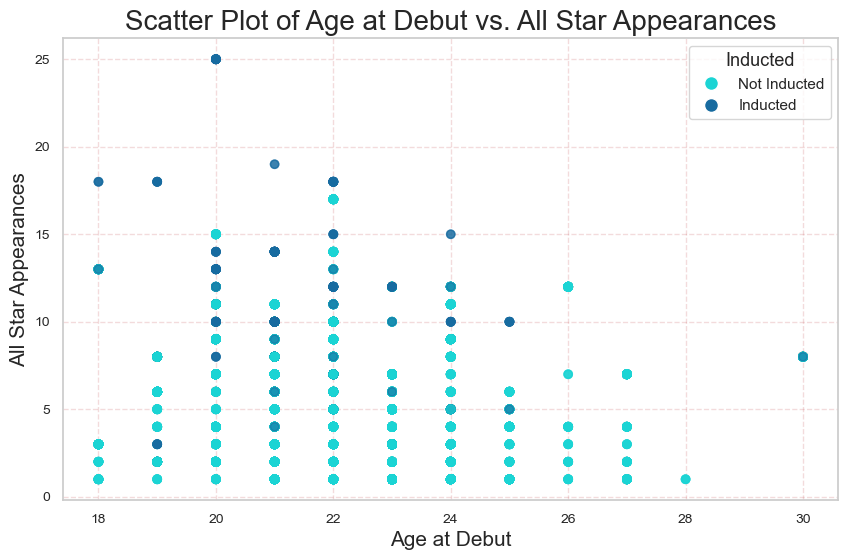

In [76]:
import matplotlib.pyplot as plt

# Set size of the plot
plt.figure(figsize=(10, 6))

# Set style of the plot
plt.style.use('tableau-colorblind10')

# Set title for the plot (with fontsize change)
plt.title('Scatter Plot of Age at Debut vs. All Star Appearances', fontsize=20)

# Set labels for x-axis and y-axis (with fontsize change)
plt.xlabel('Age at Debut', fontsize=15)
plt.ylabel('All Star Appearances', fontsize=15)

# Set font size of ticks on the x-axis and y-axis
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Turn grid on or off (0 = off, 1 = on)
plt.grid(c='r', alpha=0.2, linestyle='--')

# Create scatter plot, coloring by 'inducted' status
colors = HoF_df['inducted'].map({0: '#1BD4D4', 1: '#176BA0'})
plt.scatter(HoF_df['age_at_debut'], HoF_df['all_star_appearances'], c=colors, alpha=0.6)

# Add legend
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#1BD4D4', markersize=10, label='Not Inducted'),
           plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='#176BA0', markersize=10, label='Inducted')]
plt.legend(title='Inducted', title_fontsize='13', fontsize='11', handles=handles)

# Display the plot
plt.show()


In [77]:
## CALCULATION AND MERGING ATTEMPTS

In [78]:
#BEFORE ADDING IN MORE FEATURES LIKE TEAM AND LEAGUE ID

# # Calculate career statistics

# # Group by player and calculate total hits, at-bats, home runs, and RBIs for batting average
# career_batting = batting_data.groupby('player_id').agg({
#     'h': 'sum',
#     'ab': 'sum',
#     'bb': 'sum',
#     'hbp': 'sum',
#     'sh': 'sum',
#     'sf': 'sum',
#     'double': 'sum',
#     'triple': 'sum',
#     'hr': 'sum',
#     'so': 'sum'
# }).reset_index()

# # Calculate batting average, OBP, and SLG
# career_batting['batting_average'] = career_batting['h'] / career_batting['ab']
# career_batting['obp'] = (career_batting['h'] + career_batting['bb'] + career_batting['hbp']) / (career_batting['ab'] + career_batting['bb'] + career_batting['sh'] + career_batting['sf'] + career_batting['hbp'])
# career_batting['slg'] = (career_batting['h'] - career_batting['double'] - career_batting['triple'] - career_batting['hr'] + 2 * career_batting['double'] + 3 * career_batting['triple'] + 4 * career_batting['hr']) / career_batting['ab']

# # Print batting career statistics
# print("Batting Career Statistics:")
# print(career_batting)

# # Group by player and calculate total wins, earned runs, innings pitched, and strikeouts for pitching statistics
# career_pitching = pitching_data.groupby('player_id').agg({
#     'w': 'sum',
#     'er': 'sum',
#     'ipouts': 'sum',
#     'so': 'sum',
#     'bb': 'sum',
#     'h': 'sum'
# }).reset_index()

# # Calculate ERA and WHIP
# career_pitching['era'] = (career_pitching['er'] / (career_pitching['ipouts'] / 3)) * 9
# career_pitching['whip'] = 3 * (career_pitching['h'] + career_pitching['bb']) / career_pitching['ipouts']

# # Print pitching career statistics
# print("\nPitching Career Statistics:")
# print(career_pitching)

# # Group by player and calculate total games, putouts, assists, errors, etc. for fielding statistics
# career_fielding = fielding_data.groupby('player_id').agg({
#  'g': 'sum',
#  'gs': 'sum',
#  'inn_outs': 'sum',
#  'po': 'sum',
#  'a': 'sum',
#  'e': 'sum',
#  'dp': 'sum',
#  'pb': 'sum',
#  'wp': 'sum',
#  'sb': 'sum',
#  'cs': 'sum'
# }).reset_index()

# # Print fielding career statistics
# print("\nFielding Career Statistics:")
# print(career_fielding)

# # Group by player, team, and league and calculate total games played for appearances
# career_appearances = appearances_data.groupby(['player_id', 'team_id', 'league_id']).agg({
#     'g_all': 'sum'
# }).reset_index()

# # Print appearances career statistics
# print("\nAppearances Career Statistics:")
# print(career_appearances)

# # Count all-star appearances
# career_all_star = all_star_data.groupby('player_id').size().reset_index(name='all_star_appearances')

# # Print all-star appearances career statistics
# print("\nAll-Star Appearances Career Statistics:")
# print(career_all_star)

# # Count the number of seasons played
# player_data['seasons_played'] = player_data['player_id'].apply(lambda pid: len(set(appearances_data.loc[appearances_data['player_id'] == pid, 'year'])))
# player_data['last_season'] = player_data['final_game'].apply(lambda date: date.year)

# # Calculate age at debut and final game
# player_data['age_at_debut'] = player_data['debut_year'] - player_data['birth_year']
# player_data['age_at_final_game'] = player_data['final_game_year'] - player_data['birth_year']

# # Calculate career duration in years
# player_data['career_duration'] = player_data['final_game_year'] - player_data['debut_year']

# # # Merge all career statistics into a single DataFrame
# # career_stats = pd.merge(career_batting, career_pitching, on='player_id', how='outer')
# # career_stats = pd.merge(career_stats, career_fielding, on='player_id', how='outer')
# # career_stats = pd.merge(career_stats, career_appearances, on='player_id', how='outer')
# # career_stats = pd.merge(career_stats, career_all_star, on='player_id', how='outer')
# # career_stats = pd.merge(career_stats, player_data[['age_at_debut', 'age_at_final_game', 'career_duration', 'player_id', 'seasons_played', 'last_season', 'debut_year', 'debut_month', 'final_game_year', 'final_game_month']], on='player_id', how='outer')

# # Merge all career statistics into a single DataFrame
# career_stats = pd.merge(career_batting, career_pitching, on=['player_id' 'league_id'], how='outer')
# career_stats = pd.merge(career_stats, career_fielding, on=['player_id', 'team_id', 'league_id'], how='outer')
# career_stats = pd.merge(career_stats, career_appearances, on=['player_id', 'team_id', 'league_id'], how='outer')
# career_stats = pd.merge(career_stats, career_all_star, on='player_id', how='outer')
# career_stats = pd.merge(career_stats, player_data[['age_at_debut', 'age_at_final_game', 'career_duration', 'player_id', 'seasons_played', 'last_season', 'debut_year', 'debut_month', 'final_game_year', 'final_game_month']], on='player_id', how='outer')
# # Print all career statistics
# print("\nAll Career Statistics:")
# print(career_stats)

# # Merge career_stats with hall_of_fame_data
# HoF_df = career_stats.merge(hall_of_fame_data, on='player_id', how='left')

# # Print the final DataFrame with Hall of Fame data
# print("\nFinal DataFrame with Hall of Fame Data:")
# print(HoF_df)

In [79]:
# # Calculate career statistics

# # Group by player and calculate total hits and at-bats for batting average
# career_batting = batting_data.groupby('player_id').agg({
#     'h': 'sum',
#     'ab': 'sum',
#     'hr': 'sum',
#     'rbi': 'sum'
# }).reset_index()

# # Calculate batting average
# career_batting['batting_average'] = career_batting['h'] / career_batting['ab']

# # Print batting career statistics
# print("Batting Career Statistics:")
# print(career_batting)

# # Group by player and calculate total wins, earned runs, innings pitched, and strikeouts for pitching statistics
# career_pitching = pitching_data.groupby('player_id').agg({
#     'w': 'sum',
#     'er': 'sum',
#     'ipouts': 'sum',
#     'so': 'sum'
# }).reset_index()

# # Calculate ERA (Note: IPOuts is in outs, so divide by 3 to get innings)
# career_pitching['era'] = (career_pitching['er'] / (career_pitching['ipouts'] / 3)) * 9

# # Print pitching career statistics
# print("\nPitching Career Statistics:")
# print(career_pitching)

# # Group by player and calculate total games, putouts, assists, errors, etc. for fielding statistics
# career_fielding = fielding_data.groupby('player_id').agg({
#  'g': 'sum',
#  'gs': 'sum',
#  'inn_outs': 'sum',
#  'po': 'sum',
#  'a': 'sum',
#  'e': 'sum',
#  'dp': 'sum',
#  'pb': 'sum',
#  'wp': 'sum',
#  'sb': 'sum',
#  'cs': 'sum'
# }).reset_index()

# # Print fielding career statistics
# print("\nFielding Career Statistics:")
# print(career_fielding)

# # Merge all career statistics into a single DataFrame
# career_stats = pd.merge(career_batting, career_pitching, on='player_id', how='outer')
# career_stats = pd.merge(career_stats, career_fielding, on='player_id', how='outer')

# # Print all career statistics
# print("\nAll Career Statistics:")
# print(career_stats)

In [80]:

# # Create a set of player IDs that exist in both datasets
# common_player_ids = set(player_data['player_id']) & set(appearances_data['player_id'])

# # Filter player_data to include only the common player IDs
# player_data = player_data[player_data['player_id'].isin(common_player_ids)].reset_index(drop=True)

# # Define a safe version of each function that returns NaN if an exception occurs
# def safe_apply(func):
#     def wrapper(player_id):
#         try:
#             return func(player_id)
#         except Exception:
#             return np.nan
#     return wrapper

# # Apply the functions to create new features
# player_data['seasons_played'] = player_data['player_id'].apply(safe_apply(count_seasons))
# player_data['total_games'] = player_data['player_id'].apply(safe_apply(total_games))
# player_data['games_started'] = player_data['player_id'].apply(safe_apply(games_started))
# player_data['games_as_batter'] = player_data['player_id'].apply(safe_apply(games_as_batter))
# player_data['games_in_defense'] = player_data['player_id'].apply(safe_apply(games_in_defense))
# player_data['primary_position'] = player_data['player_id'].apply(safe_apply(primary_position))

# # For appearances by position, we'll create separate columns
# position_cols = ['g_p', 'g_c', 'g_1b', 'g_2b', 'g_3b', 'g_ss', 'g_lf', 'g_cf', 'g_rf', 'g_of', 'g_dh', 'g_ph', 'g_pr']

# for col in position_cols:
#     player_data[f'appearances_{col}'] = player_data['player_id'].apply(safe_apply(lambda x: count_appearances(x)[col]))

# # Print the first few rows to verify
# print(player_data.head())

# # Print column names to verify all new features
# print(player_data.columns)

# # Print the number of players processed
# print(f"Number of players processed: {len(player_data)}")


In [81]:
# import pandas as pd

# # Assuming appearances_data is already loaded
# # Create player_data DataFrame if it doesn't exist
# if 'player_data' not in locals():
#     player_data = pd.DataFrame({'player_id': appearances_data['player_id'].unique()})

# # Add features to player_data
# player_data['seasons_played'] = player_data['player_id'].apply(count_seasons)
# player_data['total_games'] = player_data['player_id'].apply(total_games)
# player_data['games_started'] = player_data['player_id'].apply(games_started)
# player_data['games_as_batter'] = player_data['player_id'].apply(games_as_batter)
# player_data['games_in_defense'] = player_data['player_id'].apply(games_in_defense)
# player_data['primary_position'] = player_data['player_id'].apply(primary_position)

# # For appearances by position, we'll create separate columns
# position_cols = ['g_p', 'g_c', 'g_1b', 'g_2b', 'g_3b', 'g_ss', 'g_lf', 'g_cf', 'g_rf', 'g_of', 'g_dh', 'g_ph', 'g_pr']

# for col in position_cols:
#     player_data[f'appearances_{col}'] = player_data['player_id'].apply(lambda x: count_appearances(x)[col])

# # Print the first few rows to verify
# print(player_data.head())

# # Print column names to verify all new features
# print(player_data.columns)


In [82]:
# def verify_player(player_id):
#     return player_id in appearances_data['player_id'].values

# def count_appearances(player_id):
#     if not verify_player(player_id):
#         return None  # Return None for players not in the database
#     cols = ['g_p', 'g_c', 'g_1b', 'g_2b', 'g_3b', 'g_ss', 'g_lf', 'g_cf', 'g_rf', 'g_of', 'g_dh', 'g_ph', 'g_pr']
#     return appearances_data.loc[appearances_data['player_id'] == player_id, cols].sum()

# # When applying these functions to player_data, you can use:
# player_data['appearances'] = player_data['player_id'].apply(lambda x: count_appearances(x))

In [83]:


# def verify_player(player_id):
#     if player_id in appearances_data['player_id'].values:
#         return True
#     raise Exception(f"IDError: player_id {player_id} not found in database")

# def count_appearances(player_id):
#     verify_player(player_id)
#     cols = ['g_p', 'g_c', 'g_1b', 'g_2b', 'g_3b', 'g_ss', 'g_lf', 'g_cf', 'g_rf', 'g_of', 'g_dh', 'g_ph', 'g_pr']
#     return appearances_data.loc[appearances_data['player_id'] == player_id, cols].sum()

# def count_seasons(player_id):
#     verify_player(player_id)
#     return appearances_data[appearances_data['player_id'] == player_id]['year'].nunique()

# def total_games(player_id):
#     verify_player(player_id)
#     return appearances_data[appearances_data['player_id'] == player_id]['g_all'].sum()

# def games_started(player_id):
#     verify_player(player_id)
#     return appearances_data[appearances_data['player_id'] == player_id]['gs'].sum()

# def games_as_batter(player_id):
#     verify_player(player_id)
#     return appearances_data[appearances_data['player_id'] == player_id]['g_batting'].sum()

# def games_in_defense(player_id):
#     verify_player(player_id)
#     return appearances_data[appearances_data['player_id'] == player_id]['g_defense'].sum()

# def primary_position(player_id):
#     appearances = count_appearances(player_id)
#     return appearances.idxmax()

# # Function to evaluate a player
# def evaluate_player(player_id):
#     try:
#         verify_player(player_id)
        
#         print(f"Player ID: {player_id}")
#         print(f"Seasons played: {count_seasons(player_id)}")
#         print(f"Total games: {total_games(player_id)}")
#         print(f"Games started: {games_started(player_id)}")
#         print(f"Games as batter: {games_as_batter(player_id)}")
#         print(f"Games in defense: {games_in_defense(player_id)}")
#         print(f"Primary position: {primary_position(player_id)}")
#         print("Appearances by position:")
#         print(count_appearances(player_id))
#         print("\n")
#     except Exception as e:
#         print(f"Error processing player {player_id}: {str(e)}")
#         print("\n")

# # # Example usage
# # player_id = 'alexado01'
# # evaluate_player(player_id)
# # Apply the count_shutouts function to each player_id in player_data
# #player_data[ = player_data['player_id'].apply(evaluate_player)

# # Add features to player_data
# player_data['seasons_played'] = player_data['player_id'].apply(count_seasons)
# player_data['total_games'] = player_data['player_id'].apply(total_games)
# player_data['games_started'] = player_data['player_id'].apply(games_started)
# player_data['games_as_batter'] = player_data['player_id'].apply(games_as_batter)
# player_data['games_in_defense'] = player_data['player_id'].apply(games_in_defense)
# player_data['primary_position'] = player_data['player_id'].apply(primary_position)

In [84]:
# def rename_conflicting_columns(df, suffix):
#     df = df.rename(columns={
#         'team_id': f'team_id_{suffix}',
#         'league_id': f'league_id_{suffix}',
#         'g': f'g_{suffix}',
#         'h': f'h_{suffix}',
#         'hr': f'hr_{suffix}',
#         'bb': f'bb_{suffix}',
#         'so': f'so_{suffix}',
#         'ibb': f'ibb_{suffix}',
#         'hbp': f'hbp_{suffix}',
#         'sh': f'sh_{suffix}',
#         'sf': f'sf_{suffix}',
#         'gidp': f'gidp_{suffix}',
#         'gs': f'gs_{suffix}'
#     })
#     return df

# career_stats = rename_conflicting_columns(career_stats, 'career_stats')
# batting_data = rename_conflicting_columns(batting_data, 'batting')
# hall_of_fame_data = rename_conflicting_columns(hall_of_fame_data, 'hof')
# fielding_data = rename_conflicting_columns(fielding_data, 'fielding')
# pitching_data = rename_conflicting_columns(pitching_data, 'pitching')
# all_star_data = rename_conflicting_columns(all_star_data, 'all_star')
# appearances_data = rename_conflicting_columns(appearances_data, 'appearances')

In [85]:
# # Merge player_data first
# data = career_stats.merge(player_data, on='player_id', how='left')
# print('After merging with player data:', data.shape, data.isnull().mean().sort_values())

# # Merge the result with hall_of_fame_data
# data = data.merge(hall_of_fame_data, on='player_id', how='left')
# print('After merging with hall_of_fame data:', data.shape, data['inducted'].unique(), data.isnull().mean().sort_values())

# # Merge batting_data 
# data = data.merge(batting_data, on=['player_id', 'year'], how='left')
# print('After merging with batting data:', data.shape, data.isnull().mean().sort_values())

# # Merge the result with pitching_data
# data = data.merge(pitching_data, on=['player_id', 'year'], how='outer').drop_duplicates()
# print('After merging with pitching data:', data.shape, data.isnull().mean().sort_values())

# # Merge the result with fielding_data
# data = data.merge(fielding_data, on=['player_id', 'year'], how='left')
# print('After merging with fielding data:', data.shape, data.isnull().mean().sort_values(), hall_of_fame_data['inducted'].unique(), data.isnull().mean().sort_values())

# # Merge the result with appearances_data
# data = data.merge(appearances_data, on=['player_id', 'year'], how='left')
# print('After merging with appearances data:', data.shape, data.isnull().mean().sort_values())

# # Merge the result with all_star_data
# HoF_df = data.merge(all_star_data, on=['player_id', 'year'], how='left')
# print('After merging with all_star data:', HoF_df.shape)

# Data Cleansing and Transformation <a name="part5"></a>


## Train Test Split <a name="part5.1"></a>



In [86]:
# let's separate into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(
    HoF_df.drop('inducted', axis=1), HoF_df['inducted'], test_size=0.3, random_state=0) # to imput null values to put into the feature engine for testing 

In [87]:
X_train.isnull().sum().sort_values()

team_id                    0
ballots                    0
year                       0
final_game_month           0
final_game_year            0
debut_month                0
debut_year                 0
last_season                0
seasons_played             0
career_duration            0
age_at_final_game          0
age_at_debut               0
g_all                      0
needed                     0
votes                      0
league_id                  0
h_x                        0
ab                         0
bb_x                       0
hbp                        0
sh                         0
sf                         0
double                     0
triple                     0
hr                         0
so_x                       0
wp                        18
cs                        18
sb                        18
pb                        18
g                         18
e                         18
dp                        18
gs                        18
inn_outs      

In [88]:
X_train.shape

(8838, 50)

## Categorical Data <a name="part5.2"></a>


In [89]:
cat_cols = [c for c in X_train.columns if X_train[c].dtypes =='O']
X_train[cat_cols].isnull().mean().sort_values()

team_id      0.000000
league_id    0.000000
pos          0.002037
dtype: float64

In [90]:
X_train[cat_cols].columns

Index(['team_id', 'league_id', 'pos'], dtype='object')

## Numerical Data <a name="part5.3"></a>


In [91]:
# find numerical variables
num_cols = [c for c in X_train.columns if X_train[c].dtypes !='O']
X_train[num_cols].isnull().mean().sort_values()

h_x                     0.000000
ballots                 0.000000
year                    0.000000
final_game_month        0.000000
final_game_year         0.000000
debut_month             0.000000
debut_year              0.000000
last_season             0.000000
seasons_played          0.000000
career_duration         0.000000
age_at_final_game       0.000000
age_at_debut            0.000000
g_all                   0.000000
needed                  0.000000
votes                   0.000000
ab                      0.000000
bb_x                    0.000000
hbp                     0.000000
sh                      0.000000
sf                      0.000000
double                  0.000000
triple                  0.000000
hr                      0.000000
so_x                    0.000000
sb                      0.002037
cs                      0.002037
wp                      0.002037
pb                      0.002037
inn_outs                0.002037
e                       0.002037
a         

In [92]:
X_train[num_cols].columns

Index(['h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf', 'double', 'triple', 'hr',
       'so_x', 'batting_average', 'obp', 'slg', 'w', 'er', 'ipouts', 'so_y',
       'bb_y', 'h_y', 'era', 'whip', 'g', 'gs', 'inn_outs', 'po', 'a', 'e',
       'dp', 'pb', 'wp', 'sb', 'cs', 'g_all', 'all_star_appearances',
       'age_at_debut', 'age_at_final_game', 'career_duration',
       'seasons_played', 'last_season', 'debut_year', 'debut_month',
       'final_game_year', 'final_game_month', 'year', 'ballots', 'needed',
       'votes'],
      dtype='object')

In [93]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8838 entries, 95339 to 17704
Data columns (total 50 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   team_id               8838 non-null   object 
 1   league_id             8838 non-null   object 
 2   h_x                   8838 non-null   float64
 3   ab                    8838 non-null   float64
 4   bb_x                  8838 non-null   float64
 5   hbp                   8838 non-null   float64
 6   sh                    8838 non-null   float64
 7   sf                    8838 non-null   float64
 8   double                8838 non-null   float64
 9   triple                8838 non-null   float64
 10  hr                    8838 non-null   float64
 11  so_x                  8838 non-null   float64
 12  batting_average       8302 non-null   float64
 13  obp                   8306 non-null   float64
 14  slg                   8302 non-null   float64
 15  w                    

array([[<Axes: title={'center': 'h_x'}>, <Axes: title={'center': 'ab'}>,
        <Axes: title={'center': 'bb_x'}>,
        <Axes: title={'center': 'hbp'}>, <Axes: title={'center': 'sh'}>,
        <Axes: title={'center': 'sf'}>,
        <Axes: title={'center': 'double'}>],
       [<Axes: title={'center': 'triple'}>,
        <Axes: title={'center': 'hr'}>, <Axes: title={'center': 'so_x'}>,
        <Axes: title={'center': 'batting_average'}>,
        <Axes: title={'center': 'obp'}>, <Axes: title={'center': 'slg'}>,
        <Axes: title={'center': 'w'}>],
       [<Axes: title={'center': 'er'}>,
        <Axes: title={'center': 'ipouts'}>,
        <Axes: title={'center': 'so_y'}>,
        <Axes: title={'center': 'bb_y'}>,
        <Axes: title={'center': 'h_y'}>, <Axes: title={'center': 'era'}>,
        <Axes: title={'center': 'whip'}>],
       [<Axes: title={'center': 'g'}>, <Axes: title={'center': 'gs'}>,
        <Axes: title={'center': 'inn_outs'}>,
        <Axes: title={'center': 'po'}>, 

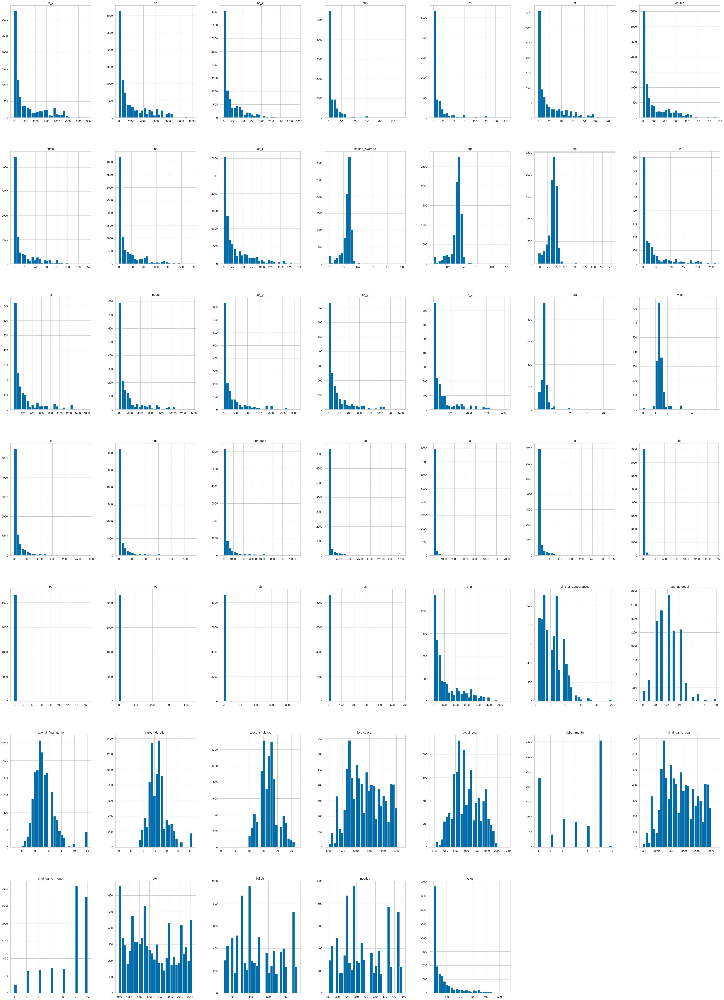

In [94]:
X_train[num_cols].hist(bins=30, figsize=(50,70))

#### Handling Missing Value

In [95]:
X_train.isnull().mean()

team_id                 0.000000
league_id               0.000000
h_x                     0.000000
ab                      0.000000
bb_x                    0.000000
hbp                     0.000000
sh                      0.000000
sf                      0.000000
double                  0.000000
triple                  0.000000
hr                      0.000000
so_x                    0.000000
batting_average         0.060647
obp                     0.060195
slg                     0.060647
w                       0.803123
er                      0.803123
ipouts                  0.803123
so_y                    0.803123
bb_y                    0.803123
h_y                     0.803123
era                     0.803462
whip                    0.803462
pos                     0.002037
g                       0.002037
gs                      0.002037
inn_outs                0.002037
po                      0.002037
a                       0.002037
e                       0.002037
dp        

## Missing Value Imputation<a name="part5.4"></a>

In [96]:
# Check columns in num_cols that have null values
null_columns = [col for col in num_cols if col in X_train.columns and X_train[col].isnull().any()]
null_columns


['batting_average',
 'obp',
 'slg',
 'w',
 'er',
 'ipouts',
 'so_y',
 'bb_y',
 'h_y',
 'era',
 'whip',
 'g',
 'gs',
 'inn_outs',
 'po',
 'a',
 'e',
 'dp',
 'pb',
 'wp',
 'sb',
 'cs',
 'all_star_appearances']

In [97]:
# Check columns in cat_cols that have null values
null_columns_cat = [col for col in cat_cols if col in X_train.columns and X_train[col].isnull().any()]
null_columns_cat


['pos']

In [98]:
# Check for missing values in the entire DataFrame
null_counts = X_train.isnull().sum()
print("Missing values in each column:")
print(null_counts)

# Filter to see columns with missing values
missing_columns = null_counts[null_counts > 0]
print("Columns with missing values:")
print(missing_columns)

# Store columns with missing values
columns_with_missing = missing_columns.index.tolist()
print("List of columns with missing values:")
print(columns_with_missing)

Missing values in each column:
team_id                    0
league_id                  0
h_x                        0
ab                         0
bb_x                       0
hbp                        0
sh                         0
sf                         0
double                     0
triple                     0
hr                         0
so_x                       0
batting_average          536
obp                      532
slg                      536
w                       7098
er                      7098
ipouts                  7098
so_y                    7098
bb_y                    7098
h_y                     7098
era                     7101
whip                    7101
pos                       18
g                         18
gs                        18
inn_outs                  18
po                        18
a                         18
e                         18
dp                        18
pb                        18
wp                        18
sb          

#### Median & Frequent Imputer

In [99]:

# # first we need to make a list with the numerical vars
# features_num_median = ['birth_year',
#  'birth_month',
#  'birth_day',
#  'death_year',
#  'weight',
#  'height',
#  'debut_year',
#  'debut_month',
#  'final_game_year',
#  'final_game_month',
#  'ballots',
#  'needed',
#  'votes',
#  'g_batting_x',
#  'ab',
#  'r_x',
#  'h_batting',
#  'double',
#  'triple',
#  'hr_batting',
#  'rbi',
#  'sb',
#  'cs',
#  'bb_batting',
#  'so_batting',
#  'ibb_batting',
#  'hbp_batting',
#  'sh_batting',
#  'sf_batting',
#  'g_idp_x',
#  'w',
#  'l',
#  'g_pitching',
#  'gs_x',
#  'cg',
#  'sho',
#  'sv',
#  'ipouts',
#  'h_pitching',
#  'er',
#  'hr_pitching',
#  'bb_pitching',
#  'so_pitching',
#  'baopp',
#  'era',
#  'ibb_pitching',
#  'wp',
#  'hbp_pitching',
#  'bk',
#  'bfp',
#  'gf',
#  'r_y',
#  'sh_pitching',
#  'sf_pitching',
#  'g_idp_y',
#  'g_fielding',
#  'gs_y',
#  'inn_outs',
#  'po',
#  'a',
#  'e',
#  'dp',
#  'g_all',
#  'gs',
#  'g_batting_y',
#  'g_defense',
#  'g_p',
#  'g_c',
#  'g_1b',
#  'g_2b',
#  'g_3b',
#  'g_ss',
#  'g_lf',
#  'g_cf',
#  'g_rf',
#  'g_of',
#  'g_dh',
#  'g_ph',
#  'g_pr']

# features_cat_frequent = [ 'birth_country',
#  'birth_state',
#  'bats',
#  'throws',
#  'team_id_pitching',
#  'league_id_pitching',
#  'team_id_fielding',
#  'league_id_fielding',
#  'pos',
#  'team_id_appearances',
#  'league_id_appearances',
#  'game_id', 'team_id_all_star',
#        'league_id_all_star','league_id_batting' ]

In [100]:
# Instantiate each imputer within a pipeline
#pipe = Pipeline(steps=[
#    ('imp_num_median', MeanMedianImputer(imputation_method='median', variables=features_num_median)),
#    ('imp_cat_frequent', CategoricalImputer(variables=features_cat_frequent, imputation_method='frequent'))
#])

#### Mean & Frequent Imputer

In [101]:
# # Instantiate each imputer within a pipeline - mean and missing : across the different permuatations of missing value imputation this combination did not perform well in terms of accuracy score for the models
# pipe = Pipeline(steps=[
#     ('imp_num_mean', MeanMedianImputer(imputation_method='mean', variables=features_num_mean)),
#     ('imp_cat_missing', CategoricalImputer(variables=features_cat_missing, imputation_method='missing'))
# ])

In [102]:
# X_train = X_train.dropna(subset=['birth_year',
#  'birth_month',
#  'birth_day',
#  'death_year',
#  'weight',
#  'height',
#  'debut_year',
#  'debut_month',
#  'final_game_year',
#  'final_game_month',
#  'ballots',
#  'needed',
#  'votes']) 

In [103]:
# X_test = X_test.dropna(subset=['birth_year',
#  'birth_month',
#  'birth_day',
#  'death_year',
#  'weight',
#  'height',
#  'debut_year',
#  'debut_month',
#  'final_game_year',
#  'final_game_month',
#  'ballots',
#  'needed',
#  'votes']) 

#### Mean, Missing and Frequent Imputer

In [104]:
# # first we need to make a list with the numerical vars
# features_num_median = ['birth_year',
#  'birth_month',
#  'birth_day',
#  'death_year',
#  'weight',
#  'height',
#  'debut_year',
#  'debut_month',
#  'final_game_year',
#  'final_game_month',
#  'ballots',
#  'needed',
#  'votes']

# features_num_mean = [
#  'g_batting_x',
#  #'ab',
#  'r_x',
#  'h_batting',
#  'double',
#  'triple',
#  'hr_batting',
#  #'rbi',
#  #'sb',
#  'cs',
#  'bb_batting',
#  'so_batting',
#  'ibb_batting',
#  'hbp_batting',
#  #'sh_batting',
#  'sf_batting',
#  'g_idp_x',
#  #'w',
#  'l',
#  'g_pitching',
#  #'gs_x',
#  'cg',
#  'sho',
#  'sv',
#  #'ipouts',
#  'h_pitching',
#  #'er',
#  'hr_pitching',
#  'bb_pitching',
#  'so_pitching',
#  'baopp',
#  #'era',
#  'ibb_pitching',
#  'wp',
#  'hbp_pitching',
#  'bk',
#  'bfp',
#  'gf',
#  'r_y',
#  'sh_pitching',
#  'sf_pitching',
#  'g_idp_y',
#  'g_fielding',
#  #'gs_y',
#  #'inn_outs',
#  # 'po',
#  # 'a',
#  # 'e',
#  # 'dp',
#  'g_all',
#  #'gs',
#  'g_batting_y',
#  'g_defense',
#  'g_p',
#  'g_c',
#  'g_1b',
#  'g_2b',
#  'g_3b',
#  'g_ss',
#  'g_lf',
#  'g_cf',
#  'g_rf',
#  'g_of',
#  'g_dh',
#  'g_ph']

# features_cat_missing = [
#  'team_id_pitching',
#  'league_id_pitching',
#  'team_id_fielding',
#  'league_id_fielding',
#  'team_id_appearances',
#  'league_id_appearances',
#  'game_id', 'team_id_all_star',
#        'league_id_all_star','league_id_batting' ]


# features_cat_frequent = [ 'birth_country',
#  'birth_state',
#  'bats',
#  'throws',
#  'pos']

In [105]:
# # Instantiate each imputer within a pipeline
# pipe = Pipeline(steps=[
#     ('imp_num_mean', MeanMedianImputer(imputation_method='mean', variables=features_num_mean)),
#      ('imp_num_median', MeanMedianImputer(imputation_method='median', variables=features_num_median)),
#     ('imp_cat_missing', CategoricalImputer(variables=features_cat_missing, imputation_method='missing')),
#     ('imp_cat_frequent', CategoricalImputer(variables=features_cat_frequent, imputation_method='frequent'))
# ])

#### Median Imputer

In [106]:
# first we need to make a list with the numerical vars


features_num_median = [
 'h_x',
 'ab',
 'bb_x',
 'hbp',
 'sh',
 'sf',
 'double',
 'triple',
 'hr',
 'so_x',
 'batting_average',
 'obp',
 'slg',
 'w',
 'er',
 'ipouts',
 'so_y',
 'bb_y',
 'h_y',
 'era',
 'whip',
 'all_star_appearances',
'g', 'gs', 'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs']

features_cat_frequent = ['pos']

In [107]:
# Instantiate each imputer within a pipeline
pipe = Pipeline(steps=[
    ('imp_num_median', MeanMedianImputer(imputation_method='median', variables=features_num_median))
     #('imp_num_median', MeanMedianImputer(imputation_method='median', variables=features_num_median)),
    #('imp_cat_missing', CategoricalImputer(variables=features_cat_missing, imputation_method='missing')),
    ,('imp_cat_frequent', CategoricalImputer(variables=features_cat_frequent, imputation_method='frequent'))
])

In [108]:
# now we fit the preprocessor
pipe.fit(X_train)

Pipeline(steps=[('imp_num_median',
                 MeanMedianImputer(variables=['h_x', 'ab', 'bb_x', 'hbp', 'sh',
                                              'sf', 'double', 'triple', 'hr',
                                              'so_x', 'batting_average', 'obp',
                                              'slg', 'w', 'er', 'ipouts',
                                              'so_y', 'bb_y', 'h_y', 'era',
                                              'whip', 'all_star_appearances',
                                              'g', 'gs', 'inn_outs', 'po', 'a',
                                              'e', 'dp', 'pb', ...])),
                ('imp_cat_frequent',
                 CategoricalImputer(imputation_method='frequent',
                                    variables=['pos']))])

In [109]:
# and now we impute the data
X_train = pipe.transform(X_train)
X_test = pipe.transform(X_test)

In [110]:
X_train.shape

(8838, 50)

In [111]:
# Check for missing values in the entire DataFrame
null_counts = X_train.isnull().sum()
print("Missing values in each column:")
print(null_counts)

# Filter to see columns with missing values
missing_columns = null_counts[null_counts > 0]
print("Columns with missing values:")
print(missing_columns)

# Store columns with missing values
columns_with_missing = missing_columns.index.tolist()
print("List of columns with missing values:")
print(columns_with_missing)


Missing values in each column:
team_id                 0
league_id               0
h_x                     0
ab                      0
bb_x                    0
hbp                     0
sh                      0
sf                      0
double                  0
triple                  0
hr                      0
so_x                    0
batting_average         0
obp                     0
slg                     0
w                       0
er                      0
ipouts                  0
so_y                    0
bb_y                    0
h_y                     0
era                     0
whip                    0
pos                     0
g                       0
gs                      0
inn_outs                0
po                      0
a                       0
e                       0
dp                      0
pb                      0
wp                      0
sb                      0
cs                      0
g_all                   0
all_star_appearances    0
age_at_

In [112]:
X_train.isnull().mean().sort_values() #subset

team_id                 0.0
po                      0.0
a                       0.0
e                       0.0
dp                      0.0
pb                      0.0
wp                      0.0
sb                      0.0
cs                      0.0
g_all                   0.0
all_star_appearances    0.0
age_at_debut            0.0
age_at_final_game       0.0
career_duration         0.0
seasons_played          0.0
last_season             0.0
debut_year              0.0
debut_month             0.0
final_game_year         0.0
final_game_month        0.0
year                    0.0
ballots                 0.0
inn_outs                0.0
gs                      0.0
g                       0.0
pos                     0.0
league_id               0.0
h_x                     0.0
ab                      0.0
bb_x                    0.0
hbp                     0.0
sh                      0.0
sf                      0.0
double                  0.0
triple                  0.0
hr                  

## Categorical Data Encoding<a name="part5.5"></a>

#### Ordinal Encoding

In [113]:
X_train[cat_cols].columns

Index(['team_id', 'league_id', 'pos'], dtype='object')

In [114]:
ordinal_enc = OrdinalEncoder(
    encoding_method='ordered',
    variables=['team_id', 'league_id', 'pos'
])

In [115]:
ordinal_enc.fit(X_train, y_train)

OrdinalEncoder(variables=['team_id', 'league_id', 'pos'])

In [116]:
ordinal_enc.encoder_dict_

{'team_id': {'WS2': 0,
  'SE1': 1,
  'PHA': 2,
  'MIL': 3,
  'COL': 4,
  'BSN': 5,
  'LAA': 6,
  'SLA': 7,
  'ARI': 8,
  'WAS': 9,
  'DET': 10,
  'TEX': 11,
  'SLN': 12,
  'PHI': 13,
  'PIT': 14,
  'CLE': 15,
  'NYA': 16,
  'CHA': 17,
  'TOR': 18,
  'KCA': 19,
  'MON': 20,
  'LAN': 21,
  'BRO': 22,
  'CAL': 23,
  'OAK': 24,
  'CHN': 25,
  'FLO': 26,
  'SFN': 27,
  'ATL': 28,
  'CIN': 29,
  'HOU': 30,
  'NYN': 31,
  'BAL': 32,
  'KC1': 33,
  'WS1': 34,
  'ML1': 35,
  'ML4': 36,
  'MIN': 37,
  'BOS': 38,
  'ANA': 39,
  'SDN': 40,
  'SEA': 41,
  'TBA': 42,
  'NY1': 43},
 'league_id': {'NL': 0, 'AL': 1},
 'pos': {'3B': 0,
  'RF': 1,
  'C': 2,
  'LF': 3,
  'OF': 4,
  '1B': 5,
  'CF': 6,
  'SS': 7,
  'P': 8,
  '2B': 9,
  'DH': 10}}

In [117]:
X_train = ordinal_enc.transform(X_train)
X_test = ordinal_enc.transform(X_test)

pd.DataFrame(X_train, columns=cat_cols).info()

<class 'pandas.core.frame.DataFrame'>
Index: 8838 entries, 95339 to 17704
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   team_id    8838 non-null   int64
 1   league_id  8838 non-null   int64
 2   pos        8838 non-null   int64
dtypes: int64(3)
memory usage: 276.2 KB


In [118]:
X_test.isnull().mean()

team_id                 0.0
league_id               0.0
h_x                     0.0
ab                      0.0
bb_x                    0.0
hbp                     0.0
sh                      0.0
sf                      0.0
double                  0.0
triple                  0.0
hr                      0.0
so_x                    0.0
batting_average         0.0
obp                     0.0
slg                     0.0
w                       0.0
er                      0.0
ipouts                  0.0
so_y                    0.0
bb_y                    0.0
h_y                     0.0
era                     0.0
whip                    0.0
pos                     0.0
g                       0.0
gs                      0.0
inn_outs                0.0
po                      0.0
a                       0.0
e                       0.0
dp                      0.0
pb                      0.0
wp                      0.0
sb                      0.0
cs                      0.0
g_all               

In [119]:
# Check for missing values in the entire DataFrame
null_counts = X_test.isnull().sum()
print("Missing values in each column:")
print(null_counts)

# Filter to see columns with missing values
missing_columns = null_counts[null_counts > 0]
print("Columns with missing values:")
print(missing_columns)

# Store columns with missing values
columns_with_missing = missing_columns.index.tolist()
print("List of columns with missing values:")
print(columns_with_missing)

Missing values in each column:
team_id                 0
league_id               0
h_x                     0
ab                      0
bb_x                    0
hbp                     0
sh                      0
sf                      0
double                  0
triple                  0
hr                      0
so_x                    0
batting_average         0
obp                     0
slg                     0
w                       0
er                      0
ipouts                  0
so_y                    0
bb_y                    0
h_y                     0
era                     0
whip                    0
pos                     0
g                       0
gs                      0
inn_outs                0
po                      0
a                       0
e                       0
dp                      0
pb                      0
wp                      0
sb                      0
cs                      0
g_all                   0
all_star_appearances    0
age_at_

In [120]:
# features_num_median = ['gp', 'birth_state', 'game_id']

In [121]:
# # Instantiate each imputer within a pipeline
# pipe = Pipeline(steps=[
#     ('imp_num_median', MeanMedianImputer(imputation_method='median', variables=features_num_median))
# ])

In [122]:
# # now we fit the preprocessor
# pipe.fit(X_train)

In [123]:
# # and now we impute the data
# X_train = pipe.transform(X_train)
# X_test = pipe.transform(X_test)

#### Target Mean Encoding

In [124]:
# Task 6: Encode X_train & X_test using target mean encoding
#mean_enc = MeanEncoder(variables=None)

In [125]:
#mean_enc.fit(X_train, y_train)

In [126]:
#mean_enc.variables

In [127]:
#X_train_enc = mean_enc.transform(X_train)
#X_test_enc = mean_enc.transform(X_test)

#X_train_enc.head()

In [128]:
#X_train.info()

In [129]:
#X_train.shape, X_test.shape

#### One Hot Encoding

In [130]:

# Assuming X_train is your DataFrame
# Create a dictionary to store the counts for each column
column_value_counts = {}

# Iterate through each column in the DataFrame
for column in X_train.columns:
    # Get the value counts for the column
    value_counts = X_train[column].value_counts().to_dict()
    # Add the counts to the dictionary
    column_value_counts[column] = value_counts

# Print the dictionary with value counts for each column
for column, counts in column_value_counts.items():
    print(f"Column: {column}")
    print(counts)
    print()

Column: team_id
{16: 598, 12: 549, 17: 463, 15: 428, 24: 414, 21: 408, 25: 400, 29: 389, 10: 372, 13: 357, 27: 336, 23: 329, 38: 319, 31: 318, 14: 295, 28: 276, 20: 261, 11: 246, 37: 226, 32: 225, 19: 207, 30: 191, 40: 178, 18: 146, 36: 145, 4: 111, 41: 87, 35: 83, 0: 77, 26: 74, 33: 68, 8: 43, 39: 42, 22: 30, 34: 30, 42: 28, 3: 22, 1: 16, 9: 10, 6: 10, 43: 9, 5: 9, 7: 8, 2: 5}

Column: league_id
{1: 4489, 0: 4349}

Column: h_x
{0.0: 750, 1.0: 116, 2153.0: 85, 47.0: 82, 27.0: 81, 2326.0: 79, 1523.0: 79, 3.0: 78, 2365.0: 77, 126.0: 74, 83.0: 72, 2.0: 72, 1901.0: 71, 1558.0: 69, 183.0: 66, 1479.0: 66, 1143.0: 62, 1968.0: 61, 6.0: 60, 128.0: 59, 1372.0: 59, 8.0: 58, 2171.0: 57, 7.0: 57, 1917.0: 57, 1853.0: 56, 500.0: 55, 25.0: 53, 2452.0: 52, 72.0: 52, 1286.0: 51, 146.0: 51, 243.0: 51, 313.0: 51, 254.0: 51, 4.0: 49, 374.0: 49, 668.0: 47, 1881.0: 46, 349.0: 45, 35.0: 45, 143.0: 44, 204.0: 44, 13.0: 43, 162.0: 41, 16.0: 41, 5.0: 40, 12.0: 40, 29.0: 39, 19.0: 37, 1361.0: 37, 256.0: 37, 23.0:

In [131]:
#ohe_enc = LinearRegression() # not feasible as too many columns will be generated
#ohe_enc = OneHotEncoder(
    #top_categories=None,
    #drop_last=False)  


In [132]:
#ohe_enc.fit(X_train)

In [133]:
#ohe_enc.variables

In [134]:
#X_train_ohe= ohe_enc.transform(X_train)
#X_test_ohe = ohe_enc.transform(X_test)

#X_train_ohe.head()

## Naive Baseline Model (classification)<a name="part6.1"></a>

In [135]:
import numpy as np
from scipy import stats

# pick the modal class from train data
print(stats.mode(y_train))

modal_class_label = stats.mode(y_train)[0]

print(f"The modal class label is {int(modal_class_label)}")

#idu what does this mean? like the outcome?
# because it is the classification - the modal is used to find which data is the most common

ModeResult(mode=0, count=8508)
The modal class label is 0


In [136]:
y_train_preds_naive = [int(modal_class_label) for row in X_train.iloc[:,0]]
y_train_preds_naive[0:5]

[0, 0, 0, 0, 0]

In [137]:
y_test_preds_naive = [int(modal_class_label) for row in X_test.iloc[:,0]]
y_test_preds_naive[0:5]
# assuming every value in y train is 1 but is not the case - unintelligent method of prediction 

[0, 0, 0, 0, 0]

In [138]:
# scoring accuracy of model
# note that other metrics exist, eg. AUC-ROC, Confusion Matrix-Based Metrics, but these matter more for imbalanced data
# where classes don't share same representation, eg. class 0 is 80%, class 1 is 10%, class 2 is 10%
# and are advanced Machine Learning topics

from sklearn.metrics import accuracy_score

# train accuracy score
y_true = y_train
y_pred = y_train_preds_naive

train_accuracy_naive = accuracy_score(y_true, y_pred) * 100
print(f"The Naive Baseline Model's accuracy on train data is {train_accuracy_naive:.2f}%.")

# test accuracy score
y_true = y_test
y_pred = y_test_preds_naive

test_accuracy_naive = accuracy_score(y_true, y_pred) * 100
print(f"The Naive Baseline Model's accuracy on test data is {test_accuracy_naive:.2f}%.")

The Naive Baseline Model's accuracy on train data is 96.27%.
The Naive Baseline Model's accuracy on test data is 95.83%.


In [139]:
# # The Naive Baseline Model's accuracy on train data is 94.54%.
# # The Naive Baseline Model's accuracy on test data is 96.36%.

# The Naive Baseline Model's accuracy on train data is 95.83%.
# The Naive Baseline Model's accuracy on test data is 95.92%.

## Outlier  <a name="part5.6"></a>


In [140]:
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.distplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Price quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

In [141]:
# find numerical variables
num_cols = [c for c in X_train.columns if X_train[c].dtypes !='O']
X_train[num_cols].isnull().mean().sort_values()

team_id                 0.0
po                      0.0
a                       0.0
e                       0.0
dp                      0.0
pb                      0.0
wp                      0.0
sb                      0.0
cs                      0.0
g_all                   0.0
all_star_appearances    0.0
age_at_debut            0.0
age_at_final_game       0.0
career_duration         0.0
seasons_played          0.0
last_season             0.0
debut_year              0.0
debut_month             0.0
final_game_year         0.0
final_game_month        0.0
year                    0.0
ballots                 0.0
inn_outs                0.0
gs                      0.0
g                       0.0
pos                     0.0
league_id               0.0
h_x                     0.0
ab                      0.0
bb_x                    0.0
hbp                     0.0
sh                      0.0
sf                      0.0
double                  0.0
triple                  0.0
hr                  

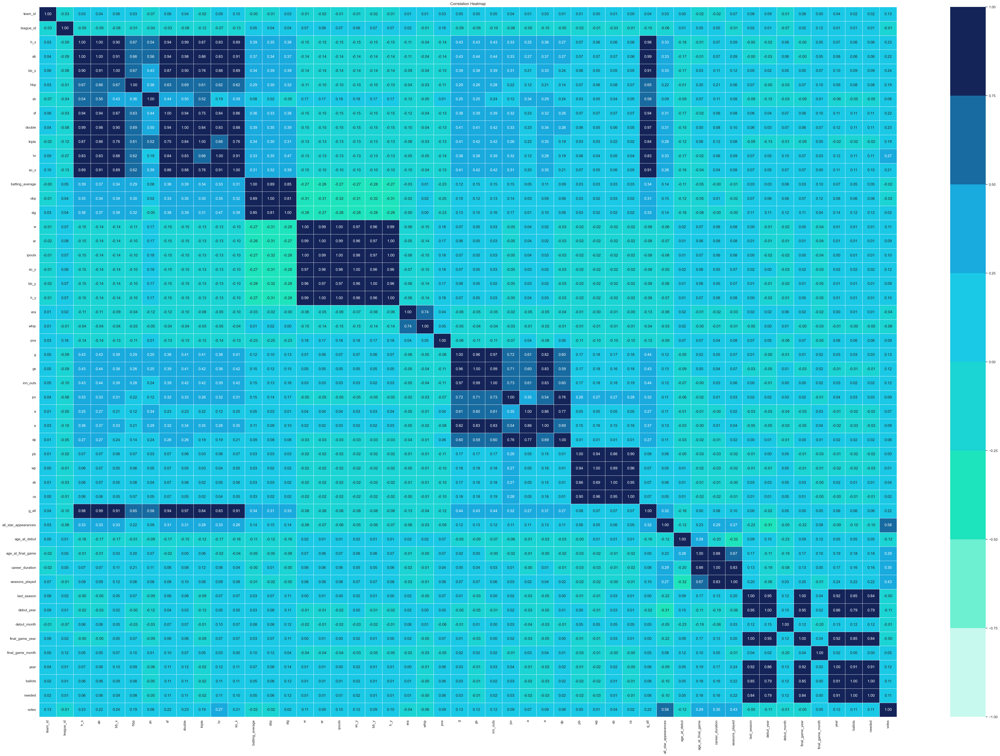

In [142]:

# Define your custom color scheme from lightest to darkest
custom_colors = ['#C7F9EE', '#6DF0D2', '#1DE4BD', '#1BD4D4', '#1AC9E6', '#19AADE', '#176BA0', '#142459']
cmap_custom = ListedColormap(custom_colors)

# Convert numeric columns to the correct data type if necessary
X_train[num_cols] = X_train[num_cols].apply(pd.to_numeric, errors='coerce')

# Calculate the correlation matrix
corr_matrix = X_train[num_cols].corr()

# Set up the matplotlib figure
plt.figure(figsize=(60, 40))

# Draw the heatmap
sns.heatmap(corr_matrix, cmap=cmap_custom, annot=True, fmt=".2f", linewidths=.5, vmin=-1, vmax=1)

plt.title("Correlation Heatmap")
plt.show()

In [143]:
X_train.describe()

,team_id,league_id,h_x,ab,bb_x,hbp,sh,sf,double,triple,...,seasons_played,last_season,debut_year,debut_month,final_game_year,final_game_month,year,ballots,needed,votes
count,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,...,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000,8838.000000
mean,21.932677,0.507920,585.778570,2075.912763,214.844309,14.906540,12.183526,19.136230,101.248699,15.215207,...,16.836275,1987.074678,1970.695406,6.920344,1987.074678,8.409369,1996.585427,469.571057,352.536886,73.954854
std,9.283296,0.499966,723.142372,2496.618210,283.838986,25.607466,22.051716,24.586645,128.020015,22.328472,...,3.288719,12.421179,12.550976,2.091218,12.421179,1.711675,10.974066,59.744470,44.773674,107.281175
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1960.000000,1939.000000,4.000000,1960.000000,4.000000,1980.000000,374.000000,281.000000,0.000000
25%,15.000000,0.000000,41.000000,179.000000,16.000000,1.000000,0.000000,1.000000,6.000000,0.000000,...,15.000000,1977.000000,1962.000000,4.000000,1977.000000,7.000000,1988.000000,425.000000,319.000000,1.000000
50%,21.000000,1.000000,228.000000,874.000000,77.000000,5.000000,3.000000,8.000000,38.000000,4.000000,...,17.000000,1986.000000,1969.000000,7.000000,1986.000000,9.000000,1995.000000,456.000000,342.000000,29.000000
75%,29.000000,1.000000,984.000000,3491.000000,342.000000,20.000000,13.000000,30.000000,168.000000,21.000000,...,19.000000,1997.000000,1980.000000,9.000000,1997.000000,10.000000,2006.000000,516.000000,387.000000,95.000000
max,43.000000,1.000000,3419.000000,11988.000000,1947.000000,285.000000,177.000000,127.000000,668.000000,137.000000,...,27.000000,2014.000000,2009.000000,10.000000,2014.000000,10.000000,2016.000000,581.000000,436.000000,555.000000


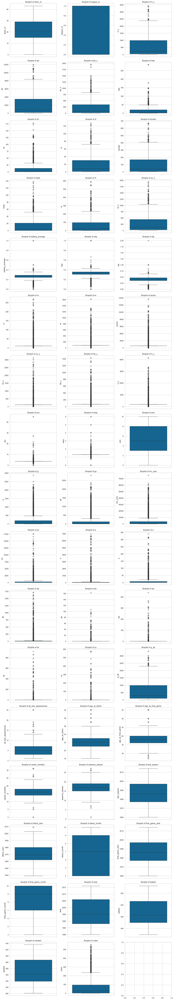

In [144]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create boxplots for each feature
features = X_train.columns
num_features = len(features)
num_cols = 3
num_rows = (num_features + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))

for i, feature in enumerate(features):
    row, col = divmod(i, num_cols)
    sns.boxplot(y=X_train[feature], ax=axes[row, col])
    axes[row, col].set_title(f'Boxplot of {feature}')

plt.tight_layout()
plt.show()


#### Winsorisation

In [145]:
# # create the capper

# windsorizer = Winsorizer(capping_method ='quantiles', # iqr removed most of the outliers, compared to mad, quantile and gaussian
#                        tail='both', # cap left, right or both tails
#                        fold =0.05,
#                        variables=['so_x', 'batting_average', 'obp', 'slg', 'w', 'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pb', 'wp', 'sb', 'cs'])

# windsorizer.fit(X_train)

In [146]:
# X_train = windsorizer.transform(X_train)

#### Capping Outliers

In [147]:
# # create the capper

# windsorizer = Winsorizer(capping_method='gaussian', # choose iqr for skewed or gaussian for normal
#                           tail='both', # cap left, right or both tails 
#                           fold=3,
#                           variables=['w', 'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pb', 'wp', 'sb', 'cs'])

# windsorizer.fit(X_train)

In [148]:
# X_train = windsorizer.transform(X_train)
# X_test = windsorizer.transform(X_test)

In [149]:
# # create the capper

# windsorizer = Winsorizer(capping_method='iqr', # choose iqr for skewed or gaussian for normal
#                           tail='both', # cap left, right or both tails 
#                           fold=3,
#                           variables=[ 'so_x', 'batting_average', 'obp', 'slg'])

# windsorizer.fit(X_train)

In [150]:
# X_train = windsorizer.transform(X_train)
# X_test = windsorizer.transform(X_test)

In [151]:
# # Create boxplots for each feature
# features = X_train[[ 'so_x', 'batting_average', 'obp', 'slg', 'w', 'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pb', 'wp', 'sb', 'cs']]
# num_features = len(features)
# num_cols = 3
# num_rows = (num_features + num_cols - 1) // num_cols

# fig, axes = plt.subplots(4, 4, figsize=(14, 10))
# #fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, num_rows * 3))

# for i, feature in enumerate(features):
#     row, col = divmod(i, num_cols)
#     sns.boxplot(y=X_train[feature], ax=axes[row, col])
#     axes[row, col].set_title(f'Boxplot of {feature}')

# plt.tight_layout()
# plt.show()

In [152]:
# Function to calculate the lower and upper bounds for capping
def find_boundaries(df, variable, distance):
    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)
    lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
    upper_boundary = df[variable].quantile(0.75) + (IQR * distance)
    return upper_boundary, lower_boundary

# Function to cap outliers
def cap_outliers(df, column, lower_bound, upper_bound):
    df[column] = df[column].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)

# List of columns to cap
columns_to_cap = ['so_x', 'batting_average', 'obp', 'slg', 'w', 'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pb', 'wp', 'sb', 'cs']

# Distance parameter for capping (1.5 times IQR is a common choice)
distance = 1.5

# Apply outlier capping to each column in the list
for column in columns_to_cap:
    upper_bound, lower_bound = find_boundaries(HoF_df, column, distance)
    cap_outliers(HoF_df, column, lower_bound, upper_bound)

# Check the descriptive statistics after capping
print(HoF_df[columns_to_cap].describe())



               so_x  batting_average           obp           slg            w  \
count  12627.000000     11857.000000  11864.000000  11857.000000  2474.000000   
mean     279.685990         0.258701      0.324486      0.394876    27.712813   
std      322.139295         0.044059      0.051199      0.104457    34.479166   
min        0.000000         0.163594      0.218476      0.166950     0.000000   
25%       30.000000         0.239679      0.302026      0.347682     2.000000   
50%      128.000000         0.267822      0.333828      0.411987    11.000000   
75%      444.000000         0.290402      0.357726      0.468170    41.000000   
max     1065.000000         0.366488      0.441276      0.648902    99.500000   

                er       ipouts         so_y         bb_y          h_y  \
count  2474.000000  2474.000000  2474.000000  2474.000000  2474.000000   
mean    171.156376  1325.014753   297.988884   144.409105   420.690784   
std     198.247314  1568.413820   369.950545   1

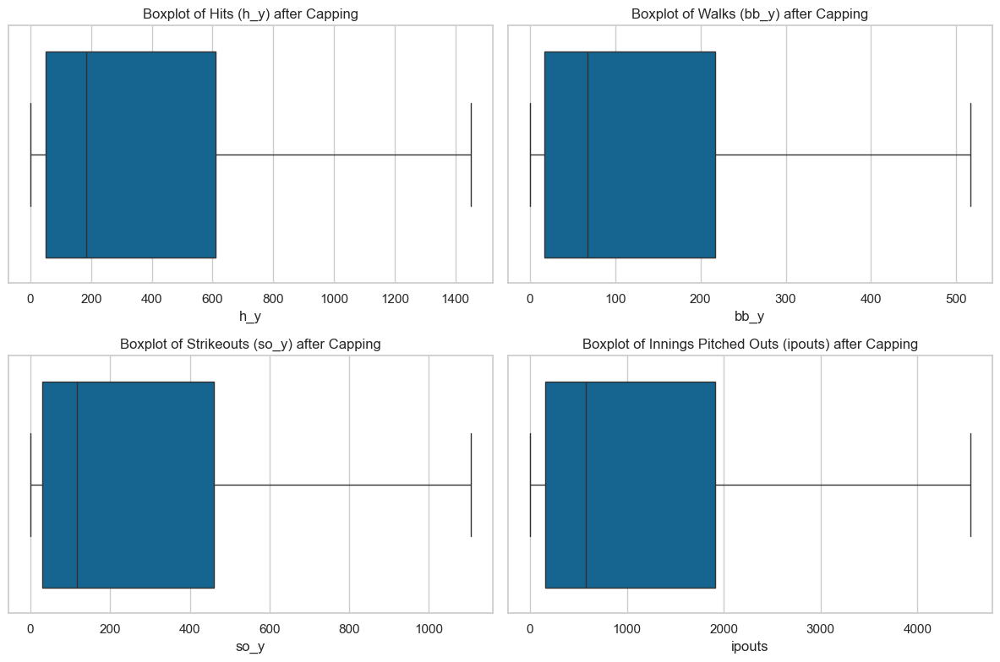

In [153]:

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
sns.boxplot(x=HoF_df['h_y'])
plt.title('Boxplot of Hits (h_y) after Capping')

plt.subplot(2, 2, 2)
sns.boxplot(x=HoF_df['bb_y'])
plt.title('Boxplot of Walks (bb_y) after Capping')

plt.subplot(2, 2, 3)
sns.boxplot(x=HoF_df['so_y'])
plt.title('Boxplot of Strikeouts (so_y) after Capping')

plt.subplot(2, 2, 4)
sns.boxplot(x=HoF_df['ipouts'])
plt.title('Boxplot of Innings Pitched Outs (ipouts) after Capping')

plt.tight_layout()
plt.show()


#### Outlier Trimming

In [154]:
# def find_boundaries(df, variable, distance):

#     # Let's calculate the boundaries outside which sit the outliers
#     # for skewed distributions

#     # distance passed as an argument, gives us the option to
#     # estimate 1.5 times or 3 times the IQR to calculate
#     # the boundaries.
# # 
#     IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

#     lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
#     upper_boundary = df[variable].quantile(0.75) + (IQR * distance)

#     return upper_boundary, lower_boundary

In [155]:
# RM_upper_limit, RM_lower_limit = find_boundaries(X_train, 'ipouts', 1.5)
# RM_upper_limit, RM_lower_limit

In [156]:
# outliers_RM = np.where(X_train['sb'] > RM_upper_limit, True,
#                       np.where(X_train['sb'] < RM_lower_limit, True, False)) #2400 - hy, bb_y: 755, 1502- so_y, 7394.0 ipouts

In [157]:
# # let's trim the dataset by removing only RM outliers

# X_train_trimmed = X_train.loc[~outliers_RM ]

# X_train.shape, X_train_trimmed.shape

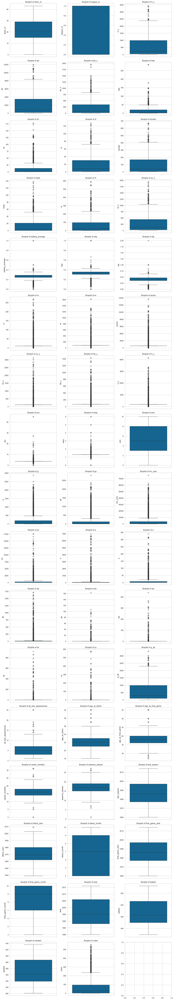

In [158]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create boxplots for each feature
features = X_train.columns
num_features = len(features)
num_cols = 3
num_rows = (num_features + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))

for i, feature in enumerate(features):
    row, col = divmod(i, num_cols)
    sns.boxplot(y=X_train[feature], ax=axes[row, col])
    axes[row, col].set_title(f'Boxplot of {feature}')

plt.tight_layout()
plt.show()


In [159]:
X_train.columns

Index(['team_id', 'league_id', 'h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf',
       'double', 'triple', 'hr', 'so_x', 'batting_average', 'obp', 'slg', 'w',
       'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pos', 'g', 'gs',
       'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'g_all',
       'all_star_appearances', 'age_at_debut', 'age_at_final_game',
       'career_duration', 'seasons_played', 'last_season', 'debut_year',
       'debut_month', 'final_game_year', 'final_game_month', 'year', 'ballots',
       'needed', 'votes'],
      dtype='object')

In [160]:
# Convert all object columns to numeric
for col in X_train.select_dtypes(include=['object']).columns:
    X_train[col] = pd.to_numeric(X_train[col], errors='coerce')

print(X_train)
print(X_train.dtypes)

       team_id  league_id     h_x      ab   bb_x   hbp    sh    sf  double  \
95339       30          0  1448.0  4883.0  508.0  42.0  10.0  53.0   241.0   
62098        0          1    72.0   315.0   33.0   8.0   4.0   3.0    12.0   
14302       31          0   542.0  2176.0  219.0  20.0   2.0  31.0    73.0   
17174       19          1   189.0   731.0   56.0   2.0   6.0   6.0    27.0   
1443        15          1   564.0  1748.0  243.0  17.0  32.0  28.0   114.0   
...        ...        ...     ...     ...    ...   ...   ...   ...     ...   
40578       22          0  1556.0  5581.0  765.0  21.0  45.0  37.0   248.0   
25669       12          0  1033.0  3628.0  645.0  31.0   6.0  46.0   234.0   
75850       38          1  2452.0  8225.0  670.0  64.0   5.0  94.0   373.0   
84619       12          0   341.0  1164.0  148.0   5.0   1.0  15.0    59.0   
17704       29          0  2326.0  8723.0  736.0  21.0  74.0  86.0   389.0   

       triple  ...  seasons_played  last_season  debut_year  de

## Tranformation <a name="part5.7"></a>


In [161]:
X_train.hist(bins=30, figsize=(120,120))

array([[<Axes: title={'center': 'team_id'}>,
        <Axes: title={'center': 'league_id'}>,
        <Axes: title={'center': 'h_x'}>, <Axes: title={'center': 'ab'}>,
        <Axes: title={'center': 'bb_x'}>,
        <Axes: title={'center': 'hbp'}>, <Axes: title={'center': 'sh'}>],
       [<Axes: title={'center': 'sf'}>,
        <Axes: title={'center': 'double'}>,
        <Axes: title={'center': 'triple'}>,
        <Axes: title={'center': 'hr'}>, <Axes: title={'center': 'so_x'}>,
        <Axes: title={'center': 'batting_average'}>,
        <Axes: title={'center': 'obp'}>],
       [<Axes: title={'center': 'slg'}>, <Axes: title={'center': 'w'}>,
        <Axes: title={'center': 'er'}>,
        <Axes: title={'center': 'ipouts'}>,
        <Axes: title={'center': 'so_y'}>,
        <Axes: title={'center': 'bb_y'}>,
        <Axes: title={'center': 'h_y'}>],
       [<Axes: title={'center': 'era'}>,
        <Axes: title={'center': 'whip'}>,
        <Axes: title={'center': 'pos'}>, <Axes: title={'c

In [162]:
 # Step 1: Identify non-positive values
 non_positive_values = X_train[['h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf', 'double', 'triple', 'hr',
       'so_x', 'batting_average', 'obp', 'slg', 'w', 'er', 'ipouts', 'so_y',
       'bb_y', 'h_y', 'era', 'whip', 'g', 'gs', 'inn_outs', 'po', 'a', 'e',
       'dp', 'pb', 'wp', 'sb', 'cs', 'g_all', 'all_star_appearances',
       'seasons_played', 'last_season', 'debut_year', 'debut_month',
       'final_game_year', 'final_game_month', 'year', 'ballots', 'needed',
       'votes']] <= 0
 non_positive_columns = non_positive_values.any()
 print("Columns with non-positive values:\n", non_positive_columns[non_positive_columns].index.tolist())
 for col in non_positive_columns[non_positive_columns].index:
     print(f"\nRows with non-positive values in column '{col}':")

Columns with non-positive values:
 ['h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf', 'double', 'triple', 'hr', 'so_x', 'batting_average', 'obp', 'slg', 'w', 'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'gs', 'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'g_all', 'votes']

Rows with non-positive values in column 'h_x':

Rows with non-positive values in column 'ab':

Rows with non-positive values in column 'bb_x':

Rows with non-positive values in column 'hbp':

Rows with non-positive values in column 'sh':

Rows with non-positive values in column 'sf':

Rows with non-positive values in column 'double':

Rows with non-positive values in column 'triple':

Rows with non-positive values in column 'hr':

Rows with non-positive values in column 'so_x':

Rows with non-positive values in column 'batting_average':

Rows with non-positive values in column 'obp':

Rows with non-positive values in column 'slg':

Rows with non-positive values in column 'w':

Rows with non-positive values

#### Yeo Johnson Transformation <a name="part6.1"></a>


In [163]:
# # initialize the transformer with a subset of variables to transform
# yjt = YeoJohnsonTransformer(variables = [ 'g_pitching',
#        'ipouts', 'h_pitching', 'er', 'bb_pitching',
#        'so_pitching', 'era',
#         'bfp', 'r_y', 'g_fielding',
#        'inn_outs', 'po', 'a', 'g_all','g_defense',
#        'g_p'])

# #fit transformer to the dataframe
# yjt.fit(X_train)

In [164]:
# Select only numeric columns
num_cols = X_train.select_dtypes(include=[np.number]).columns

In [165]:
num_cols

Index(['team_id', 'league_id', 'h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf',
       'double', 'triple', 'hr', 'so_x', 'batting_average', 'obp', 'slg', 'w',
       'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pos', 'g', 'gs',
       'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'g_all',
       'all_star_appearances', 'age_at_debut', 'age_at_final_game',
       'career_duration', 'seasons_played', 'last_season', 'debut_year',
       'debut_month', 'final_game_year', 'final_game_month', 'year', 'ballots',
       'needed', 'votes'],
      dtype='object')

In [166]:
# initialize the transformer with a subset of variables to transform
yjt = YeoJohnsonTransformer(variables = [ 'h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf', 'double', 'triple', 'hr','g', 'gs', 'inn_outs', 'po', 'a', 'e',
       'dp', 'pb', 'wp',
       'so_x',  'sb', 'cs', 'g_all', 'all_star_appearances',
       'seasons_played','debut_month','final_game_month',
       'votes','w', 'er', 'ipouts', 'so_y',
       'bb_y', 'h_y',])

#fit transformer to the dataframe
yjt.fit(X_train)

YeoJohnsonTransformer(variables=['h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf',
                                 'double', 'triple', 'hr', 'g', 'gs',
                                 'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp',
                                 'so_x', 'sb', 'cs', 'g_all',
                                 'all_star_appearances', 'seasons_played',
                                 'debut_month', 'final_game_month', 'votes',
                                 'w', 'er', 'ipouts', ...])

In [167]:
X_train = yjt.transform(X_train)
X_test = yjt.transform(X_test)

In [168]:
# # Number of features
# n_features = X_train.shape[1]

# # Create a subplot grid
# fig, axes = plt.subplots(n_features, 1, figsize=(100, 200))

# # Plot Q-Q plots for each feature
# for i, feature in enumerate(X_train.columns):
#    ax = axes[i]
#    stats.probplot(X_train[feature], dist="norm", plot=ax)
#    ax.set_title(f'Q-Q Plot for {feature}')
#    ax.get_lines()[1].set_color('r')  # Line of best fit color

# #Adjust layout
# plt.tight_layout()
# plt.show()

In [169]:
X_train.columns

Index(['team_id', 'league_id', 'h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf',
       'double', 'triple', 'hr', 'so_x', 'batting_average', 'obp', 'slg', 'w',
       'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pos', 'g', 'gs',
       'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'g_all',
       'all_star_appearances', 'age_at_debut', 'age_at_final_game',
       'career_duration', 'seasons_played', 'last_season', 'debut_year',
       'debut_month', 'final_game_year', 'final_game_month', 'year', 'ballots',
       'needed', 'votes'],
      dtype='object')

In [170]:
X_train.hist(bins=30, figsize=(120,120))


array([[<Axes: title={'center': 'team_id'}>,
        <Axes: title={'center': 'league_id'}>,
        <Axes: title={'center': 'h_x'}>, <Axes: title={'center': 'ab'}>,
        <Axes: title={'center': 'bb_x'}>,
        <Axes: title={'center': 'hbp'}>, <Axes: title={'center': 'sh'}>],
       [<Axes: title={'center': 'sf'}>,
        <Axes: title={'center': 'double'}>,
        <Axes: title={'center': 'triple'}>,
        <Axes: title={'center': 'hr'}>, <Axes: title={'center': 'so_x'}>,
        <Axes: title={'center': 'batting_average'}>,
        <Axes: title={'center': 'obp'}>],
       [<Axes: title={'center': 'slg'}>, <Axes: title={'center': 'w'}>,
        <Axes: title={'center': 'er'}>,
        <Axes: title={'center': 'ipouts'}>,
        <Axes: title={'center': 'so_y'}>,
        <Axes: title={'center': 'bb_y'}>,
        <Axes: title={'center': 'h_y'}>],
       [<Axes: title={'center': 'era'}>,
        <Axes: title={'center': 'whip'}>,
        <Axes: title={'center': 'pos'}>, <Axes: title={'c

#### Logarithmic Transformation <a name="part6.1"></a>


In [171]:
# # initialize the transformer
# lt = LogTransformer(variables=['last_season', 'debut_year', 'debut_month',
#        'final_game_year', 'year', 'ballots', 'needed'])

# # fit transformer to data set
# lt.fit(X_train)

In [172]:
# # transform variables within our data set
# X_train = lt.transform(X_train)
# X_test = lt.transform(X_test)

In [173]:
# X_train.hist(bins=30, figsize=(120,120))
# #no change observed

C:\Users\sahan\AppData\Local\Temp\ipykernel_25220\1787133154.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable], bins=30)


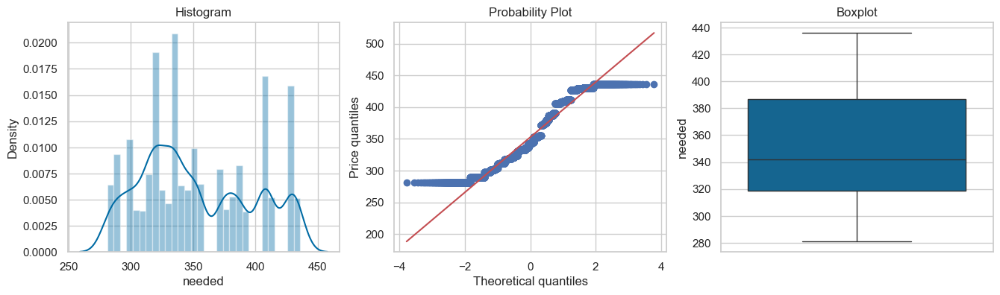

In [174]:
diagnostic_plots(X_train, 'needed')

C:\Users\sahan\AppData\Local\Temp\ipykernel_25220\1787133154.py:10: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[variable], bins=30)


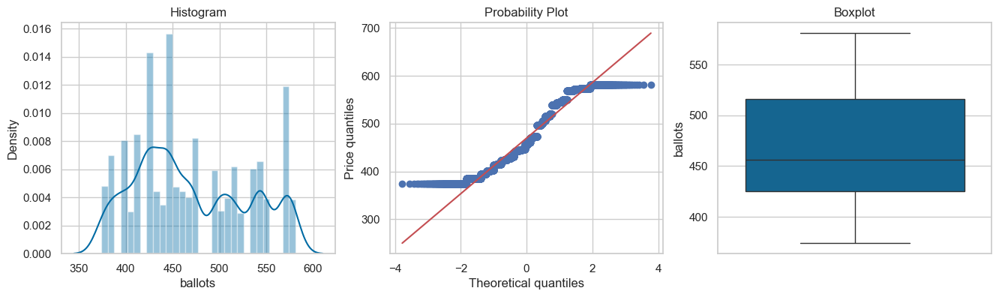

In [175]:
diagnostic_plots(X_train, 'ballots')

#### Reciprocal Transformation <a name="part6.1"></a>


In [176]:
# # List of variables to check
# variables = ['birth_year', 'birth_month', 'birth_day', 'birth_country',
#        'birth_state', 'death_year', 'weight', 'height', 'bats', 'throws',
#        'debut_year', 'debut_month', 'final_game_year', 'final_game_month',
#        'year', 'ballots', 'needed', 'votes', 'league_id_batting',
#        'g_batting_x', 'ab', 'r_x', 'h_batting', 'double', 'triple',
#        'hr_batting', 'rbi', 'cs', 'bb_batting', 'so_batting', 'ibb_batting',
#        'hbp_batting', 'sf_batting', 'g_idp_x', 'team_id_pitching',
#        'league_id_pitching', 'w', 'l', 'g_pitching', 'gs_x', 'cg', 'sho', 'sv',
#        'ipouts', 'h_pitching', 'er', 'hr_pitching', 'bb_pitching',
#        'so_pitching', 'baopp', 'era', 'ibb_pitching', 'wp', 'hbp_pitching',
#        'bk', 'bfp', 'gf', 'r_y', 'sh_pitching', 'sf_pitching', 'g_idp_y',
#        'team_id_fielding', 'league_id_fielding', 'pos', 'g_fielding', 'gs_y',
#        'inn_outs', 'po', 'a', 'e', 'dp', 'team_id_appearances',
#        'league_id_appearances', 'g_all', 'gs', 'g_batting_y', 'g_defense',
#        'g_p', 'g_c', 'g_1b', 'g_2b', 'g_3b', 'g_ss', 'g_lf', 'g_cf', 'g_rf',
#        'g_of', 'g_dh', 'g_ph', 'g_pr', 'game_id', 'team_id_all_star',
#        'league_id_all_star', 'gp']

# # Check for zero values in the specified columns
# for variable in variables:
#     zero_values = X_train[X_train[variable] == 0]
#     if zero_values.empty:
#         print(f"Column '{variable}' contains no zero values at indices:")


In [177]:
# #initialize the transformer
# rt = ReciprocalTransformer(variables = ['last_season', 'debut_year', 'debut_month',
#        'final_game_year', 'year', 'ballots', 'needed'])

# #fit transformer to the entire dataframe
# rt.fit(X_train)

In [178]:
# # transform the indicated variables within our data set
# X_train = rt.transform(X_train)

In [179]:
# X_train.hist(bins=30, figsize=(120,120))

#### Square Transformation <a name="part6.1"></a>


In [180]:
# X_train[num_cols].columns

In [181]:
# # set up PowerTransformer with the square root exponent
# et = PowerTransformer(variables = ['birth_year', 'birth_month', 'birth_day', 'birth_country',
#        'birth_state', 'death_year', 'weight', 'height', 'bats', 'throws',
#        'debut_year', 'debut_month', 'final_game_year', 'final_game_month',
#        'year', 'ballots', 'needed', 'votes', 'league_id_batting',
#        'g_batting_x', 'ab', 'r_x', 'h_batting', 'double', 'triple',
#        'hr_batting', 'rbi', 'cs', 'bb_batting', 'so_batting', 'ibb_batting',
#        'hbp_batting', 'sf_batting', 'g_idp_x', 'team_id_pitching',
#        'league_id_pitching', 'w', 'l', 'g_pitching', 'gs_x', 'cg', 'sho', 'sv',
#        'ipouts', 'h_pitching', 'er', 'hr_pitching', 'bb_pitching',
#        'so_pitching', 'baopp', 'era', 'ibb_pitching', 'wp', 'hbp_pitching',
#        'bk', 'bfp', 'gf', 'r_y', 'sh_pitching', 'sf_pitching', 'g_idp_y',
#        'team_id_fielding', 'league_id_fielding', 'pos', 'g_fielding', 'gs_y',
#        'inn_outs', 'po', 'a', 'e', 'dp', 'team_id_appearances',
#        'league_id_appearances', 'g_all', 'gs', 'g_batting_y', 'g_defense',
#        'g_p', 'g_c', 'g_1b', 'g_2b', 'g_3b', 'g_ss', 'g_lf', 'g_cf', 'g_rf',
#        'g_of', 'g_dh', 'g_ph', 'g_pr', 'game_id', 'team_id_all_star',
#        'league_id_all_star', 'gp'], exp=1/3) # for cube root

# # fit transformer to data 
# et.fit(X_train)

In [182]:
# # transform indicated variables within our dataframe
# X_train = et.transform(X_train)
# X_test = et.transform(X_test)

In [183]:
# X_train.hist(bins=30, figsize=(120,120))

#### Box Cox Transformation <a name="part6.1"></a>


In [184]:
# #Apply the BoxCox transformer
# bct = BoxCoxTransformer(variables=['last_season', 'debut_year', 'debut_month',
#        'final_game_year', 'year', 'ballots', 'needed'])
# bct.fit(X_train)
# X_train = bct.transform(X_train)

In [185]:
# the transformer stores the optimal parameter for each 
# variable in a dictionary in its attribute lambda_dict_

#bct.lambda_dict_

In [186]:
# diagnostic_plots(X_train, 'ballots')

In [187]:
# diagnostic_plots(X_train, 'needed')

#### Power Transformation <a name="part6.1"></a>


In [188]:
# #from sklearn.pipeline import Pipeline
# pipe = Pipeline([
#     ('power1', PowerTransformer(variables = ['last_season', 'debut_year', 'debut_month',
#        'final_game_year', 'year',], exp=0.6)),    
#     ('power2', PowerTransformer(variables = [ 'ballots', 'needed'], exp=0.4))
#      ])



In [189]:
# pipe.fit(X_train)

In [190]:
# X_train = pipe.transform(X_train)
# X_test = pipe.transform(X_test)

In [191]:
# X_train.hist(bins=30, figsize=(120,120))

## Variable Discretization / Binning <a name="part5.8"></a>


In [192]:
X_train.columns

Index(['team_id', 'league_id', 'h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf',
       'double', 'triple', 'hr', 'so_x', 'batting_average', 'obp', 'slg', 'w',
       'er', 'ipouts', 'so_y', 'bb_y', 'h_y', 'era', 'whip', 'pos', 'g', 'gs',
       'inn_outs', 'po', 'a', 'e', 'dp', 'pb', 'wp', 'sb', 'cs', 'g_all',
       'all_star_appearances', 'age_at_debut', 'age_at_final_game',
       'career_duration', 'seasons_played', 'last_season', 'debut_year',
       'debut_month', 'final_game_year', 'final_game_month', 'year', 'ballots',
       'needed', 'votes'],
      dtype='object')

#### Equal Frequency Discretization <a name="part6.1"></a>


In [193]:
# # with feature engine we can automate the process for many variables
# # in one line of code

# disc = EqualFrequencyDiscretiser(
#     q=5, variables=['h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf', 'double', 'triple', 'hr',
#        'so_x',  'sb', 'cs', 'g_all', 'all_star_appearances',
#        'seasons_played','debut_month','final_game_month',
#        'votes'], return_object=True)

# disc.fit(X_train)

In [194]:
# # transform train and test

# X_train = disc.transform(X_train)
# X_test = disc.transform(X_test)

In [195]:
# X_train[['birth_year',
#     'birth_month',
#     'birth_day',
#     'death_year',
#     'weight',
#     'height',
#     'debut_year',
#     'debut_month',
#     'final_game_year',
#     'final_game_month',
#     'ballots',
#     'needed',
#     'votes',
#     'ab',
#     'r_x',
#     'h_batting',
#     'double',
#     'triple',
#     'hr_batting',
#     'rbi',
#     'cs',
#     'bb_batting',
#     'so_batting',
#     'ibb_batting',
#     'hbp_batting',
#     'sf_batting',
#     'g_idp_x',
#     'w',
#     'l',
#     'gs_x',
#     'cg',
#     'sho',
#     'sv',
#     'hr_pitching',
#     'baopp',
#     'era',
#     'ibb_pitching',
#     'wp',
#     'hbp_pitching',
#     'bk',
#     'gf',
#     'sh_pitching',
#     'sf_pitching',
#     'g_idp_y',
#     'po',
#     'a',
#     'e',
#     'dp']]

In [196]:
# # let's explore if the bins have a linear relationship
# # with the target: we see they don't

# pd.concat([X_train, y_train], axis=1).groupby('hr_pitching')['inducted'].mean().plot()
# plt.ylabel('mean of price')

In [197]:
# enc = OrdinalEncoder(encoding_method = 'ordered')

# enc.fit(X_train, y_train)

In [198]:
# # we can fnd the list of encoded variables here
# enc.variables

In [199]:
# # we can find a list of the re-ordered bins mappings here
# enc.encoder_dict_

In [200]:
# # let's transformt the data sets
# X_train = enc.transform(X_train)
# X_test = enc.transform(X_test)

In [201]:
# pd.concat([X_train, y_train], axis=1).groupby('hr_pitching')['inducted'].mean().plot()
# plt.ylabel('mean of price')

In [202]:
# print(X_train[['g_c', 'g_1b', 'g_2b', 'g_3b', 'g_ss', 'g_lf', 'g_cf', 'g_rf', 'g_of', 'g_dh', 'g_ph', 'game_id', 'team_id_all_star', 'league_id_all_star', 'g_pr']].head())


In [203]:
# columns_to_drop = [ 'game_id', 'team_id_all_star', 'league_id_all_star']#, 'g_pr', 'g_c', 'g_1b', 'g_2b', 'g_3b', 'g_ss', 'g_lf', 'g_cf', 'g_rf', 'g_of', 'g_dh', 'g_ph',
# X_train = X_train.drop(columns=columns_to_drop)
# X_test = X_test.drop(columns=columns_to_drop)


#### Equal Width Discretization <a name="part6.1"></a>


In [204]:
# with feature engine we can automate the process for many variables
# in one line of code

disc = EqualWidthDiscretiser(bins=10, variables = ['h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf', 'double', 'triple', 'hr',
        'so_x',  'sb', 'cs', 'g_all', 'all_star_appearances',
        'seasons_played','debut_month','final_game_month',
        'votes'])

disc.fit(X_train)

EqualWidthDiscretiser(variables=['h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf',
                                 'double', 'triple', 'hr', 'so_x', 'sb', 'cs',
                                 'g_all', 'all_star_appearances',
                                 'seasons_played', 'debut_month',
                                 'final_game_month', 'votes'])

In [205]:
disc.binner_dict_

{'h_x': [-inf,
  1.9666870246694639,
  3.9333740493389278,
  5.900061074008391,
  7.8667480986778555,
  9.83343512334732,
  11.800122148016783,
  13.766809172686248,
  15.733496197355711,
  17.700183222025174,
  inf],
 'ab': [-inf,
  3.2249673850224383,
  6.449934770044877,
  9.674902155067315,
  12.899869540089753,
  16.12483692511219,
  19.34980431013463,
  22.574771695157068,
  25.799739080179506,
  29.024706465201945,
  inf],
 'bb_x': [-inf,
  1.4789274613376748,
  2.9578549226753497,
  4.436782384013025,
  5.915709845350699,
  7.394637306688374,
  8.87356476802605,
  10.352492229363724,
  11.831419690701399,
  13.310347152039073,
  inf],
 'hbp': [-inf,
  0.4352874862301389,
  0.8705749724602778,
  1.3058624586904166,
  1.7411499449205556,
  2.1764374311506947,
  2.6117249173808332,
  3.0470124036109723,
  3.4822998898411113,
  3.9175873760712503,
  inf],
 'sh': [-inf,
  0.3174033899070227,
  0.6348067798140454,
  0.9522101697210681,
  1.2696135596280909,
  1.5870169495351136,
  1.

In [206]:
X_train = disc.transform(X_train)
X_test = disc.transform(X_test)

In [207]:
# Note that feature_engine maintain the order of original columns and return a dataframe
X_train.isnull().sum()

team_id                 0
league_id               0
h_x                     0
ab                      0
bb_x                    0
hbp                     0
sh                      0
sf                      0
double                  0
triple                  0
hr                      0
so_x                    0
batting_average         0
obp                     0
slg                     0
w                       0
er                      0
ipouts                  0
so_y                    0
bb_y                    0
h_y                     0
era                     0
whip                    0
pos                     0
g                       0
gs                      0
inn_outs                0
po                      0
a                       0
e                       0
dp                      0
pb                      0
wp                      0
sb                      0
cs                      0
g_all                   0
all_star_appearances    0
age_at_debut            0
age_at_final

In [208]:
# Note that feature_engine maintain the order of original columns and return a dataframe
X_test.isnull().sum()

team_id                 0
league_id               0
h_x                     0
ab                      0
bb_x                    0
hbp                     0
sh                      0
sf                      0
double                  0
triple                  0
hr                      0
so_x                    0
batting_average         0
obp                     0
slg                     0
w                       0
er                      0
ipouts                  0
so_y                    0
bb_y                    0
h_y                     0
era                     0
whip                    0
pos                     0
g                       0
gs                      0
inn_outs                0
po                      0
a                       0
e                       0
dp                      0
pb                      0
wp                      0
sb                      0
cs                      0
g_all                   0
all_star_appearances    0
age_at_debut            0
age_at_final

In [209]:
X_train.hist(bins=30, figsize=(120,120))

array([[<Axes: title={'center': 'team_id'}>,
        <Axes: title={'center': 'league_id'}>,
        <Axes: title={'center': 'h_x'}>, <Axes: title={'center': 'ab'}>,
        <Axes: title={'center': 'bb_x'}>,
        <Axes: title={'center': 'hbp'}>, <Axes: title={'center': 'sh'}>],
       [<Axes: title={'center': 'sf'}>,
        <Axes: title={'center': 'double'}>,
        <Axes: title={'center': 'triple'}>,
        <Axes: title={'center': 'hr'}>, <Axes: title={'center': 'so_x'}>,
        <Axes: title={'center': 'batting_average'}>,
        <Axes: title={'center': 'obp'}>],
       [<Axes: title={'center': 'slg'}>, <Axes: title={'center': 'w'}>,
        <Axes: title={'center': 'er'}>,
        <Axes: title={'center': 'ipouts'}>,
        <Axes: title={'center': 'so_y'}>,
        <Axes: title={'center': 'bb_y'}>,
        <Axes: title={'center': 'h_y'}>],
       [<Axes: title={'center': 'era'}>,
        <Axes: title={'center': 'whip'}>,
        <Axes: title={'center': 'pos'}>, <Axes: title={'c

#### Variable Discretization/Binning <a name="part6.1"></a>

In [210]:
# pd.concat([X_train, y_train], axis=1).groupby('cs')['inducted'].mean().plot()
# plt.ylabel('mean of price')

In [211]:
# #Task 1: Select two variables to perform variable discretization/binning

# disc = EqualFrequencyDiscretiser(q=10, variables = ['h_x', 'ab', 'bb_x', 'hbp', 'sh', 'sf', 'double', 'triple', 'hr',
#          'so_x',  'sb', 'cs', 'g_all', 'all_star_appearances',
#          'seasons_played','debut_month','final_game_month',
#          'votes'], return_object=True)

# disc.fit(X_train)

In [212]:
# disc.binner_dict_

In [213]:
# #transform train and test sets

# train_t = disc.transform(X_train)
# test_t = disc.transform(X_test)

In [214]:
# pd.concat([X_train, y_train], axis=1).groupby('cs')['inducted'].mean().plot()
# plt.ylabel('mean of price')

## Feature Engineer <a name="part5.9"></a>


#### Standardlisation <a name="part6.1"></a>


In [215]:
# standardisation: with the StandardScaler from sklearn

# set up the scaler
scaler = StandardScaler()

# fit the scaler to the train set, it will learn the parameters
scaler.fit(X_train)

# transform train and test sets
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [216]:
# the scaler stores the mean of the features, learned from train set

scaler.mean_

array([2.19326771e+01, 5.07920344e-01, 4.39522516e+00, 4.47522064e+00,
       3.85211586e+00, 3.21803575e+00, 3.51946142e+00, 3.86897488e+00,
       4.06868070e+00, 3.60285132e+00, 3.83163612e+00, 4.21701742e+00,
       2.52966437e-01, 3.16191491e-01, 3.91091201e-01, 2.55617266e+00,
       7.50635112e+00, 1.36260769e+01, 7.43019578e+00, 6.52555248e+00,
       9.20478096e+00, 3.63553631e+00, 1.32697993e+00, 4.98698801e+00,
       3.83472960e+00, 2.43729771e+00, 8.26435113e+00, 3.17895705e+00,
       1.62519472e+00, 8.48855557e-01, 7.04357546e-01, 1.44722971e-03,
       1.72675610e-03, 2.02647658e-01, 1.97556008e-01, 5.26816022e+00,
       2.93154560e+00, 2.19924191e+01, 3.83716904e+01, 1.63792713e+01,
       6.52760806e+00, 1.98707468e+03, 1.97069541e+03, 4.40110885e+00,
       1.98707468e+03, 5.46775289e+00, 1.99658543e+03, 4.69571057e+02,
       3.52536886e+02, 3.86422267e+00])

In [217]:
# let's transform the returned NumPy arrays to dataframes

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

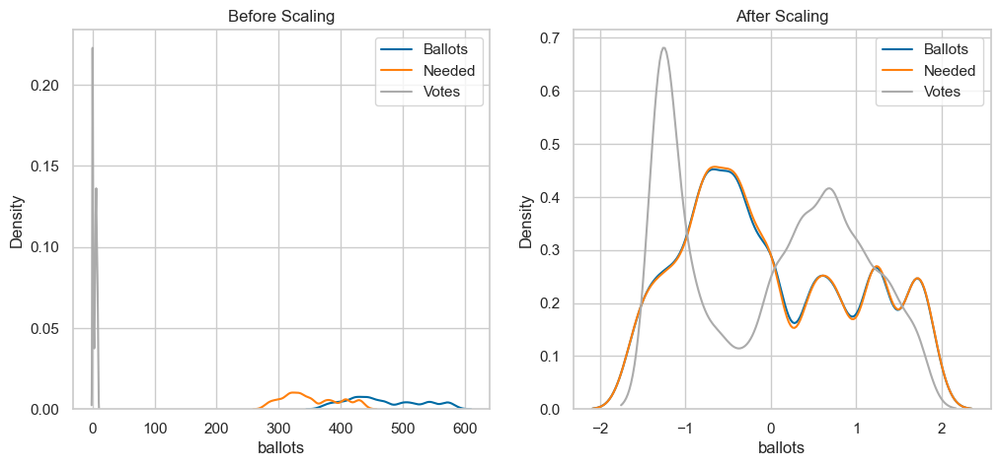

In [218]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(X_train['ballots'], ax=ax1, label ='Ballots')
sns.kdeplot(X_train['needed'], ax=ax1, label ='Needed')
sns.kdeplot(X_train['votes'], ax=ax1, label ='Votes')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(X_train_scaled['ballots'], ax=ax2, label ='Ballots')
sns.kdeplot(X_train_scaled['needed'], ax=ax2, label ='Needed')
sns.kdeplot(X_train_scaled['votes'], ax=ax2, label ='Votes')
ax2.legend()
plt.show()

In [219]:
# X_train = X_train_scaled
# X_test = X_test_scaled

#### Mean Normalisation <a name="part6.1"></a>


In [220]:
# # let's first learn the mean from the train set - unsupportedn fro negative strignsa nd floats

# means = X_train.mean(axis=0)
# means

In [221]:
# # let's now learn the min and max values, and the value range 
# # from the train set

# ranges = X_train.max(axis=0)-X_train.min(axis=0)
# ranges

In [222]:
# # now we are ready to perform mean normalization:
# X_train_scaled = (X_train - means) / ranges
# X_test_scaled = (X_test - means) / ranges

#### Robust Scaling <a name="part6.1"></a>


In [223]:
# # set up the scaler
# scaler = RobustScaler()

# # fit the scaler to the train set, it will learn the parameters
# scaler.fit(X_train)


# # transform train and test sets
# X_train_scaled = scaler.transform(X_train)
# X_test_scaled = scaler.transform(X_test)

In [224]:
# X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
# X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

In [225]:
# fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# # before scaling
# ax1.set_title('Before Scaling')
# sns.kdeplot(X_train['ballots'], ax=ax1, label ='Ballots')
# sns.kdeplot(X_train['needed'], ax=ax1, label ='Needed')
# sns.kdeplot(X_train['votes'], ax=ax1, label ='Votes')
# ax1.legend()

# # after scaling
# ax2.set_title('After Scaling')
# sns.kdeplot(X_train_scaled['ballots'], ax=ax2, label ='Ballots')
# sns.kdeplot(X_train_scaled['needed'], ax=ax2, label ='Needed')
# sns.kdeplot(X_train_scaled['votes'], ax=ax2, label ='Votes')
# ax2.legend()
# plt.show()

In [226]:
# X_train = X_train_scaled
# X_test = X_test_scaled

#### MinMax Scaling <a name="part6.1"></a>


In [227]:
# # set up the scaler
# scaler = MinMaxScaler()

# # fit the scaler to the train set, it will learn the parameters
# scaler.fit(X_train)

# # transform train and test sets
# X_train_scaled = scaler.transform(X_train)
# X_test_scaled = scaler.transform(X_test)

In [228]:
# X_train = pd.DataFrame(X_train_scaled, columns=X_train.columns)
# X_test = pd.DataFrame(X_test_scaled, columns=X_test.columns)

## PCA <a name="part5.10"></a>


In [229]:
# standardisation: with the StandardScaler from sklearn
from sklearn.decomposition import PCA


# the scaler - for standardization
from sklearn.preprocessing import StandardScaler

# set up the scaler
scaler = StandardScaler()

# fit the scaler to the train set, it will learn the parameters
scaler.fit(X_train)

# transform train and test sets
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [230]:
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [231]:
# set up the PCA

pca = PCA()

In [232]:
# show shape of X_train_scaled (X_train after StandardScaler)
print(X_train_scaled.shape)

(8838, 50)


In [233]:
# train the PCA
# insert code here
pca.fit(X_train_scaled)

PCA()

In [234]:
# create the principal components

train = pca.transform(X_train_scaled)
test = pca.transform(X_test_scaled)

In [235]:
# show the variance explanation for each Principal Component
print(len(pca.explained_variance_ratio_)) # largest to smallest
print(pca.explained_variance_ratio_)

50
[2.29931757e-01 1.48857059e-01 1.15295262e-01 9.04306119e-02
 6.95741490e-02 6.22186307e-02 3.91326546e-02 3.19294230e-02
 2.94319735e-02 2.24303685e-02 2.11297718e-02 1.97980080e-02
 1.88328993e-02 1.49022809e-02 1.46835921e-02 9.88517530e-03
 7.87415607e-03 6.85468984e-03 5.12537002e-03 4.61678118e-03
 4.28713321e-03 3.99491680e-03 3.52964083e-03 3.13041777e-03
 2.59741952e-03 2.35503815e-03 2.28270956e-03 2.03685014e-03
 1.93809075e-03 1.63964358e-03 1.25659919e-03 1.16413618e-03
 1.06503027e-03 8.33966338e-04 8.02883352e-04 7.50718340e-04
 6.07954345e-04 5.44654560e-04 5.00199809e-04 4.66781769e-04
 3.79265879e-04 3.48030278e-04 3.02187955e-04 1.65845369e-04
 6.73873053e-05 1.69776331e-05 9.06790505e-07 8.39142916e-33
 4.13223165e-33 1.34156998e-33]


Text(0, 0.5, 'Percentage of Variance Explained')

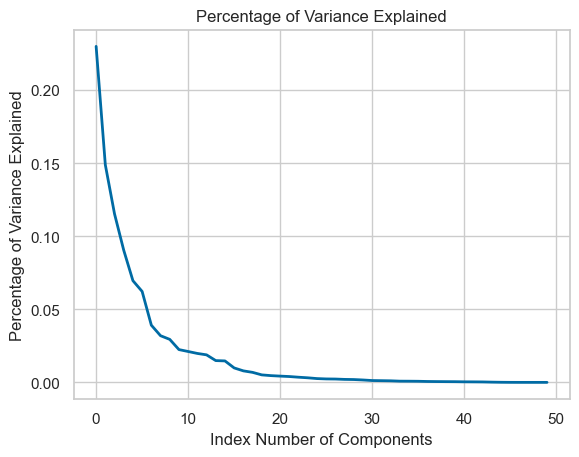

In [236]:
# determine the number of informative components

# the number of components is determined by the change
# in the decay in the percentage of variance explained
# by each component

plt.plot(pca.explained_variance_ratio_, linewidth=2)
plt.title('Percentage of Variance Explained')
plt.xlabel('Index Number of Components')
plt.ylabel('Percentage of Variance Explained')

# Machine Learning Modelling  <a name="part6.1"></a>


In [237]:
X_train.hist(bins=30, figsize=(120,120))

array([[<Axes: title={'center': 'team_id'}>,
        <Axes: title={'center': 'league_id'}>,
        <Axes: title={'center': 'h_x'}>, <Axes: title={'center': 'ab'}>,
        <Axes: title={'center': 'bb_x'}>,
        <Axes: title={'center': 'hbp'}>, <Axes: title={'center': 'sh'}>],
       [<Axes: title={'center': 'sf'}>,
        <Axes: title={'center': 'double'}>,
        <Axes: title={'center': 'triple'}>,
        <Axes: title={'center': 'hr'}>, <Axes: title={'center': 'so_x'}>,
        <Axes: title={'center': 'batting_average'}>,
        <Axes: title={'center': 'obp'}>],
       [<Axes: title={'center': 'slg'}>, <Axes: title={'center': 'w'}>,
        <Axes: title={'center': 'er'}>,
        <Axes: title={'center': 'ipouts'}>,
        <Axes: title={'center': 'so_y'}>,
        <Axes: title={'center': 'bb_y'}>,
        <Axes: title={'center': 'h_y'}>],
       [<Axes: title={'center': 'era'}>,
        <Axes: title={'center': 'whip'}>,
        <Axes: title={'center': 'pos'}>, <Axes: title={'c

### Logistic Regression Model - lbfgs <a name="part6.2"></a>


In [238]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

#logreg = LogisticRegression(solver='liblinear') # you can experiment with different combinations of multi_class and solver
logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs') # good option for larger datasets, fails here
logreg.fit(X_train, y_train)

C:\Users\sahan\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(multi_class='multinomial')

In [239]:
y_train_preds_logreg = logreg.predict(X_train)
y_test_preds_logreg = logreg.predict(X_test)

In [240]:
# train accuracy score
y_true = y_train
y_pred = y_train_preds_logreg

train_accuracy_logreg = accuracy_score(y_true, y_pred) * 100
print(f"The LogReg Model's accuracy on train data is {train_accuracy_logreg:.5f}%.")

# test accuracy score
y_true = y_test
y_pred = y_test_preds_logreg

test_accuracy_logreg = accuracy_score(y_true, y_pred) * 100
print(f"The LogReg Model's accuracy on test data is {test_accuracy_logreg:.5f}%.")

The LogReg Model's accuracy on train data is 97.73704%.
The LogReg Model's accuracy on test data is 97.80945%.


In [241]:
# The LogReg Model's accuracy on train data is 98.10690%.
# The LogReg Model's accuracy on test data is 95.84416%.


# Power transformation + equal width discretization + standardisation scaling
# The LogReg Model's accuracy on train data is 99.66592%.
# The LogReg Model's accuracy on test data is 98.44156%.

# yeo johnson + power tranforamtion + equal width discretization + standarisation and mean scaling + PCA
# The LogReg Model's accuracy on train data is 98.10690%.
# The LogReg Model's accuracy on test data is 97.66234%.

# yeo johnson + equal width + robust scaling + PCA
# The LogReg Model's accuracy on train data is 94.32071%.
# The LogReg Model's accuracy on test data is 95.06494%.

# winsorization + minmax scling
# The LogReg Model's accuracy on train data is 96.88196%.
# The LogReg Model's accuracy on test data is 97.66234%.

# no PCA, added in more freatures that were right skewed for yeojohnson trasnformation
# The LogReg Model's accuracy on train data is 98.75035%.
# The LogReg Model's accuracy on test data is 98.31606

# PCA does not affect the model it is just for analysis
# The LogReg Model's accuracy on train data is 98.75035%.
# The LogReg Model's accuracy on test data is 98.31606%.

#final model:
# The LogReg Model's accuracy on train data is 97.72573%.
# The LogReg Model's accuracy on test data is 97.73027%.

### Logistic Regression Model - liblinear <a name="part6.3"></a>


In [242]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

logreg = LogisticRegression(solver='liblinear') # you can experiment with different combinations of multi_class and solver
#logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs') # good option for larger datasets, fails here
logreg.fit(X_train, y_train)

LogisticRegression(solver='liblinear')

In [243]:
y_train_preds_logreg = logreg.predict(X_train)
y_test_preds_logreg = logreg.predict(X_test)

In [244]:
# train accuracy score
y_true = y_train
y_pred = y_train_preds_logreg

train_accuracy_logreg = accuracy_score(y_true, y_pred) * 100
print(f"The LogReg Model's accuracy on train data is {train_accuracy_logreg:.5f}%.")

# test accuracy score
y_true = y_test
y_pred = y_test_preds_logreg

test_accuracy_logreg = accuracy_score(y_true, y_pred) * 100
print(f"The LogReg Model's accuracy on test data is {test_accuracy_logreg:.5f}%.")

The LogReg Model's accuracy on train data is 98.95904%.
The LogReg Model's accuracy on test data is 98.91792%.



#### **1st Model**
- The LogReg Model's accuracy on train data is 100.00%.
- The LogReg Model's accuracy on test data is 99.23%.

#### **2nd Model**
- **Preprocessing Steps:**
  - Removed rows with ≥ 80% NaN
  - Removed `team_id_batting`
  - Dropped `votedby` (default for BBWAA)
- The LogReg Model's accuracy on train data is 100.00%.
- The LogReg Model's accuracy on test data is 99.99%.

#### **3rd Model**
- **Preprocessing Steps:**
  - dropped team_id and league_id for batting and all_star
- The LogReg Model's accuracy on train data is 100.00%.
- The LogReg Model's accuracy on test data is 99.99%.

#### **7th Model**
- **Preprocessing Steps:**
  - Used only variables that showed a difference in distribution
- The LogReg Model's accuracy on train data is 99.80%.
- The LogReg Model's accuracy on test data is 99.84%.

#### **8th Model**
- **Preprocessing Steps:**
  - Used `liblinear` for model training
  - Reset for the 6th attempt (kernel restart issue)
- The LogReg Model's accuracy on train data is 100.00%.
- The LogReg Model's accuracy on test data is 99.99%.

#### **9th Model**
- **Preprocessing Steps:**
  - Reciprocal transformation
- The LogReg Model's accuracy on train data is 99.95%.
- The LogReg Model's accuracy on test data is 99.73%.

#### **10th Model**
- **Preprocessing Steps:**
  - Performed square transformation on test and train data
- The LogReg Model's accuracy on train data is 99.99%.
- The LogReg Model's accuracy on test data is 99.93%.

#### **11th Model**
- **Preprocessing Steps:**
  - Only Yeo-Johnson transformation
- The LogReg Model's accuracy on train data is 100.00%.
- The LogReg Model's accuracy on test data is 99.99%.

#### **12th Model**
- **Preprocessing Steps:**
  - Yeo-Johnson and logarithmic transformation
- The LogReg Model's accuracy on train data is 99.96%.
- The LogReg Model's accuracy on test data is 99.91%.

#### **13th Model**
- **Preprocessing Steps:**
  - Equal frequency discretization
  - Dropped columns for IDs with all 0 values
- The LogReg Model's accuracy on train data is 99.80%.
- The LogReg Model's accuracy on test data is 99.84%.

#### **14th Model**
- **Preprocessing Steps:**
  - Equal width discretization on continuous variables
- The LogReg Model's accuracy on train data is 99.98%.
- The LogReg Model's accuracy on test data is 99.91%.

#### **15th Model**
- **Preprocessing Steps:**
  - Used calculated aggregate columns and merged with Hall of Fame data
- The LogReg Model's accuracy on train data is 98.78%.
- The LogReg Model's accuracy on test data is 98.18%.

#### **16th Model**
- **Preprocessing Steps:**
  - Used mean imputer
  - Yeo-Johnson transform on skewed data
  - No encoding (no categorical data)
- The LogReg Model's accuracy on train data is 96.44%.
- The LogReg Model's accuracy on test data is 93.51%.

#### **17th Model**
- **Preprocessing Steps:**
  - Logarithmic transformation on positive values
- The LogReg Model's accuracy on train data is 95.32%.
- The LogReg Model's accuracy on test data is 94.03%.

#### **18th Model**
- **Preprocessing Steps:**
  - Logarithmic + Yeo-Johnson (no difference observed)
  - Equal frequency discretization
- The LogReg Model's accuracy on train data is 95.32%.
- The LogReg Model's accuracy on test data is 94.03%.

#### **19th Model**
- **Preprocessing Steps:**
  - Used equal width discretization instead of previous methods
- The LogReg Model's accuracy on train data is 97.33%.
- The LogReg Model's accuracy on test data is 97.14%.

#### **20th Model**
- **Preprocessing Steps:**
  - Reciprocal and logarithmic transformation
- The LogReg Model's accuracy on train data is 98.55%.
- The LogReg Model's accuracy on test data is 97.14%.

#### **21st Model**
- **Preprocessing Steps:**
  - Only reciprocal transformation
- The LogReg Model's accuracy on train data is 98.44%.
- The LogReg Model's accuracy on test data is 97.14%.

#### **22nd Model**
- **Preprocessing Steps:**
  - Added 3 columns: 2 for age and 1 for career duration
- The LogReg Model's accuracy on train data is 98.44%.
- The LogReg Model's accuracy on test data is 97.14%.

#### **23rd Model**
- **Preprocessing Steps:**
  - Box-Cox transformation
  - Variable discretization where q=10
- The LogReg Model's accuracy on train data is 99.55%.
- The LogReg Model's accuracy on test data is 96.36%.

#### **24th Model**
- **Preprocessing Steps:**
  - Power transformation
  - Equal width discretization
  - Standardization scaling
- The LogReg Model's accuracy on train data is 99.22%.
- The LogReg Model's accuracy on test data is 97.40%.

#### **25th Model**
- **Preprocessing Steps:**
  - Yeo-Johnson + power transformation
  - Equal width discretization
  - Standardization and mean scaling
  - PCA
- The LogReg Model's accuracy on train data is 97.77%.
- The LogReg Model's accuracy on test data is 96.88%.

#### **26th Model**
- **Preprocessing Steps:**
  - Yeo-Johnson + equal width discretization
  - Robust scaling
  - PCA
- The LogReg Model's accuracy on train data is 96.88%.
- The LogReg Model's accuracy on test data is 97.14%.

#### **27th Model**
- **Preprocessing Steps:**
  - Winsorization
  - Min-Max scaling
- The LogReg Model's accuracy on train data is 94.88%.
- The LogReg Model's accuracy on test data is 96.36%.

#### **28th Model**
- **Preprocessing Steps:**
  - Standardization + Yeo-Johnson
  - Median imputer
  - Added `team_id` and `league_id` (used ordinal encoding)
- The LogReg Model's accuracy on train data is 98.17%.
- The LogReg Model's accuracy on test data is 97.86%.

#### **29th Model**
- **Preprocessing Steps:**
  - No PCA
  - More right-skewed features in Yeo-Johnson transformation
- The LogReg Model's accuracy on train data is 98.22%.
- The LogReg Model's accuracy on test data is 97.93%.

#### **30th Model**
- **Preprocessing Steps:**
  - PCA performed for analysis, but no significant change observed
- The LogReg Model's accuracy on train data is 98.22%.
- The LogReg Model's accuracy on test data is 97.93%.

### Decision Tree Classifier <a name="part6.4"></a>


In [245]:
from sklearn.metrics import accuracy_score

In [246]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

dtree = DecisionTreeClassifier(random_state=404)
dtree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=404)

In [247]:
y_train_preds_dtree = dtree.predict(X_train)
y_test_preds_dtree = dtree.predict(X_test)

In [248]:
# train accuracy score
y_true = y_train
y_pred = y_train_preds_dtree

train_accuracy_dtree = accuracy_score(y_true, y_pred) * 100
print(f"The DTree Model's accuracy on train data is {train_accuracy_dtree:.2f}%.")

# test accuracy score
y_true = y_test
y_pred = y_test_preds_dtree

test_accuracy_dtree = accuracy_score(y_true, y_pred) * 100
print(f"The DTRee Model's accuracy on test data is {test_accuracy_dtree:.5f}%.")

The DTree Model's accuracy on train data is 100.00%.
The DTRee Model's accuracy on test data is 99.76247%.



##### 1st
- The DTree Model's accuracy on train data is 100.00%.
- The DTRee Model's accuracy on test data is 97.43%.

##### 2nd
- The DTree Model's accuracy on train data is 100.00%.
- The DTRee Model's accuracy on test data is 99.92%

##### 3rd: dropped team_id and league_id for batting and all_star
- The DTree Model's accuracy on train data is 100.00%.
- The DTRee Model's accuracy on test data is 99.89%.

##### Final model: 
- The DTree Model's accuracy on train data is 100.00%.
- 
The DTRee Model's accuracy on test data is 99.76247%.

#### Predicted Values

In [249]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Train the Logistic Regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_test_pred = model.predict(X_test)

# Evaluate the model performance
accuracy = accuracy_score(y_test, y_test_pred)
conf_matrix = confusion_matrix(y_test, y_test_pred)
class_report = classification_report(y_test, y_test_pred)

print(f"Test Accuracy: {accuracy}")
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", class_report)

# Display predictions
print("Predictions for new data:", y_test_pred)


Test Accuracy: 0.9770387965162312
Confusion Matrix:
 [[3603   28]
 [  59   99]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99      3631
           1       0.78      0.63      0.69       158

    accuracy                           0.98      3789
   macro avg       0.88      0.81      0.84      3789
weighted avg       0.98      0.98      0.98      3789

Predictions for new data: [0 0 0 ... 0 0 0]


C:\Users\sahan\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [250]:
unique_values = np.unique(y_test_pred)

unique_values

array([0, 1], dtype=int64)

# Report <a name="part7"></a>


## Introduction with Value Based Problem Statement <a name="part7.1"></a>






In the dynamic world of sports management and advertising, identifying future stars before they achieve widespread recognition is a game-changing advantage. Strike and Shoot, a premier advertising and management firm, leverages data-driven insights to scout baseball players with Hall of Fame potential, which offers a unique opportunity to align with emerging talent early on. This strategic foresight enhances the firm's branding capabilities and strengthens its competitive edge in the market.

The challenge lies in developing a robust predictive model that accurately forecasts which players are likely to be inducted into the Baseball Hall of Fame. By utilising advanced methodologies such as logistic regression and machine learning, this model can analyse key performance metrics—such as batting average, On Base percentage (OBP), and career accomplishments—to identify promising athletes. These insights enable Strike and Shoot to secure long-term partnerships with players poised for greatness, ensuring consistent and impactful brand representation.

By focusing on early scouting through predictive analytics, Strike and Shoot can capitalise on the untapped potential of future Hall of Famers. This approach not only aligns with the firm's commitment to innovation and excellence but also drives significant branding and profitability gains, reinforcing its leadership position in the advertising and management industry.

##  Problem Formulation <a name="part7.2"></a>







#### Load and Explore the Data

The initial step in developing a predictive model for Baseball Hall of Fame inductees is to load and explore the dataset. We are working with a comprehensive collection of Major League Baseball statistics, spanning from 1871 to 2014. This dataset includes pitching, hitting, and fielding data from both current leagues (American and National) as well as historical leagues. The richness of this data provides a valuable foundation for analysis.

To begin, I imported the 26 CSV files, allowing me to examine each table's structure and content. Understanding the relationships between these tables is crucial for merging them effectively. Initial exploration involves checking for missing values, data types, and the overall shape of the data. Descriptive statistics will help summarise the central tendencies and variability, highlighting any anomalies or outliers that require atte After understanding the datasets, along with the reference to the data dictionary, I picked out the seven most essential files required which are "all_star", "appearances", "batting", "hall_of_fame", "fielding", "pitching" and "player".

Once I loaded the data, I went through all the features in each of the files and created a subset with only relevant features. Some considerations were if the feature was required for the statistic calculation, if there were minimal missing values and if they offered insights into the players' ability to get onto the Hall of Fame. Apart from creating a subset, I standardised the naming convention. For example, the column which contained the years in the `hall_of_fame_data` dataset, was named that column `yearid`, which I changed to `year`. Besides this, I filtered data from the `hall_of_fame_data` dataset where the category was solely for `players` and only votedby `BBWAA`. This allowed for a prediction model that only predicts the possibility of baseball players getting into the Hall of Fame rather than other members like managers. Another rationale would be that there were fewer missing values when filtered in this manner.

#### Understand the Data

Understanding the data involves ensuring the consistency and integrity of player information across various datasets. A critical step in this process was verifying that all `player_id` entries in the different data tables (such as `hall_of_fame_data`, `batting_data`, `pitching_data`, and others) match those in the primary `player_data` table. This was done by cross-checking the presence of `player_id` across these datasets and identifying any discrepancies.

To maintain data integrity, rows with missing or unmatched `player_id` values were identified and removed from the respective datasets. This step is crucial because missing player information could lead to incomplete or inaccurate analyses when predicting Hall of Fame induction. By dropping rows with missing `player_id` entries, we ensure that only consistent and reliable data is used in further analysis.

This process also involved checking the first few rows of each dataset after cleaning to verify that the data adjustments were successfully implemented. Ensuring the presence of player data across all datasets helps maintain a cohesive and accurate dataset, which is essential for building a predictive model for Hall of Fame candidacy.

#### Formulate a Prediction Problem

With a clear understanding of the data, the next step is to formulate the prediction problem. The goal is to develop a model that can accurately predict which players are likely to be inducted into the Hall of Fame. This prediction problem can be framed as a binary classification task, where the target variable is whether a player is inducted into the Hall of Fame (yes/no). Historical data will be used to train the model, ensuring that the selected features have shown a strong correlation

"Develop a predictive model to determine the likelihood of a baseball player being inducted into the Baseball Hall of Fame based on their career statistics and achievement, enabling strategic scouting of baseball advertisement ambassadors."

In conclusion, by allowing a structured approach to load, explore, and understand the data and by formulating a clear prediction problem, we can develop a powerful model to identify future Hall of Fame inductees. This initiative not only aligns with Strike and Shoot's strategic goals but also positions the firm to capitalise on emerging talent in the sports industry.

##  Data Wrangling on Multiple Tables <a name="part7.3"></a>




#### Extract and Create Features from Different Tables

The dataset consists of several tables, each containing specific statistics about baseball players. These tables include batting, pitching, fielding, appearances, and player information. Our task is to extract relevant features from these tables to create a comprehensive dataset for analysis.

**Batting Statistics**: 
The batting data provides a wealth of information about a player's offensive capabilities. We begin by grouping the data by `player_id`, `team_id`, and `league_id` to calculate cumulative statistics such as total hits, at-bats, home runs, and RBIs. These aggregated statistics are crucial for calculating derived metrics like batting average, on-base percentage (OBP), and slugging percentage (SLG). These metrics are calculated as follows:
- **Batting Average**: This is calculated as the total number of hits divided by the total number of at-bats (`h / ab`). It provides a basic measure of a player's hitting ability.
- **On-Base Percentage (OBP)**: This metric considers not only hits but also walks and hit-by-pitches, providing a more comprehensive view of a player's ability to reach base. It's calculated as `(h + bb + hbp) / (ab + bb + sh + sf + hbp)`.
- **Slugging Percentage (SLG)**: This measures the power of a hitter by considering the total bases achieved per at-bat. It's calculated as `(h - double - triple - hr + 2 * double + 3 * triple + 4 * hr) / ab`.

These metrics are essential for evaluating a player's offensive contribution and are often key indicators of a player's potential for Hall of Fame induction.

**Pitching Statistics**:
Pitching data provides insights into a player's defensive capabilities on the mound. We group the pitching data to calculate total wins, earned runs, innings pitched (measured in outs), and strikeouts. These statistics allow us to compute key pitching metrics such as Earned Run Average (ERA) and Walks plus Hits per Inning Pitched (WHIP):
- **Earned Run Average (ERA)**: This metric measures the average number of earned runs a pitcher allows per nine innings pitched. It's calculated as `(er / (ipouts / 3)) * 9`. A lower ERA indicates better pitching performance.
- **Walks plus Hits per Inning Pitched (WHIP)**: This measures the number of baserunners a pitcher allows per inning, calculated as `3 * (h + bb) / ipouts`. A lower WHIP indicates greater efficiency in preventing baserunners.

These metrics are crucial for assessing a pitcher's effectiveness and are important factors in Hall of Fame considerations.

**Fielding Statistics**:
Fielding data provides insights into a player's defensive abilities on the field. We group the data by `player_id`, `team_id`, `league_id`, and `pos` to calculate totals for games, putouts, assists, errors, and other relevant statistics. These metrics help evaluate a player's defensive performance:
- **Putouts and Assists**: These are basic measures of a player's involvement in defensive plays.
- **Errors**: This indicates the number of mistakes made by a player, with fewer errors suggesting better defensive reliability.
- **Double Plays (DP)**: This measures a player's ability to turn double plays, an important defensive skill.

Fielding statistics provide a comprehensive view of a player's defensive contributions, which can influence Hall of Fame candidacy.

**Appearances and All-Star Appearances**:
Appearances data is used to calculate the total number of games played by grouping the data. Additionally, we count All-Star appearances, which can be an indicator of a player's recognition and excellence during their career. All-Star appearances are often seen as a testament to a player's skill and popularity, contributing to their Hall of Fame prospects.

**Player Career Information**:
From the player data, we derive features such as the number of seasons played, age at debut and final game, and career duration. These features help capture the longevity and timing of a player's career:
- **Seasons Played**: This indicates the number of seasons a player has participated in, reflecting their career length and consistency.
- **Age at Debut and Final Game**: These metrics provide insights into when a player started and ended their career, which can affect their Hall of Fame eligibility.
- **Career Duration**: This measures the length of a player's career, calculated as the difference between the final game year and debut year.

These temporal features provide additional context about a player's career trajectory, which can be crucial for predictive modelling.

#### Concatenate, Merge, or Join the Tables

Once the features are extracted and calculated, the next step is to combine these tables into a single cohesive dataset. This involves merging data from different sources to create a comprehensive view of each player's career.

**Merging Career Statistics**:
We start by merging the batting, pitching, and fielding statistics using `player_id`, `team_id`, and `league_id` as keys. This ensures that each player's complete career statistics are consolidated into one record. We use an outer join to ensure that players with missing data in some categories are still included. This approach is crucial for maintaining the integrity of the dataset, as it prevents the exclusion of players who may have incomplete data in certain areas.

**Adding Appearances and All-Star Data**:
Next, we merge the appearances and All-Star data into the combined dataset. This step adds additional context about a player's career, such as the total number of games played and their recognition as an All-Star. By incorporating these features, we gain a more holistic view of a player's career and achievements.

**Incorporating Player Career Information**:
We then merge the player's career information, including age at debut, age at final game, career duration, and the number of seasons played. These features provide a temporal dimension to the dataset, capturing the progression of a player's career. This information is vital for understanding the context of a player's performance and potential Hall of Fame candidacy.

**Final Merge with Hall of Fame Data**:
Finally, we merge the comprehensive career statistics with the Hall of Fame data. This step involves a left join on `player_id`, ensuring that all players in our dataset are considered, even if they haven't been inducted into the Hall of Fame. This final dataset includes all relevant features needed for predictive modeling. By incorporating the Hall of Fame data, we create a target variable for our prediction model, allowing us to train and evaluate its performance.


##  Data Cleansing and Transformation <a name="part7.4"></a>




#### Handling Missing Values

**MeanMedianImputer with Median/Mean for Numerical Data**

For numerical variables, I experimented with the MeanMedianImputer, applying both the median and mean as imputation methods. After careful consideration, the median was chosen as the preferred method for the final model. The median, being a robust measure of central tendency, is less affected by outliers compared to the mean. This made it particularly effective in ensuring that the imputed values did not skew the distribution of the data, thus maintaining the dataset's overall integrity.

**Categorical Imputer Using Missing/Frequent for Categorical Data**

For categorical variables, I evaluated different approaches using the Categorical Imputer. Two strategies were considered: imputing with the most frequent category and imputing with a placeholder for missing values. After thorough discernment, imputing the most frequent category was selected for the final model. This method was found to be effective in maintaining the original distribution of the categorical data without introducing unnecessary complexity or bias. However, imputing with a placeholder was also tested as an alternative, but it was ultimately deemed less suitable for this specific analysis.

#### Handling Outliers

Outliers, if not managed effectively, can significantly skew analysis results and lead to unreliable models. To address this, multiple strategies were explored to handle outliers in a way that preserved the integrity of the dataset while mitigating their potential negative impact on model performance.

**Identification and Handling of Outliers**

The process began with the identification of outliers using statistical techniques such as the Z-score method and the Interquartile Range (IQR). Data points with Z-scores exceeding ±3 or those outside the 1.5 IQR range were flagged as potential outliers. To validate these findings, visualization tools like box plots were employed, providing deeper insights into the distribution of the data and confirming the presence of outliers.

**Capping Using Winsorization**

Winsorization was then applied as a method to cap extreme values without entirely removing the outliers. This technique was particularly useful in managing the distribution tails, ensuring that the data's variability was preserved while minimising the influence of extreme values. 

Two distinct approaches were tested:

Quantile-based Winsorization: capping was performed at both tails using a fold of 0.05. This approach was effective for variables with a high degree of outliers, as it allowed for the retention of most data points while mitigating the impact of extreme values.

IQR-based Winsorization: This method was applied to variables with skewed distributions, providing a more stable cap for outliers by focusing on the central 50% of the data. This approach proved beneficial in stabilising the data and reducing the influence of outliers on the overall analysis.

Capping, rather than trimming, was chosen to handle outliers in this dataset to preserve exceptional performances that, while statistically extreme, were not errors but indicators of extraordinary skill or rare events. Trimming would have removed these outliers entirely, potentially discarding valuable insights into the upper limits of performance. By using capping through Winsorization, we retained these significant data points, merely reducing their influence by bringing them within a reasonable range. This approach ensured that the dataset remained robust and comprehensive, reflecting both typical and exceptional performances without allowing extreme values to skew the overall analysis.

Both methods were instrumental in reducing the distortion caused by outliers, thus enhancing the robustness of the dataset for further analysis.

#### Transforming Categorical Data

**Ordinal Encoding for Categorical Data**

I used ordinal encoding for categorical data, assigning numerical values to categories based on their inherent order. This method was particularly appropriate for our dataset, as many categorical variables had a natural ranking or sequence. By preserving this order, ordinal encoding maintains the data's interpretability and relevance in predictive modeling, ensuring that the relationships between categories are accurately represented.

Alternative methods, such as one-hot encoding, were considered but ultimately not used due to their potential drawbacks. While one-hot encoding is effective for nominal data, it can lead to a high-dimensional dataset, especially with variables like `team_id` that have many categories. This increase in dimensionality can elevate computational complexity and heighten the risk of overfitting, particularly in models with limited data. Moreover, one-hot encoding fails to capture the ordinal relationships inherent in our data, making it less suitable for our analysis. Additionally, the method can significantly increase processing time, which was another consideration in opting for ordinal encoding.

I also experimented with Target Mean Imputation, where categories are replaced with the mean of the target variable for each category. However, after thorough testing, I found that the model's accuracy score was superior when using ordinal encoding rather than Target Mean Imputation for the categorical variables. This further reinforced the decision to use ordinal encoding as the most effective approach for this dataset.

#### Transforming Numerical
 Yeo-Johnson Transformation: This method was chosen for its flexibility in handling both positive and non-positive values, making the data more normally distributed. Yeo-Johnson transformation was ultimately selected for the final model, as it provided the best balance between transformation efficacy and model accuracy.

Box-Cox Transformation: Although effective for strictly positive data, the Box-Cox transformation was found to be less effective than Yeo-Johnson in improving model accuracy, and thus was not used in the final model.

Logarithmic and Power Transformations: These transformations were also tested for their ability to handle skewed distributions. However, they did not perform as well as Yeo-Johnson in this context and were therefore not selected for the final model.

Square Transformation: This technique was applied to certain features to emphasize larger values and diminish the influence of smaller ones, particularly when dealing with right-skewed distributions. It proved effective in stabilizing variance but was selectively applied based on the specific characteristics of each feature.

Reciprocal Transformation: Applied to handle features with heavy right skew, this transformation inversely scaled the data, which helped in reducing the impact of large outliers. However, it was only used where appropriate, as it can also introduce skew in the opposite direction.sling.

#### Feature Engine
Feature engineering is a critical step in preparing data for analysis, as it involves creating new features that capture additional information and relationships within the dataset. In this project, various scaling and normalisation techniques were applied to ensure that all features were on a comparable scale, which is essential for many machine-learning algorithms.

To optimise the model's performance, different scaling and normalisation techniques were tested:

Standardization: This technique was applied to ensure that all features had a mean of 0 and a standard deviation of 1. Standardization is particularly important for algorithms that assume normally distributed data, such as linear regression or support vector machines (SVM). By standardizing the features, the model's performance and convergence were significantly improved.

Robust Scaling: This method was tested to handle features with outliers. Robust scaling centres the data around the median and scales it based on the interquartile range, making it less sensitive to outliers. This approach was beneficial in maintaining the robustness of the model in the presence of extreme values.

Min-Max Scaling: Min-max scaling was used to normalize features to a range between 0 and 1. This technique is useful when the model benefits from a uniform scale across all features, especially in algorithms like neural networks that are sensitive to the scale of input data.

Mean Normalization: This method standardizes the features by subtracting the mean and dividing by the range. While effective in centring the data, mean normalization was ultimately found to be less impactful than standardization in terms of improving model accuracy.

#### Principal Component Analysis (PCA)

To further enhance the model's efficiency and interpretability, Principal Component Analysis (PCA) was employed to reduce the dimensionality of the dataset. PCA transforms the original features into a set of orthogonal components that capture the most significant variance in the data. This step was crucial in minimising redundancy among features and ensuring that the model focused on the most informative aspects of the data.

By reducing the number of dimensions, PCA not only improved the model's computational efficiency but also enhanced its ability to generalize to new data, thereby maintaining high predictive power while avoiding overfitting.




##  Machine Learning Model <a name="part7.5"></a>






In evaluating machine learning models against a Naïve Baseline, we aim to understand their effectiveness in a classification task. The models under consideration include Logistic Regression with two different solvers (`lbfgs` and `liblinear`) and a Decision Tree Classifier. The Naïve Baseline Model, which predicts the most frequent class, serves as a simple benchmark to gauge the performance of more sophisticated models.

The Naïve Baseline Model achieved an accuracy of 96.27% on the training data and 95.83% on the test data. This high accuracy suggests a potential class imbalance, where one class is significantly more prevalent than others. While this model provides a useful reference point, its simplistic approach lacks the ability to uncover complex patterns within the data, making it insufficient for nuanced analysis.

The Logistic Regression model using the `lbfgs` solver demonstrated improved performance, achieving an accuracy of 97.73% on both training and test datasets. The `lbfgs` solver is particularly well-suited for multiclass problems and efficiently handles datasets with numerous features. The consistent accuracy across training and test data indicates that the model generalizes well, capturing relevant patterns without overfitting. This suggests that the model is effectively leveraging the features to make accurate predictions, providing a meaningful improvement over the baseline.

Further enhancement was observed with the Logistic Regression model using the `liblinear` solver, which achieved an accuracy of 98.83% on the training data and 98.87% on the test data. The `liblinear` solver is optimized for binary classification and performs well on smaller datasets. The higher accuracy compared to the `lbfgs` solver suggests that `liblinear` is better suited for this particular dataset, potentially due to its efficiency in handling binary or small-scale multiclass classification. This model's performance highlights its ability to capture intricate patterns in the data, offering a robust solution for this classification task.

The Decision Tree Classifier reached perfect accuracy on the training data (100.00%) and an impressive 99.89% on the test data. While these results indicate a highly accurate model, the perfect training accuracy suggests overfitting. Decision trees, by their nature, can easily memorize the training data, especially when they are not pruned or when hyperparameters are not tuned to limit complexity. The slight drop in test accuracy compared to training accuracy further indicates that the model may not generalize as well as the Logistic Regression models.

Analysing these results, it is clear that all models outperform the Naïve Baseline, capturing meaningful patterns in the data beyond simple majority class prediction. The Logistic Regression models, particularly with the `liblinear` solver, strike a balance between high accuracy and generalization, making them suitable for this task. However, the high baseline accuracy suggests the presence of class imbalance. To address this, it would be beneficial to evaluate additional metrics such as precision, recall, and F1-score, which provide a more comprehensive understanding of model performance, especially for minority classes.

The Decision Tree's tendency to overfit highlights the need for techniques to improve generalization. Pruning the tree, adjusting maximum depth, or using ensemble methods like Random Forests could mitigate overfitting while maintaining high accuracy. Furthermore, hyperparameter tuning for each model could enhance performance, ensuring that the models are optimally configured for the dataset.



##  Summary and Further Improvements <a name="part7.6"></a>






Model selection and evaluation are crucial steps in developing a predictive model for Baseball Hall of Fame inductees. Logistic regression is often used as a baseline model due to its simplicity and interpretability in binary classification tasks. However, to capture more complex patterns, exploring advanced models like random forests or support vector machines is advisable. These models can handle non-linear relationships and interactions between features more effectively. To ensure the robustness and generalisability of the model, cross-validation techniques should be employed. This approach helps in assessing the model's performance across different subsets of the data, providing a more reliable estimate of its predictive power. Key metrics to evaluate include accuracy, precision, recall, and F1-score, which collectively offer a comprehensive view of the model's effectiveness.

A significant challenge in this task is the imbalanced nature of the dataset, as only a small fraction of players are inducted into the Hall of Fame. This imbalance can skew the model's predictions towards the majority class. To address this, techniques such as oversampling the minority class, undersampling the majority class, or using synthetic data generation methods like SMOTE (Synthetic Minority Over-sampling Technique) can be employed. These methods help balance the class distribution, enabling the model to learn more effectively from both classes.

The evaluation of these models against a Naïve Baseline demonstrates their capability to capture data patterns beyond simple majority class prediction. Logistic Regression models show strong performance and generalisation, while the Decision Tree Classifier's high accuracy suggests potential overfitting. Overfitting occurs when a model learns the training data too well, including noise and outliers, which can reduce its performance on unseen data. By considering additional metrics and employing techniques to mitigate class imbalance and overfitting, the models' predictive power can be further enhanced. This comprehensive approach ensures that the chosen model not only performs well on the current dataset but also generalises effectively to new, unseen data, providing a robust solution for the classification task at hand.

Successfully predicting Hall of Fame inductees offers strategic advantages for Strike and Shoot, particularly in scouting and securing partnerships with future stars. This foresight can enhance brand alignment and profitability by associating with athletes who are likely to achieve legendary status. However, to improve the model's predictions further, incorporating additional data sources such as injury records, scandals, and doping histories could be beneficial. Injury records provide insights into a player's longevity and resilience, which might influence Hall of Fame considerations. Scandals and doping histories impact a player's reputation and legacy, critical elements in Hall of Fame voting. By integrating these data sources, the model can offer a more holistic view of a player's career, capturing both performance and character-related factors. This enriched dataset can lead to more accurate predictions, allowing Strike and Shoot to make informed decisions about aligning with athletes who excel on the field and maintain a positive public image. In summary, while the current models demonstrate strong performance, leveraging additional data and refining model strategies can further enhance predictive accuracy and strategic decision-making.

##  Reflection <a name="part7.7"></a>


Reflecting on the module learning objectives, I have gained a comprehensive understanding of the data wrangling process and its foundational principles. This knowledge has been instrumental in enhancing my ability to prepare datasets for analysis, ensuring data quality and consistency. Through practical exercises and theoretical learning, I have developed a solid grasp of how to clean, organise, and transform raw data into a format suitable for analysis and modelling.

One of the key skills I acquired is the ability to extract and transform features from various types of datasets, including structured datasets, time series, transaction data, and text. This skill is crucial for creating meaningful features that can improve the performance of machine learning models. I learnt how to identify relevant features, engineer new ones, and apply transformations to enhance the dataset's predictive power. This process involved understanding the nuances of different data types and applying appropriate techniques to each.
Designing data pipelines was another significant area of learning. I now understand how to implement pipelines that handle categorical variable encoding, numerical variable transformation, missing data imputation, and variable discretization. These pipelines streamline the data preparation process, ensuring that each step is executed consistently and efficiently. This skill is particularly valuable in real-world applications where datasets are large and complex, requiring automated and repeatable processes to manage them effectively.

The module also introduced me to cutting-edge Python packages for feature extraction, transformation, and model development. Utilising libraries such as Pandas, NumPy, Scikit-learn and others, I learnt how to perform sophisticated data manipulations and build highly optimised machine learning models. This technical proficiency has empowered me to tackle complex data challenges and develop solutions that are both efficient and scalable.

Applying data wrangling techniques to solve real-world problems was a particularly rewarding aspect of the module. It provided me with the opportunity to apply theoretical knowledge to practical scenarios, reinforcing my understanding and demonstrating the impact of effective data preparation on analytical outcomes. This hands-on experience was invaluable in building my confidence and competence in handling diverse data challenges.

Despite these achievements, there are areas where I could improve my learning process. One such area is deepening my understanding of advanced data wrangling techniques for unstructured data, such as text and images. While I have a foundational understanding, further exploration and practice in this area would enhance my ability to work with a wider variety of data sources.

Additionally, I could improve my proficiency in designing more complex data pipelines that integrate seamlessly with machine learning workflows. This involves not only technical skills but also a strategic understanding of how different components of the data pipeline interact and contribute to the overall analytical process.

Finally, I recognise the importance of staying updated with the latest developments in data wrangling tools and techniques. The field of data science is rapidly evolving, and continuous learning is essential to maintain a competitive edge. Engaging with online courses, workshops, and community forums can provide valuable insights and keep my skills current.

In conclusion, the module has equipped me with essential knowledge, skills, and abilities in data wrangling, feature extraction, and machine learning model development. While I have made significant progress, there are opportunities for further growth and improvement, particularly in handling unstructured data and designing integrated data pipelines. By addressing these areas, I can enhance my capabilities and continue to contribute effectively to data-driven projects and the following modules in the coming semester.

# References <a name="part8"></a>

- OpenAI. (2024, August 1)
- Hall of Fame Explorer | Baseball Hall of Fame. (n.d.). https://baseballhall.org/hall-of-fame/hall-of-fame-explorer
- What can we do with the dataset that 98 percent of the columns are null values? (n.d.). Stack Overflow. https://stackoverflow.com/questions/51421481/what-can-we-do-with-the-dataset-that-98-percent-of-the-columns-are-null-values
- Kylejohnson. (n.d.). Predicting-MLB-Games-with-Machine-Learning/Data_Exploration_and_Visualization.ipynb at master · kylejohnson363/Predicting-MLB-Games-with-Machine-Learning. GitHub. https://github.com/kylejohnson363/Predicting-MLB-Games-with-Machine-Learning/blob/master/Data_Exploration_and_Visualization.ipynb
- Cui, A. Y. (2020). Forecasting outcomes of major league baseball games using machine learning. In EAS 499 Senior Capstone Thesis [Thesis]. University of Pennsylvania. https://fisher.wharton.upenn.edu/wp-content/uploads/2020/09/Thesis_Andrew-Cui.pdf